# GUPPY PIPELINE 

# Generate plots of each trial where the FP signal is cut to the timeframe of the ethovision video, and it is plotted against an ethogram of the ethovision video

In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re

# ==========================================================
# Automated EPM + Fiber Photometry pipeline
# Flexible to zone numbering & header differences
# ==========================================================

# ----------------------------------------------------------
# Main configuration
# ----------------------------------------------------------

main_dir = Path(".").resolve()
#timepoints = ["Preinduction", "W1", "W2", "W3"]
timepoints = ["Preinduction"]

#focus on preinduction for now to save time 
#timepoints = ["Preinduction"]
#timepoints = ["Preinduction", "W3"]


# Nose-point zone substrings (FLEXIBLE MATCHING)
nosepoint_substrings = [
    "Arena / Nose-point",         # NEW
    "O1_prevC1 / Nose-point",
    "O2_prevC2 / Nose-point",
    "O1_round / Nose-point",
    "O2_round / Nose-point",
    "C1_prevO1 / Nose-point",
    "C2_prevO2 / Nose-point",
    "NeutralZone / Nose-point",
]

# Fixed colors keyed by inner substring (order doesn’t matter)
zone_colors = {
    "Arena / Nose-point": "#999999",         # grey
    "O1_prevC1 / Nose-point": "#E41A1C",     # red
    "O2_prevC2 / Nose-point": "#377EB8",     # blue
    "O1_round / Nose-point": "#E41A1C",     # red
    "O2_round / Nose-point": "#377EB8",     # blue
    "C1_prevO1 / Nose-point": "#4DAF4A",     # green
    "C2_prevO2 / Nose-point": "#984EA3",     # purple
    "NeutralZone / Nose-point": "#FF7F00",   # orange
}

video_fps = 50.0
fp_fps = 50.0

figures_main_dir = main_dir / "Figures"
figures_main_dir.mkdir(parents=True, exist_ok=True)

# ==========================================================
# Helper functions
# ==========================================================

def _mouse_genotype_tag(mouse_id: str):
    id_clean = mouse_id.strip()
    if id_clean in {"372", "376", "423", "398", "400", "459"}:
        return "NE"
    if id_clean in {"374", "429", "461", "463", "402"}:
        return "WT"
    return None


def _read_export_and_get_fp_and_mouse_id(xl_path: Path):
    df = pd.read_excel(xl_path, header=None)
    key_col = df.iloc[:, 0].astype(str).str.strip().str.lower()

    # FP file
    match_fp = df[key_col == "fp file"]
    if match_fp.empty:
        raise ValueError(f"'FP file' not found in {xl_path.name}")
    fp_id = str(df.iloc[match_fp.index[0], 1]).strip()

    # Mouse ID
    match_id = df[key_col == "id"]
    if match_id.empty:
        raise ValueError(f"'ID' row not found in {xl_path.name}")
    mouse_id = str(df.iloc[match_id.index[0], 1]).strip()

    return fp_id, mouse_id



def _find_fp_and_timestamp_files(fp_folder: Path, fp_id: str):
    fp_csv = None
    for p in fp_folder.glob("*.csv"):
        if fp_id.lower() in p.name.lower():
            #fp_csv = p
            fil = fp_id + '.csv'
            fp_csv = fp_folder / fil
            break
    if fp_csv is None:
        raise FileNotFoundError(f"No FP CSV found in {fp_folder}")

    ts_csv = None
    for p in fp_folder.glob("*.csv"):
        if "time" in p.name.lower() or "timestamp" in p.name.lower():
            #ts_csv = p
            import os
            directory, filename = os.path.split(p)

            # Remove leading "._" if present
            new_filename = filename.lstrip("._") if filename.startswith("._") else filename

            # Join back together
            new_path = os.path.join(directory, new_filename)
            
            ts_csv = new_path
            break
    if ts_csv is None:
        raise FileNotFoundError(f"No timestamp CSV found in {fp_folder}")

    return fp_csv, ts_csv



def _coerce_bool_col(series):
    if series.dtype == bool:
        return series
    if pd.api.types.is_numeric_dtype(series):
        return (series.astype(float) > 0).astype(bool)
    low = series.astype(str).str.strip().str.lower()
    return low.isin(["true", "1", "t", "yes", "y"])


def _get_video_window(ts: pd.DataFrame):
    """Robust detection of video ON/OFF timestamps."""
    # Time column
    tcol = next(c for c in ts.columns if "time" in c.lower())
    t = pd.to_numeric(ts[tcol], errors="coerce")

    # Digital channel
    scol = None
    for c in ts.columns:
        if "digital" in c.lower() or "state" in c.lower():
            scol = c
            break

    # No digital info → use full recording
    if scol is None:
        return float(t.iloc[0]), float(t.iloc[-1])

    state = _coerce_bool_col(ts[scol])

    # If no transitions → full interval
    if state.sum() == 0 or (~state).sum() == 0:
        return float(t.iloc[0]), float(t.iloc[-1])

    # Use first True and first False
    try:
        video_start = float(t[state].iloc[0])
        video_stop = float(t[~state].iloc[0])
        if video_stop > video_start:
            return video_start, video_stop
    except:
        pass

    # Fallback
    return float(t.iloc[0]), float(t.iloc[-1])


def _build_time_vector_from_fp(fp_df):
    if "SystemTimestamp" in fp_df.columns:
        ts = pd.to_numeric(fp_df["SystemTimestamp"], errors="coerce")
        if ts.notna().sum() > len(ts) * 0.8:
            return ts.to_numpy()
    return np.arange(len(fp_df)) / fp_fps


def _snap_down_index(t, target):
    return max(0, np.searchsorted(t, target, side="right") - 1)


def _trim_fp_to_window(fp_df, start, stop):
    tt = _build_time_vector_from_fp(fp_df)
    if len(tt) != len(fp_df):
        n = min(len(tt), len(fp_df))
        tt = tt[:n]
        fp_df = fp_df.iloc[:n]

    i0 = _snap_down_index(tt, start)
    i1 = _snap_down_index(tt, stop)
    out = fp_df.iloc[i0:i1+1].copy()
    out["Time_video"] = tt[i0:i1+1] - tt[i0]
    return out


def _detect_header_row(eth_path: Path):
    preview = pd.read_excel(eth_path, header=None, nrows=50)

    firstcell = str(preview.iloc[0, 0])
    if "number of header lines" in firstcell.lower():
        m = re.findall(r"\d+", firstcell)
        if m:
            return int(m[0])

    col0 = preview.iloc[:, 0].astype(str)
    hits = col0[col0.str.contains("Trial time", case=False, na=False)]
    if not hits.empty:
        return hits.index[0]

    raise ValueError(f"Cannot detect header row in {eth_path.name}")


def _load_ethovision_sheet_with_targets(eth_path: Path, video_fps: float):
    header_row = _detect_header_row(eth_path)
    eth = pd.read_excel(eth_path, header=header_row).dropna(axis=1, how="all")

    # Time_s
    tcol = next((c for c in eth.columns if "time" in c.lower()), None)
    if tcol:
        eth["Time_s"] = pd.to_numeric(eth[tcol], errors="coerce")
    else:
        eth["Time_s"] = np.arange(len(eth)) / video_fps

    # Flexible matching of nose-point zone columns
    matched_cols = []
    for sub in nosepoint_substrings:
        for col in eth.columns:
            if sub in str(col):
                matched_cols.append(col)
                break

    if not matched_cols:
        raise ValueError(f"No nose-point zones found in {eth_path.name}")

    return eth[["Time_s"] + matched_cols].copy(), matched_cols


def _ethogram_segments(eth, beh_cols):
    segments = []
    for beh in beh_cols:
        mask = eth[beh] == 1
        if mask.sum() == 0:
            continue
        diff = mask.astype(int).diff().fillna(0)
        starts = eth.loc[diff == 1, "Time_s"]
        ends = eth.loc[diff == -1, "Time_s"]

        if mask.iloc[0]:
            starts = pd.concat([pd.Series([eth["Time_s"].iloc[0]]), starts])
        if mask.iloc[-1]:
            ends = pd.concat([ends, pd.Series([eth["Time_s"].iloc[-1]])])

        for s, e in zip(starts, ends):
            segments.append(
                {"Behavior": beh, "Start_time_s": float(s), "End_time_s": float(e),
                 "Duration_s": float(e - s)}
            )
    return pd.DataFrame(segments)


def _guess_zone_color(colname):
    for sub, color in zone_colors.items():
        if sub in colname:
            return color
    return "black"


def _plot_trial(fp_trim, eth_timeline, beh_cols, out_png, title_prefix):
    fig, axes = plt.subplots(3, 1, figsize=(12, 8), sharex=True,
                             gridspec_kw={"height_ratios": [2, 2, 1]})

    chan = "G0" if "G0" in fp_trim.columns else next(
        c for c in fp_trim.columns
        if pd.api.types.is_numeric_dtype(fp_trim[c])
        and c not in {"LedState", "SystemTimestamp", "Time_video", "Timestamp"}
    )

    # LED 1 – isosbestic
    fp1 = fp_trim[fp_trim["LedState"] == 1]
    axes[0].plot(fp1["Time_video"], fp1[chan], linewidth=0.8, color="gray")
    axes[0].set_title(f"{title_prefix}: LED 1 (isosbestic)")
    axes[0].grid(True)

    # LED 2 – GCaMP
    fp2 = fp_trim[fp_trim["LedState"] == 2]
    axes[1].plot(fp2["Time_video"], fp2[chan], linewidth=0.8, color="green")
    axes[1].set_title(f"{title_prefix}: LED 2 (GCaMP)")
    axes[1].grid(True)

    # Ethogram
    for i, beh in enumerate(beh_cols):
        color = _guess_zone_color(beh)
        subset = eth_timeline[eth_timeline["Behavior"] == beh]
        for _, row in subset.iterrows():
            axes[2].barh(i, row["Duration_s"], left=row["Start_time_s"],
                         height=0.6, color=color)

    axes[2].set_yticks(range(len(beh_cols)))
    axes[2].set_yticklabels(beh_cols)
    axes[2].invert_yaxis()
    axes[2].set_xlabel("Time (s)")
    axes[2].set_title("Time in zone (nose-point)")

    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.close(fig)


def _extract_led_traces(fp_trim, chan):
    iso = fp_trim.loc[fp_trim["LedState"] == 1, ["Time_video", chan]].rename(
        columns={chan: f"{chan}_iso415"})
    gcamp = fp_trim.loc[fp_trim["LedState"] == 2, ["Time_video", chan]].rename(
        columns={chan: f"{chan}_gcamp470"})
    return iso.reset_index(drop=True), gcamp.reset_index(drop=True)


# ==========================================================
# Main loop
# ==========================================================

fp_traces = {}

for tp in timepoints:
    print(f"\n=== Processing timepoint: {tp} ===")
    tp_dir = main_dir / tp
    export_dir = tp_dir / "Export files"

    fig_dir_tp = figures_main_dir / tp
    fig_dir_raw = fig_dir_tp / "Raw_traces_ethograms"
    fig_dir_raw.mkdir(parents=True, exist_ok=True)

    trial_files = sorted(export_dir.glob("Raw data-*.xlsx"))
    if not trial_files:
        print(f"[WARN] No Raw data-*.xlsx files in {export_dir}")
        continue

    for eth_path in trial_files:
        try:
            fp_id, mouse_id = _read_export_and_get_fp_and_mouse_id(eth_path)
            geno = _mouse_genotype_tag(mouse_id)

            fp_folder = tp_dir / fp_id
            fp_csv, ts_csv = _find_fp_and_timestamp_files(fp_folder, fp_id)

            # Load FP
            fp = pd.read_csv(fp_csv, encoding="utf-8")
            fp = fp[fp["LedState"].isin([1, 2])]

            # Align timestamps
            ts = pd.read_csv(ts_csv, encoding="utf-8")
            video_start, video_stop = _get_video_window(ts)
            fp_trim = _trim_fp_to_window(fp, video_start, video_stop)

            # Detect channel
            chan = "G0" if "G0" in fp_trim.columns else next(
                c for c in fp_trim.columns
                if pd.api.types.is_numeric_dtype(fp_trim[c])
                and c not in {"LedState","SystemTimestamp","Time_video","Timestamp"}
            )

            iso_df, gcamp_df = _extract_led_traces(fp_trim, chan)

            trial_stub = eth_path.stem.replace("Raw data-", "").replace(" ", "_")
            mouse_label = f"ID{mouse_id}" + (f"_{geno}" if geno else "")
            file_stub = f"{mouse_label}__{fp_id}__{trial_stub}"

            fp_traces[f"{tp}__{file_stub}"] = {
                "iso": iso_df,
                "gcamp": gcamp_df,
                "mouse_id": mouse_id,
                "genotype": geno,
            }

            # Load EthoVision
            eth, matched_cols = _load_ethovision_sheet_with_targets(eth_path, video_fps)
            timeline = _ethogram_segments(eth, matched_cols) #timeline for behaviours

            # added this to store timeline to use in kernel smoothing in later code blocks
            # --- inside your main loop, after timeline is created ---
            #timeline = _ethogram_segments(eth, matched_cols)  # already there

            fp_traces[f"{tp}__{file_stub}"] = {
                "iso": iso_df,
                "gcamp": gcamp_df,
                "mouse_id": mouse_id,
                "genotype": geno,
                "timeline": timeline,   # <-- NEW: store timeline
                "beh_cols": matched_cols
            }


            # Plot trial
            out_png = fig_dir_raw / f"{file_stub}_zones.png"
            _plot_trial(fp_trim, timeline, matched_cols, out_png,
                        title_prefix=f"{mouse_label} | {fp_id} | {trial_stub}")

            print(f"✔ {eth_path.name} → {out_png.name}")

        except Exception as e:
            print(f"[WARN] [{tp}] {eth_path.name}: {e}")



=== Processing timepoint: Preinduction ===
✔ Raw data-EPM_preinduction_BigArena_his_res-Trial     1.xlsx → ID376_NE__EPM_FP0_1__EPM_preinduction_BigArena_his_res-Trial_____1_zones.png
✔ Raw data-EPM_preinduction_BigArena_his_res-Trial     2.xlsx → ID372_NE__EPM_FP1_1__EPM_preinduction_BigArena_his_res-Trial_____2_zones.png
✔ Raw data-EPM_preinduction_BigArena_his_res-Trial     3.xlsx → ID374_WT__EPM_FP2_1__EPM_preinduction_BigArena_his_res-Trial_____3_zones.png
✔ Raw data-EPM_preinduction_BigArena_his_res-Trial     4.xlsx → ID429_WT__EPM_FP3_1__EPM_preinduction_BigArena_his_res-Trial_____4_zones.png
✔ Raw data-EPM_preinduction_BigArena_his_res-Trial     5.xlsx → ID423_NE__EPM_FP5_1__EPM_preinduction_BigArena_his_res-Trial_____5_zones.png
✔ Raw data-EPM_preinduction_BigArena_his_res-Trial     6.xlsx → ID461_WT__EPM_FP_00_2__EPM_preinduction_BigArena_his_res-Trial_____6_zones.png
✔ Raw data-EPM_preinduction_BigArena_his_res-Trial     7.xlsx → ID463_WT__EPM_FP_0_2__EPM_preinduction_BigAr

In [2]:
# pkl_path = r'C:\Users\soren\Documents\EPM_Combined\pickles'

# import pickle

# pickle.dump(fp_traces, open('C:/Users/soren/Documents/EPM_Combined/pickles/fp_traces.pkl', 'wb'))
# pickle.dump(fp_trim, open('C:/Users/soren/Documents/EPM_Combined/pickles/fp_trim.pkl', 'wb'))
# pickle.dump(timeline, open('C:/Users/soren/Documents/EPM_Combined/pickles/timeline.pkl', 'wb'))
# pickle.dump(eth, open('C:/Users/soren/Documents/EPM_Combined/pickles/eth.pkl', 'wb'))
# pickle.dump(gcamp_df, open('C:/Users/soren/Documents/EPM_Combined/pickles/gcamp_df.pkl', 'wb'))
# pickle.dump(iso_df, open('C:/Users/soren/Documents/EPM_Combined/pickles/iso_df.pkl', 'wb'))
# pickle.dump(matched_cols, open('C:/Users/soren/Documents/EPM_Combined/pickles/matched_cols.pkl', 'wb'))
# pickle.dump(nosepoint_substrings, open('C:/Users/soren/Documents/EPM_Combined/pickles/nosepoint_substrings.pkl', 'wb'))
# pickle.dump(timepoints, open('C:/Users/soren/Documents/EPM_Combined/pickles/timepoints.pkl', 'wb'))
# pickle.dump(ts, open('C:/Users/soren/Documents/EPM_Combined/pickles/ts.pkl', 'wb'))
# pickle.dump(zone_colors, open('C:/Users/soren/Documents/EPM_Combined/pickles/zone_colors.pkl', 'wb'))


In [3]:
list(fp_traces.keys())[:1]
first_key = next(iter(fp_traces))
fp_traces[first_key]


{'iso':        Time_video  G0_iso415
 0        0.020000   0.033076
 1        0.060000   0.033114
 2        0.100000   0.033101
 3        0.140000   0.033125
 4        0.180000   0.033103
 ...           ...        ...
 14992  599.699232   0.032974
 14993  599.739232   0.033018
 14994  599.779232   0.032936
 14995  599.819232   0.032882
 14996  599.859232   0.032918
 
 [14997 rows x 2 columns],
 'gcamp':        Time_video  G0_gcamp470
 0        0.000000     0.033753
 1        0.040000     0.033775
 2        0.080000     0.033609
 3        0.120000     0.033639
 4        0.160000     0.033542
 ...           ...          ...
 14993  599.719232     0.033428
 14994  599.759232     0.033444
 14995  599.799232     0.033576
 14996  599.839232     0.033434
 14997  599.879232     0.033725
 
 [14998 rows x 2 columns],
 'mouse_id': '376',
 'genotype': 'NE',
 'timeline':                                 Behavior  Start_time_s  End_time_s  Duration_s
 0          In zone 3(Arena / Nose-point)         0

In [4]:
excluded_ids = {"402", "461"}

fp_traces = {
    k: v for k, v in fp_traces.items()
    if v["mouse_id"] not in excluded_ids
}

import pandas as pd

fp_traces_df = pd.DataFrame.from_dict(fp_traces, orient="index")
fp_traces_df.head()

fp_traces_df["mouse_id"].unique()

array(['376', '372', '374', '429', '423', '463', '459', '398', '400'],
      dtype=object)

In [5]:
import pandas as pd

fp_traces_df = pd.DataFrame.from_dict(fp_traces, orient="index")
fp_traces_df.head()


,iso,gcamp,mouse_id,genotype,timeline,beh_cols
Preinduction__ID376_NE__EPM_FP0_1__EPM_preinduction_BigArena_his_res-Trial_____1,Time_video G0_iso415 0 0.020000...,Time_video G0_gcamp470 0 0.0000...,376,NE,Behavior Star...,"[In zone 3(Arena / Nose-point), In zone 3(O1_p..."
Preinduction__ID372_NE__EPM_FP1_1__EPM_preinduction_BigArena_his_res-Trial_____2,Time_video G0_iso415 0 0.000000...,Time_video G0_gcamp470 0 0.0200...,372,NE,Behavior Star...,"[In zone 3(Arena / Nose-point), In zone 3(O1_p..."
Preinduction__ID374_WT__EPM_FP2_1__EPM_preinduction_BigArena_his_res-Trial_____3,Time_video G0_iso415 0 0.02000...,Time_video G0_gcamp470 0 0.000...,374,WT,Behavior Star...,"[In zone 3(Arena / Nose-point), In zone 3(O1_p..."
Preinduction__ID429_WT__EPM_FP3_1__EPM_preinduction_BigArena_his_res-Trial_____4,Time_video G0_iso415 0 0.020000...,Time_video G0_gcamp470 0 0.0000...,429,WT,Behavior Star...,"[In zone 3(Arena / Nose-point), In zone 3(O1_p..."
Preinduction__ID423_NE__EPM_FP5_1__EPM_preinduction_BigArena_his_res-Trial_____5,Time_video G0_iso415 0 0.020000...,Time_video G0_gcamp470 0 0.0000...,423,NE,Behavior Star...,"[In zone 3(Arena / Nose-point), In zone 3(O1_p..."


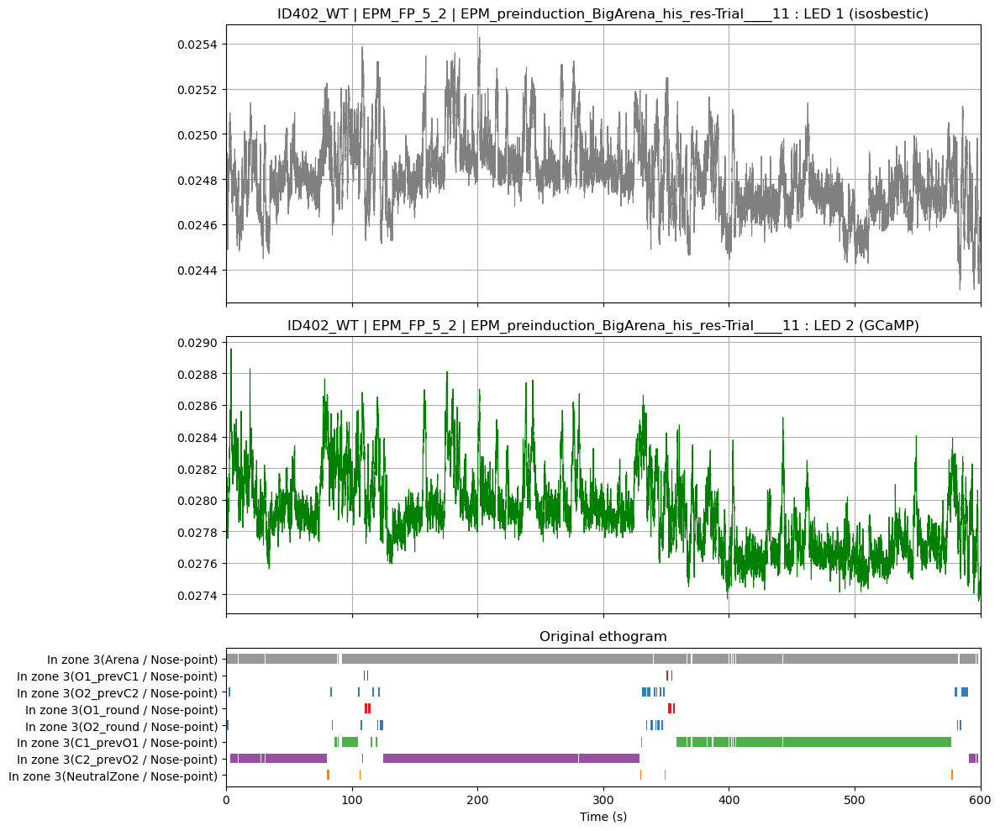

In [6]:
fig, axes = plt.subplots(3, 1, figsize=(12, 10), sharex=True,
                         gridspec_kw={"height_ratios": [2, 2, 1]})

# --- FP traces ---
chan = "G0" if "G0" in fp_trim.columns else next(
    c for c in fp_trim.columns
    if pd.api.types.is_numeric_dtype(fp_trim[c])
    and c not in {"LedState","SystemTimestamp","Time_video","Timestamp"}
)

# LED 1
fp1 = fp_trim[fp_trim["LedState"] == 1]
axes[0].plot(fp1["Time_video"], fp1[chan], linewidth=0.8, color="gray")
axes[0].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 1 (isosbestic)")
axes[0].grid(True)

# LED 2
fp2 = fp_trim[fp_trim["LedState"] == 2]
axes[1].plot(fp2["Time_video"], fp2[chan], linewidth=0.8, color="green")
axes[1].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 2 (GCaMP)")
axes[1].grid(True)

# --- Original ethogram ---
beh_cols_orig = timeline["Behavior"].unique()
for i, beh in enumerate(beh_cols_orig):
    color = _guess_zone_color(beh)
    subset = timeline[timeline["Behavior"] == beh]
    for _, row in subset.iterrows():
        axes[2].barh(i, row["Duration_s"], left=row["Start_time_s"], height=0.6, color=color)

axes[2].set_yticks(range(len(beh_cols_orig)))
axes[2].set_yticklabels(beh_cols_orig)
axes[2].invert_yaxis()
axes[2].set_xlabel("Time (s)")
axes[2].set_title("Original ethogram")

plt.tight_layout()
plt.show()


In [7]:
timeline_filter = timeline[timeline['Behavior']  != 'In zone(Arena / Nose-point)'].sort_values('Start_time_s')
timeline_filter

,Behavior,Start_time_s,End_time_s,Duration_s
0,In zone 3(Arena / Nose-point),0.000,1.240,1.24
174,In zone 3(O2_round / Nose-point),0.000,0.440,0.44
119,In zone 3(O2_prevC2 / Nose-point),0.440,0.900,0.46
175,In zone 3(O2_round / Nose-point),0.900,1.240,0.34
176,In zone 3(O2_round / Nose-point),1.681,1.801,0.12
...,...,...,...,...
108,In zone 3(Arena / Nose-point),599.360,599.500,0.14
109,In zone 3(Arena / Nose-point),599.560,599.840,0.28
386,In zone 3(C2_prevO2 / Nose-point),599.560,599.840,0.28
110,In zone 3(Arena / Nose-point),600.020,600.020,0.00


Issues: 
- fix residual time introduced in arranged (add to last timestamp? next iteration start from previous?)

In [8]:
def smoothing_kernel(data, grainularity = 0.1, kernel_size = 5):
    """
    Smooths timeline data using a kernel.

    Args:
        data (pd.DataFrame): Timeline data.
        grainularity (float): The grainularity that the timeline data should be split up with (seconds).
        kernel_size (int): The number of 'frames' (defined by the grainularity) the kernel looks ahead 
        and behind when determining the new lable.

    Returns:
        pd.DataFrame: The timeline data reassembled with the new labels in the column 'kernel_label'.
    """
    timeline_exploded = pd.DataFrame({'timestamp' : [], 'label' : []})

    #def explode_timeline(timeline, grainularity):
    for _, row in data.iterrows():
        # timestamps = np.arange(row['Start_time_s'], row['End_time_s'], grainularity)
        timestamps = np.arange(row['Start_time_s'], row['End_time_s'] + grainularity, grainularity)

        labels = row['Behavior'] #* len(timestamps)

        timeline_exploded = pd.concat([timeline_exploded, 
                                       pd.DataFrame({'timestamp' : timestamps, 'label' : labels})])

    timeline_exploded = timeline_exploded.reset_index()

    kernel_content = []

    def most_common(lst):
        return max(set(lst), key=lst.count)

    new_labels = []

    for i, row in timeline_exploded.iterrows():
        if i < kernel_size:
            kernel_content = timeline_exploded[ : i + kernel_size]['label']

        elif i + kernel_size > len(timeline_exploded):
            kernel_content = timeline_exploded[i - (kernel_size - 1) : ]['label']

        else:
            kernel_content = timeline_exploded[i - (kernel_size - 1) : i + kernel_size]['label']
        
        new_labels.append(most_common(kernel_content.to_list()))

    timeline_exploded['kernel_label'] = new_labels

    current_label = ''

    timeline_kernel_labels = pd.DataFrame()


    # After your existing loop that builds timeline_kernel_labels
    for i, row in timeline_exploded.iterrows():
        if current_label == row['kernel_label']:
            pass
        elif current_label == '':
            current_label = row['kernel_label']
            Start_time_s = row['timestamp']
        elif current_label != row['kernel_label']:
            timeline_kernel_labels = pd.concat([timeline_kernel_labels,
                                                pd.DataFrame({
                                                    'Behavior' : [current_label],
                                                    'Start_time_s' : [Start_time_s],
                                                    'End_time_s' : row['timestamp'],
                                                    'Duration_s' : row['timestamp'] - Start_time_s
                                                })])
            Start_time_s = row['timestamp']
            current_label = row['kernel_label']

    # --- Append the final segment ---
    if current_label != '':
        timeline_kernel_labels = pd.concat([timeline_kernel_labels,
                                            pd.DataFrame({
                                                'Behavior': [current_label],
                                                'Start_time_s': [Start_time_s],
                                                'End_time_s': [timeline_exploded['timestamp'].iloc[-1]],
                                                'Duration_s': [timeline_exploded['timestamp'].iloc[-1] - Start_time_s]
                                            })])
   # code for removing anything shorter than 1 s
    # --- Append the final segment ---
    if current_label != '':
        timeline_kernel_labels = pd.concat([timeline_kernel_labels,
                                            pd.DataFrame({
                                                'Behavior': [current_label],
                                                'Start_time_s': [Start_time_s],
                                                'End_time_s': [timeline_exploded['timestamp'].iloc[-1]],
                                                'Duration_s': [timeline_exploded['timestamp'].iloc[-1] - Start_time_s]
                                            })])

    # --- FILTER: Remove segments shorter than 1 second ---
    timeline_kernel_labels = timeline_kernel_labels[timeline_kernel_labels['Duration_s'] >= 1.0].reset_index(drop=True)



    return timeline_kernel_labels

timeline_filter = timeline[timeline['Behavior']  != 'In zone(Arena / Nose-point)'].sort_values('Start_time_s')
timeline_filter
timeline_kernel_labels = smoothing_kernel(timeline_filter, grainularity = 0.1, kernel_size = 50) #when granulairty is 0.1, it says every frame represents 0.1 second. the smaller granulairty, the less the end pieces weigh in the decision to what behaviour is being conducted




In [9]:
timeline_kernel_labels

,Behavior,Start_time_s,End_time_s,Duration_s
0,In zone 3(Arena / Nose-point),0.000,2.861,2.861
1,In zone 3(C2_prevO2 / Nose-point),2.861,14.444,11.583
2,In zone 3(Arena / Nose-point),14.444,15.585,1.141
3,In zone 3(C2_prevO2 / Nose-point),15.585,34.530,18.945
4,In zone 3(Arena / Nose-point),34.530,54.456,19.926
5,In zone 3(C2_prevO2 / Nose-point),54.456,60.438,5.982
6,In zone 3(Arena / Nose-point),60.438,65.620,5.182
7,In zone 3(C2_prevO2 / Nose-point),65.620,73.802,8.182
8,In zone 3(Arena / Nose-point),73.802,78.823,5.021
9,In zone 3(NeutralZone / Nose-point),78.823,84.145,5.322


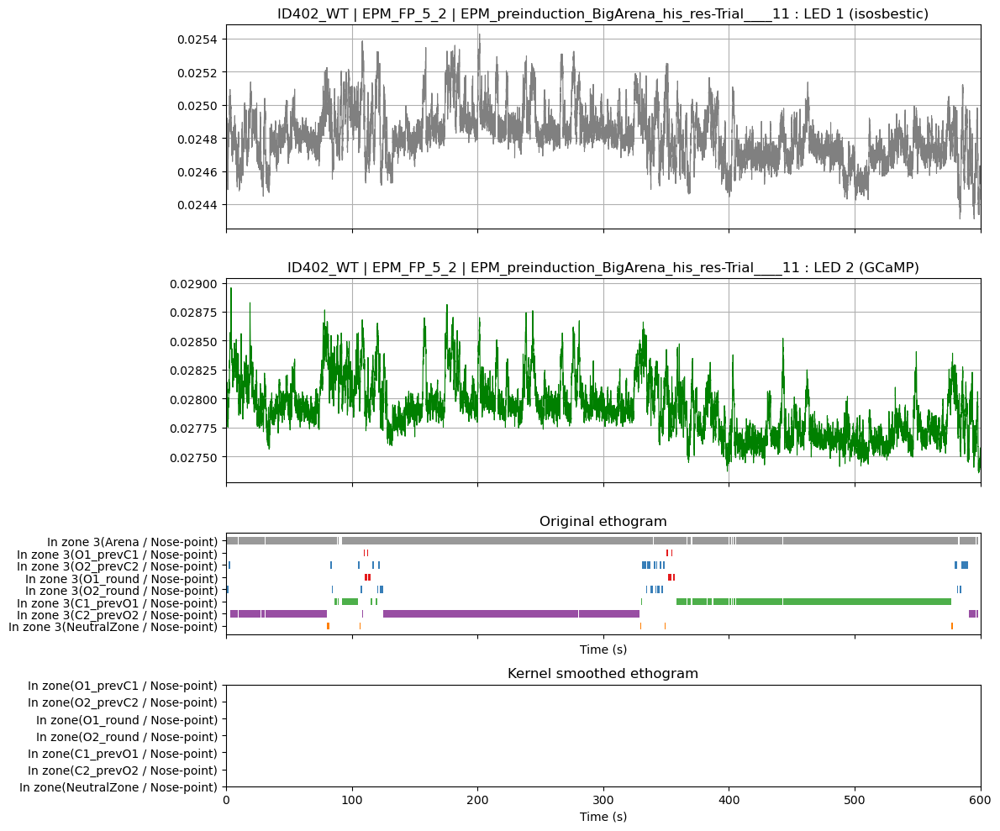

In [10]:
fig, axes = plt.subplots(4, 1, figsize=(12, 10), sharex=True,
                         gridspec_kw={"height_ratios": [2, 2,1, 1]})

# --- FP traces ---
chan = "G0" if "G0" in fp_trim.columns else next(
    c for c in fp_trim.columns
    if pd.api.types.is_numeric_dtype(fp_trim[c])
    and c not in {"LedState","SystemTimestamp","Time_video","Timestamp"}
)

# LED 1
fp1 = fp_trim[fp_trim["LedState"] == 1]
axes[0].plot(fp1["Time_video"], fp1[chan], linewidth=0.8, color="gray")
axes[0].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 1 (isosbestic)")
axes[0].grid(True)

# LED 2
fp2 = fp_trim[fp_trim["LedState"] == 2]
axes[1].plot(fp2["Time_video"], fp2[chan], linewidth=0.8, color="green")
axes[1].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 2 (GCaMP)")
axes[1].grid(True)

# --- Original ethogram ---
beh_cols_orig = timeline["Behavior"].unique()
for i, beh in enumerate(beh_cols_orig):
    color = _guess_zone_color(beh)
    subset = timeline[timeline["Behavior"] == beh]
    for _, row in subset.iterrows():
        axes[2].barh(i, row["Duration_s"], left=row["Start_time_s"], height=0.6, color=color)

axes[2].set_yticks(range(len(beh_cols_orig)))
axes[2].set_yticklabels(beh_cols_orig)
axes[2].invert_yaxis()
axes[2].set_xlabel("Time (s)")
axes[2].set_title("Original ethogram")

# --- Cleaned / collapsed ethogram ---
timeline_kernel_labels = smoothing_kernel(timeline_filter, grainularity = 0.1, kernel_size = 20) #play around with adjusting kernel size and granularity
#beh_cols_clean = timeline_kernel_labels["Behavior"].unique()
beh_cols_clean = [ # samme rækkefølge som plottet ovenfor
'In zone(O1_prevC1 / Nose-point)',
'In zone(O2_prevC2 / Nose-point)',
'In zone(O1_round / Nose-point)',
'In zone(O2_round / Nose-point)',
'In zone(C1_prevO1 / Nose-point)',
'In zone(C2_prevO2 / Nose-point)',
'In zone(NeutralZone / Nose-point)'
]
for i, beh in enumerate(beh_cols_clean):
    color = _guess_zone_color(beh)
    subset = timeline_kernel_labels[timeline_kernel_labels["Behavior"] == beh]
    for _, row in subset.iterrows():
        axes[3].barh(i, row["Duration_s"], left=row["Start_time_s"], height=0.6, color=color)

axes[3].set_yticks(range(len(beh_cols_clean)))
axes[3].set_yticklabels(beh_cols_clean)
axes[3].invert_yaxis()
axes[3].set_xlabel("Time (s)")
axes[3].set_title("Kernel smoothed ethogram")

plt.tight_layout()
plt.show()


In [11]:
# sanity check - number of entries into different zones

# --- Count occurrences for each behavior in this kernel-smoothed ethogram ---
print("\nKernel-smoothed ethogram occurrences (as plotted):")

for beh in beh_cols_clean:
    subset = timeline_kernel_labels[timeline_kernel_labels["Behavior"] == beh]
    n_occurrences = len(subset)
    print(f"{beh}: {n_occurrences} instance(s)")

    # Optional: print detailed start/end/duration
    for idx, row in subset.iterrows():
        print(f"  Start: {row['Start_time_s']:.3f}, "
              f"End: {row['End_time_s']:.3f}, "
              f"Duration: {row['Duration_s']:.3f}")



Kernel-smoothed ethogram occurrences (as plotted):
In zone(O1_prevC1 / Nose-point): 0 instance(s)
In zone(O2_prevC2 / Nose-point): 0 instance(s)
In zone(O1_round / Nose-point): 0 instance(s)
In zone(O2_round / Nose-point): 0 instance(s)
In zone(C1_prevO1 / Nose-point): 0 instance(s)
In zone(C2_prevO2 / Nose-point): 0 instance(s)
In zone(NeutralZone / Nose-point): 0 instance(s)


In [12]:
print(timeline_kernel_labels) # check around 455, there are smoe very short instances

                               Behavior  Start_time_s  End_time_s  Duration_s
0         In zone 3(Arena / Nose-point)         0.100       2.101       2.001
1     In zone 3(O2_prevC2 / Nose-point)         2.101       3.341       1.240
2     In zone 3(C2_prevO2 / Nose-point)         3.341      10.283       6.942
3         In zone 3(Arena / Nose-point)        10.283      12.003       1.720
4         In zone 3(Arena / Nose-point)        12.344      15.585       3.241
..                                  ...           ...         ...         ...
60  In zone 3(NeutralZone / Nose-point)       577.113     578.794       1.681
61    In zone 3(O2_prevC2 / Nose-point)       578.794     581.754       2.960
62     In zone 3(O2_round / Nose-point)       581.754     584.735       2.981
63    In zone 3(O2_prevC2 / Nose-point)       584.755     590.317       5.562
64    In zone 3(C2_prevO2 / Nose-point)       590.317     595.558       5.241

[65 rows x 4 columns]


# generate the above plot for all trials

In [13]:
#print(timeline_kernel_labels['Behavior'].unique())

print(timeline_kernel_labels['Behavior'].unique())

['In zone 3(Arena / Nose-point)' 'In zone 3(O2_prevC2 / Nose-point)'
 'In zone 3(C2_prevO2 / Nose-point)' 'In zone 3(NeutralZone / Nose-point)'
 'In zone 3(O2_round / Nose-point)' 'In zone 3(C1_prevO1 / Nose-point)'
 'In zone 3(O1_round / Nose-point)']


In [14]:
list(fp_traces.keys())

['Preinduction__ID376_NE__EPM_FP0_1__EPM_preinduction_BigArena_his_res-Trial_____1',
 'Preinduction__ID372_NE__EPM_FP1_1__EPM_preinduction_BigArena_his_res-Trial_____2',
 'Preinduction__ID374_WT__EPM_FP2_1__EPM_preinduction_BigArena_his_res-Trial_____3',
 'Preinduction__ID429_WT__EPM_FP3_1__EPM_preinduction_BigArena_his_res-Trial_____4',
 'Preinduction__ID423_NE__EPM_FP5_1__EPM_preinduction_BigArena_his_res-Trial_____5',
 'Preinduction__ID463_WT__EPM_FP_0_2__EPM_preinduction_BigArena_his_res-Trial_____7',
 'Preinduction__ID459_NE__EPM_FP_1_2__EPM_preinduction_BigArena_his_res-Trial_____8',
 'Preinduction__ID398_NE__EPM_FP_3_2__EPM_preinduction_BigArena_his_res-Trial_____9',
 'Preinduction__ID400_NE__EPM_FP_4_2__EPM_preinduction_BigArena_his_res-Trial____10']

In [15]:
timeline_kernel_labels

,Behavior,Start_time_s,End_time_s,Duration_s
0,In zone 3(Arena / Nose-point),0.100,2.101,2.001
1,In zone 3(O2_prevC2 / Nose-point),2.101,3.341,1.240
2,In zone 3(C2_prevO2 / Nose-point),3.341,10.283,6.942
3,In zone 3(Arena / Nose-point),10.283,12.003,1.720
4,In zone 3(Arena / Nose-point),12.344,15.585,3.241
...,...,...,...,...
60,In zone 3(NeutralZone / Nose-point),577.113,578.794,1.681
61,In zone 3(O2_prevC2 / Nose-point),578.794,581.754,2.960
62,In zone 3(O2_round / Nose-point),581.754,584.735,2.981
63,In zone 3(O2_prevC2 / Nose-point),584.755,590.317,5.562


In [16]:
timeline_kernel_labels.sort_values('Start_time_s')

,Behavior,Start_time_s,End_time_s,Duration_s
0,In zone 3(Arena / Nose-point),0.100,2.101,2.001
1,In zone 3(O2_prevC2 / Nose-point),2.101,3.341,1.240
2,In zone 3(C2_prevO2 / Nose-point),3.341,10.283,6.942
3,In zone 3(Arena / Nose-point),10.283,12.003,1.720
4,In zone 3(Arena / Nose-point),12.344,15.585,3.241
...,...,...,...,...
60,In zone 3(NeutralZone / Nose-point),577.113,578.794,1.681
61,In zone 3(O2_prevC2 / Nose-point),578.794,581.754,2.960
62,In zone 3(O2_round / Nose-point),581.754,584.735,2.981
63,In zone 3(O2_prevC2 / Nose-point),584.755,590.317,5.562


In [17]:
def nose_point_fixer(data):
    """
    1) Adds missing 'prevC' nose-point rows when 'round' nose-point rows appear.
    2) Merges consecutive observations with the same behavior if they are timewise connected.
    """

    # --- Step 1: Add missing prevC rows ---
    for i in range(len(data)):
        row = data.iloc[i]

        # O1
        if 'O1_round / Nose-point' in row.Behavior:
            behavior = [b for b in timeline_kernel_labels.Behavior.unique()
                        if 'O1_prevC1 / Nose-point' in b][0]

            new_row = {
                'Behavior': behavior,
                'Start_time_s': row.Start_time_s,
                'End_time_s': row.End_time_s,
                'Duration_s': row.Duration_s,
            }
            data.loc[len(data)] = new_row

        # O2
        if 'O2_round / Nose-point' in row.Behavior:
            behavior = [b for b in timeline_kernel_labels.Behavior.unique()
                        if 'O2_prevC2 / Nose-point' in b][0]

            new_row = {
                'Behavior': behavior,
                'Start_time_s': row.Start_time_s,
                'End_time_s': row.End_time_s,
                'Duration_s': row.Duration_s,
            }
            data.loc[len(data)] = new_row

    # Sort after adding rows
    data = data.sort_values("Start_time_s").reset_index(drop=True)

    # --- Step 2: Merge consecutive rows with same behavior ---
    merged = []
    current = data.iloc[0].copy()

    for i in range(1, len(data)):
        row = data.iloc[i]

        # If same behavior AND timewise connected (touching or overlapping)
        if (row.Behavior == current.Behavior) and (row.Start_time_s <= current.End_time_s):
            # Extend the current interval
            current.End_time_s = max(current.End_time_s, row.End_time_s)
            current.Duration_s = current.End_time_s - current.Start_time_s
        else:
            # Save finished interval
            merged.append(current)
            current = row.copy()

    # Append last interval
    merged.append(current)

    # Convert back to DataFrame
    merged_df = pd.DataFrame(merged)

    return merged_df


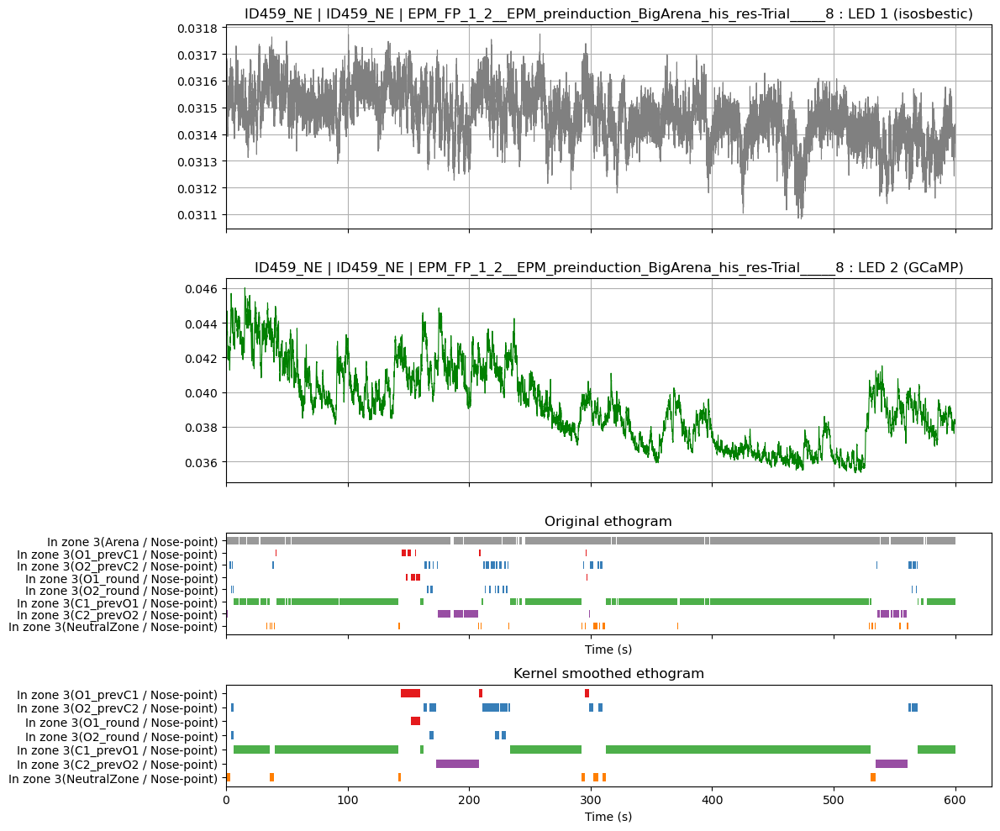

In [18]:
# test on one trial


# ==========================================================
# Apply smoothing_kernel and plot kernel-smoothed ethograms for all trials
# ==========================================================

#for trial_key, trial_data in fp_traces.items():
#trial_key = 'Preinduction__ID374_WT__EPM_FP2_1__EPM_preinduction_BigArena_his_res-Trial_____3'
trial_key = 'Preinduction__ID459_NE__EPM_FP_1_2__EPM_preinduction_BigArena_his_res-Trial_____8'
#trial_key = 'W2__ID429_WT__EPM_FP4_1__EPM_W2_C1-Trial_____5'

trial_data = fp_traces[trial_key]
try:
    # Extract FP traces and timeline
    iso_df = trial_data["iso"]
    gcamp_df = trial_data["gcamp"]
    timeline = trial_data["timeline"]
    mouse_label = f"ID{trial_data['mouse_id']}" + (f"_{trial_data['genotype']}" if trial_data['genotype'] else "")
    fp_id = trial_key.split("__")[1]
    trial_stub = "__".join(trial_key.split("__")[2:])
    # # Filter out arena zone before smoothing
    # timeline_filter = timeline[timeline['Behavior'] != 'In zone(Arena / Nose-point)'] \
    #                   .sort_values('Start_time_s')
    # # Apply your original smoothing kernel
    # timeline_kernel_labels = smoothing_kernel(timeline_filter, grainularity=0.1, kernel_size=20)
    # Filter out arena zone before smoothing
    timeline_filter = timeline[
        ~timeline['Behavior'].str.contains('Arena / Nose-point', case=False)
    ].sort_values('Start_time_s')
    # Apply your original smoothing kernel
    timeline_kernel_labels = smoothing_kernel(timeline_filter, grainularity=0.1, kernel_size=20)
    # enlongate flanking segments
    #print(timeline_kernel_labels)
    #print("DIVIDE")
    timeline_kernel_labels = nose_point_fixer(timeline_kernel_labels)
    #print(timeline_kernel_labels)
    
    # Store kernel-smoothed timeline for later access
    trial_data["timeline_kernel"] = timeline_kernel_labels
    # Plot
    fig, axes = plt.subplots(4, 1, figsize=(12, 10), sharex=True,
                             gridspec_kw={"height_ratios": [2, 2, 1, 1]})
    # --- FP traces ---
    iso_col = [c for c in iso_df.columns if c != "Time_video"][0]    # dynamically get numeric column
    gcamp_col = [c for c in gcamp_df.columns if c != "Time_video"][0]
    axes[0].plot(iso_df["Time_video"], iso_df[iso_col], linewidth=0.8, color="gray")
    axes[0].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 1 (isosbestic)")
    axes[0].grid(True)
    axes[1].plot(gcamp_df["Time_video"], gcamp_df[gcamp_col], linewidth=0.8, color="green")
    axes[1].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 2 (GCaMP)")
    axes[1].grid(True)
    # --- Original ethogram ---
    beh_cols_orig = trial_data["beh_cols"]
    for i, beh in enumerate(beh_cols_orig):
        color = _guess_zone_color(beh)
        subset = timeline[timeline["Behavior"] == beh]
        for _, row in subset.iterrows():
            axes[2].barh(i, row["Duration_s"], left=row["Start_time_s"], height=0.6, color=color)
    axes[2].set_yticks(range(len(beh_cols_orig)))
    axes[2].set_yticklabels(beh_cols_orig)
    axes[2].invert_yaxis()
    axes[2].set_xlabel("Time (s)")
    axes[2].set_title("Original ethogram")
    # --- Kernel-smoothed ethogram ---
    beh_cols_clean = [b for b in beh_cols_orig if 'Arena / Nose-point' not in b]  # same order as original, arena removed
    for i, beh in enumerate(beh_cols_clean):
        color = _guess_zone_color(beh)
        subset = timeline_kernel_labels[timeline_kernel_labels["Behavior"] == beh]
        for _, row in subset.iterrows():
            axes[3].barh(i, row["Duration_s"], left=row["Start_time_s"], height=0.6, color=color)
    axes[3].set_yticks(range(len(beh_cols_clean)))
    axes[3].set_yticklabels(beh_cols_clean)
    axes[3].invert_yaxis()
    axes[3].set_xlabel("Time (s)")
    axes[3].set_title("Kernel smoothed ethogram")
    plt.tight_layout()
    plt.show()
except Exception as e:
    print(f"[WARN] Could not plot trial {trial_key}: {e}")

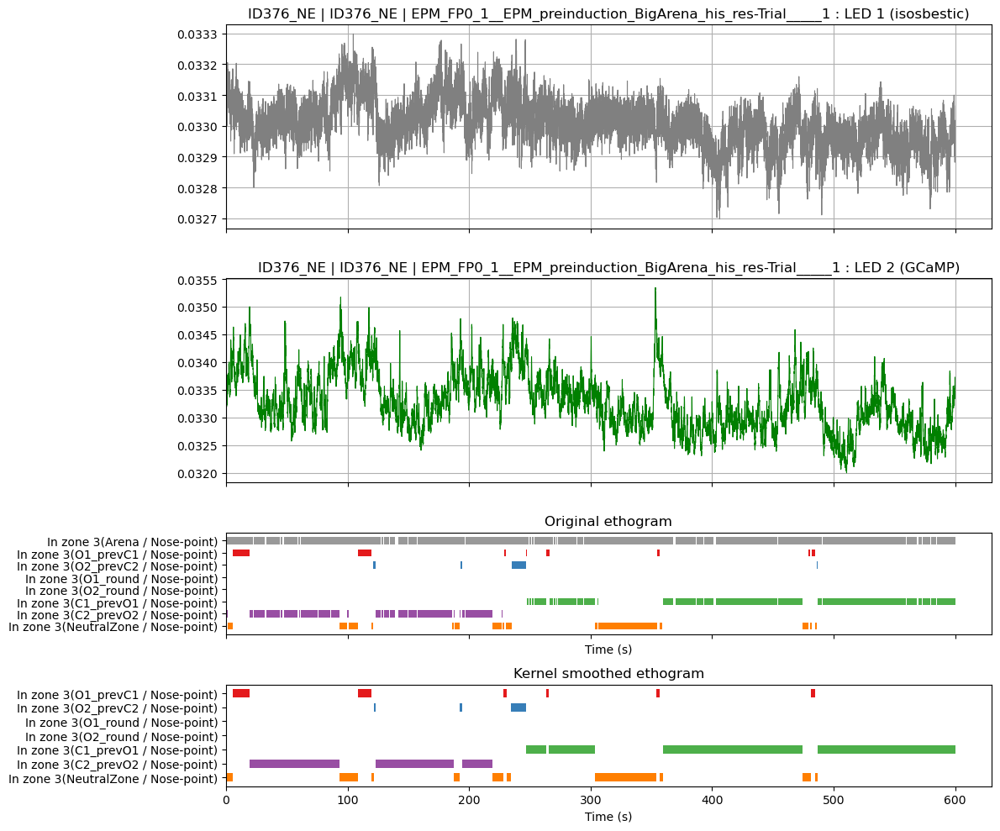

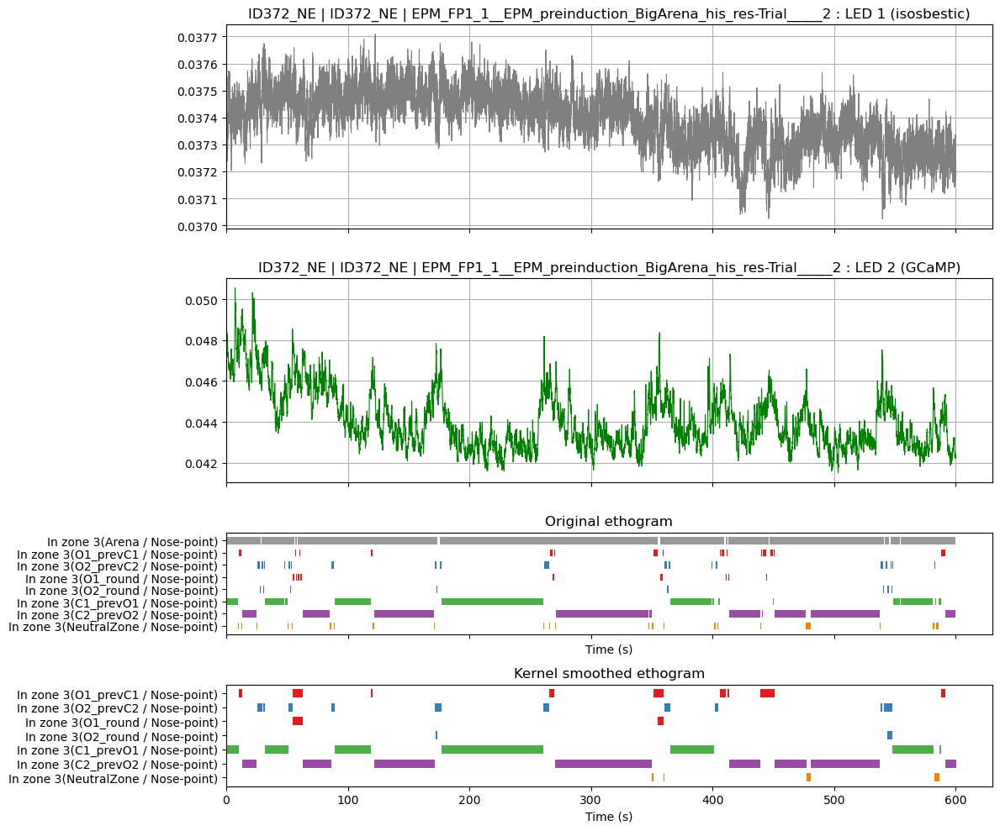

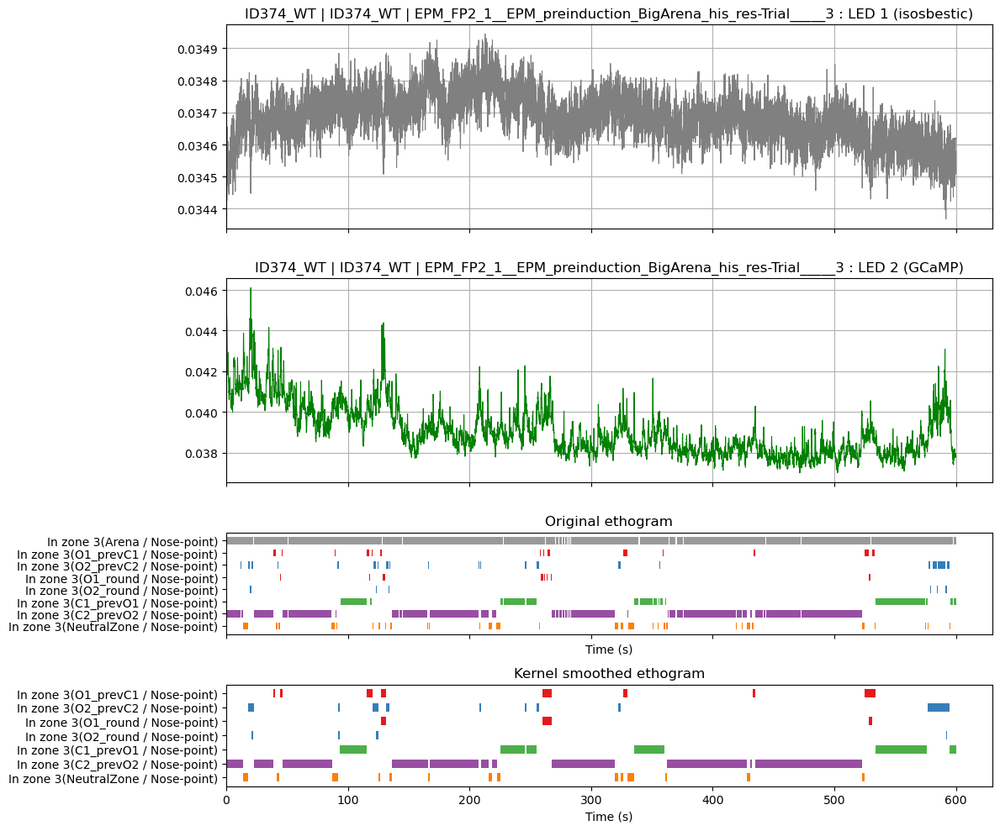

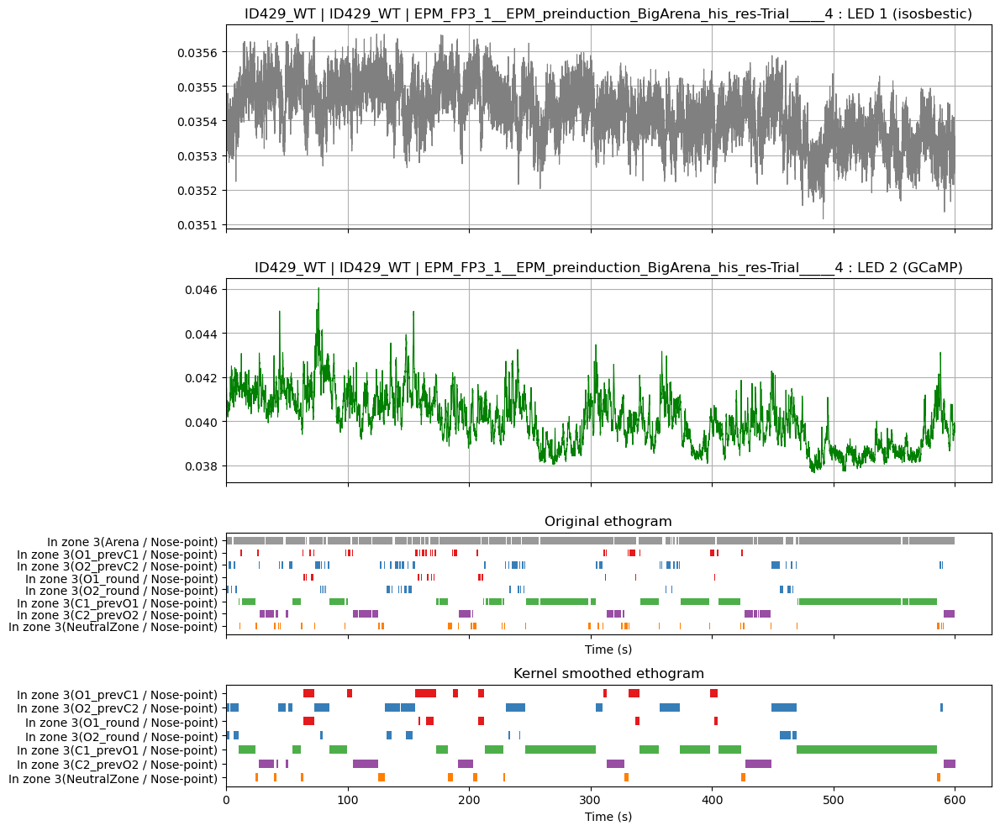

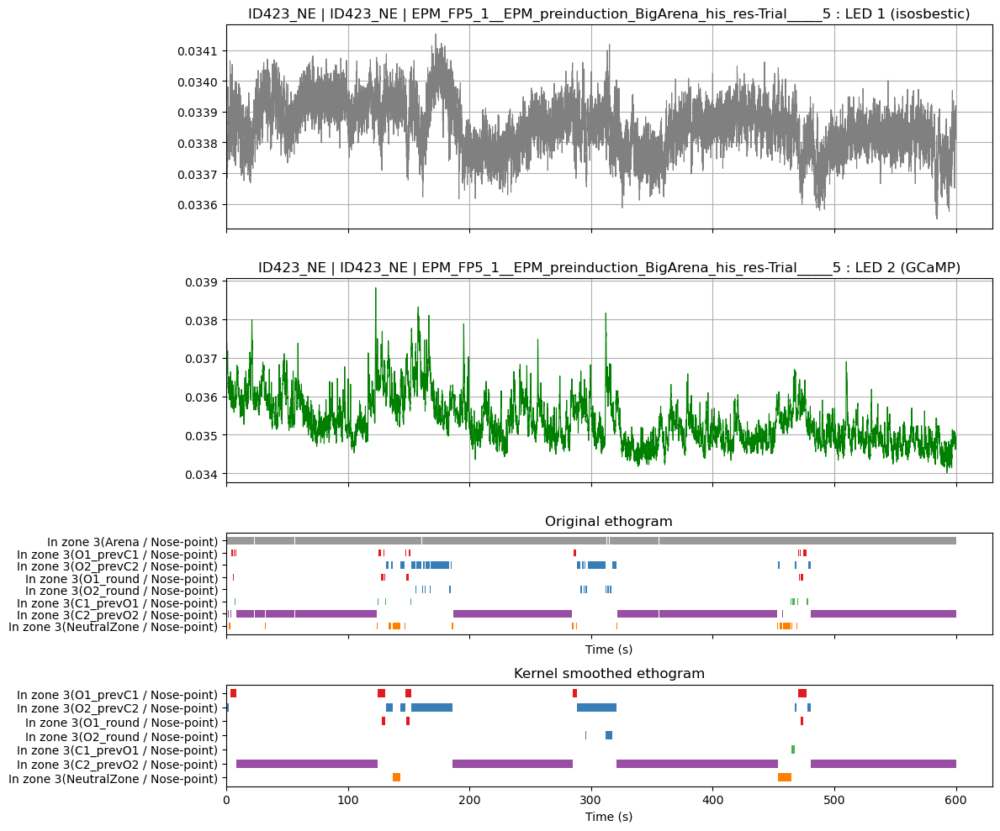

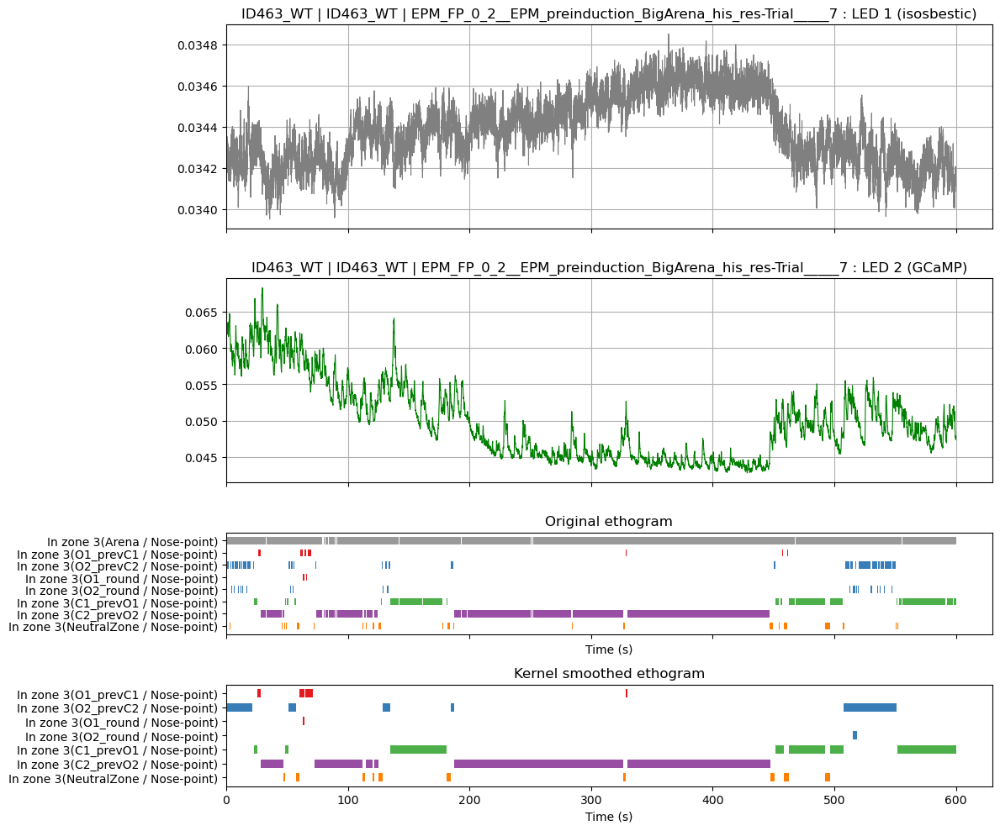

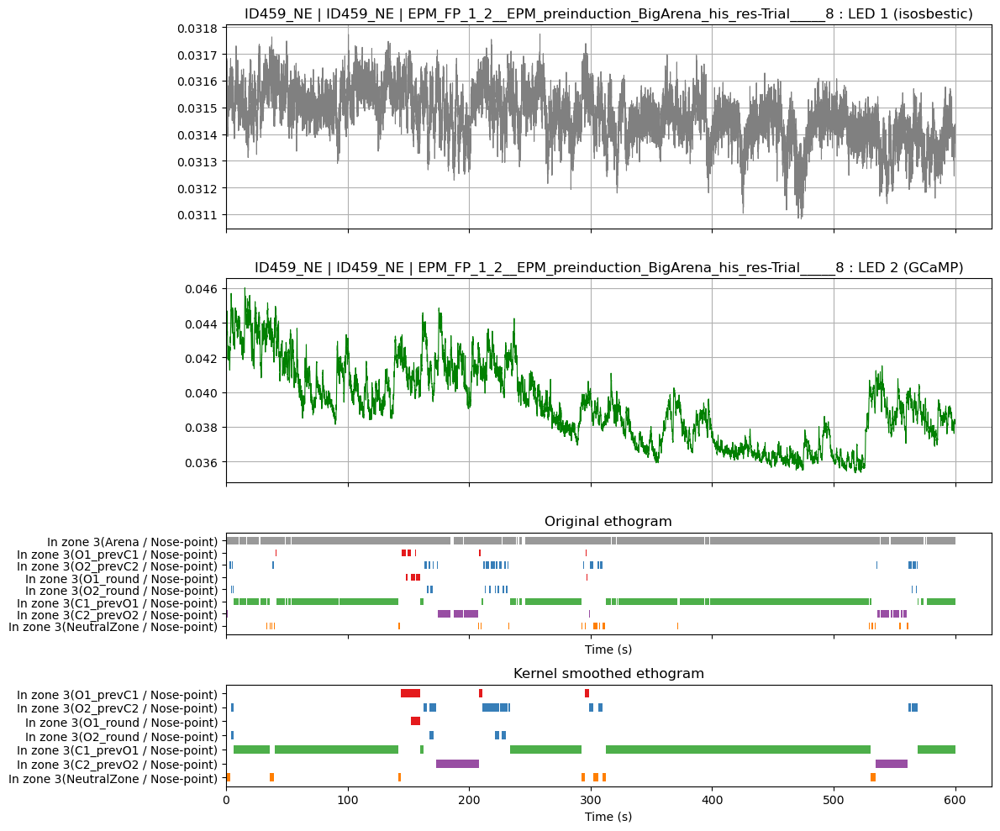

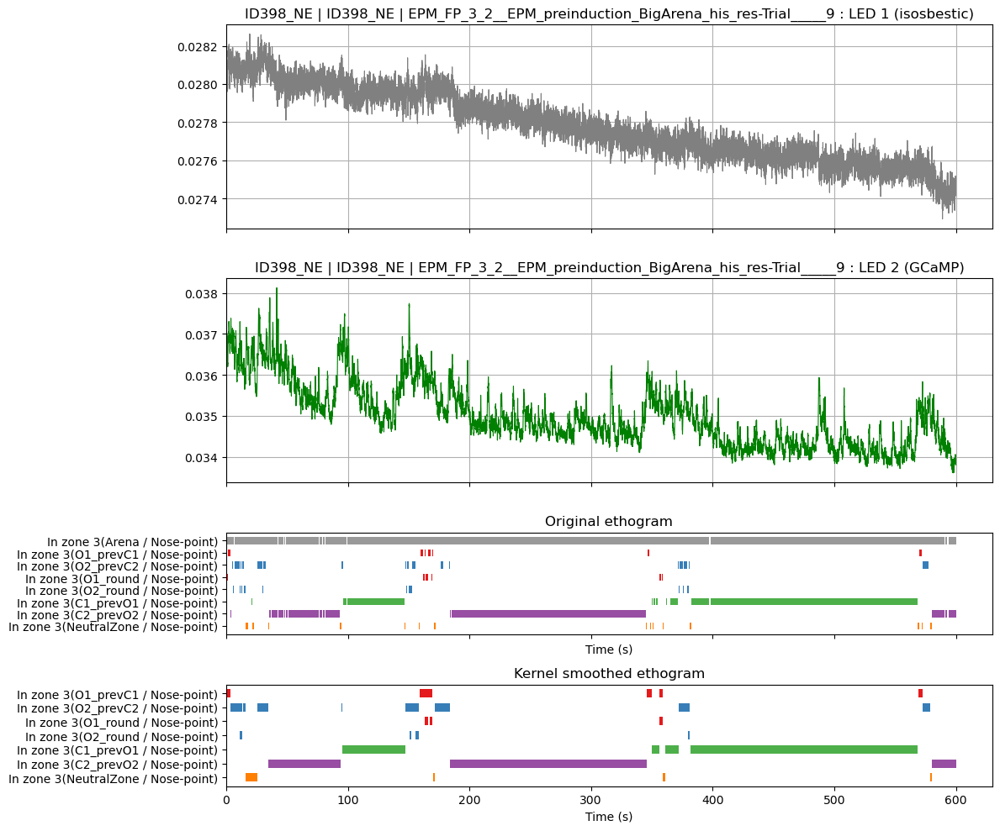

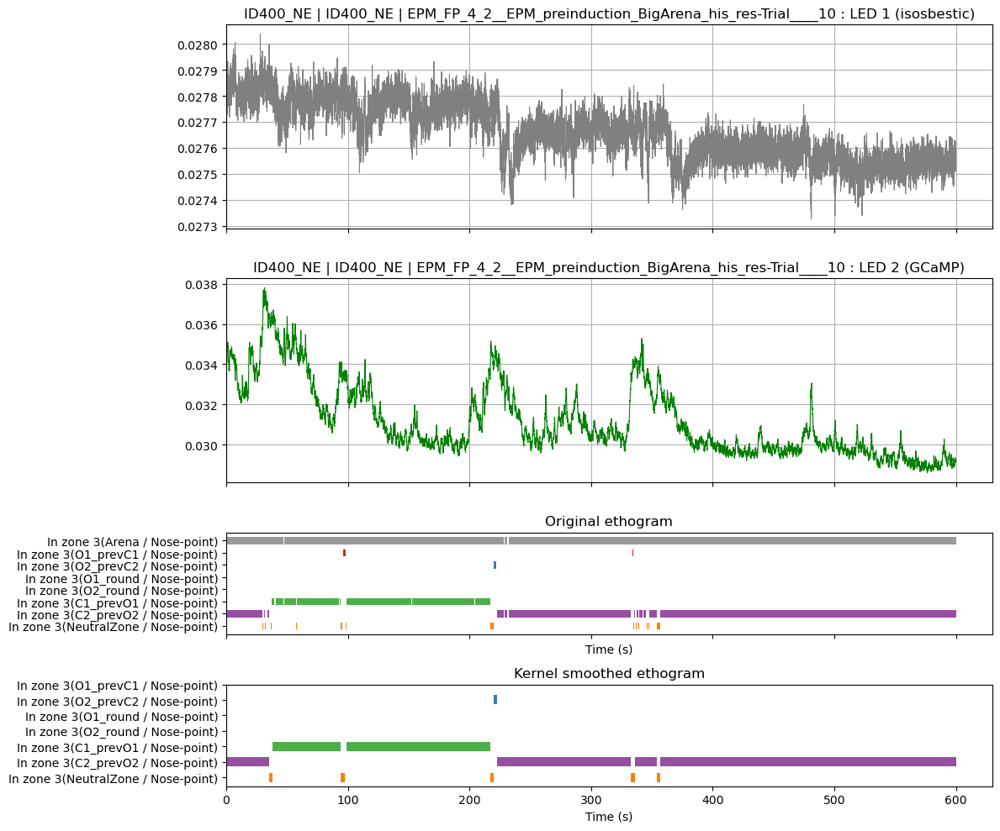

In [19]:
# ==========================================================
# Apply smoothing_kernel and plot kernel-smoothed ethograms for all trials
# ==========================================================

for trial_key, trial_data in fp_traces.items():
    try:
        # Extract FP traces and timeline
        iso_df = trial_data["iso"]
        gcamp_df = trial_data["gcamp"]
        timeline = trial_data["timeline"]
        mouse_label = f"ID{trial_data['mouse_id']}" + (f"_{trial_data['genotype']}" if trial_data['genotype'] else "")
        fp_id = trial_key.split("__")[1]
        trial_stub = "__".join(trial_key.split("__")[2:])

        # # Filter out arena zone before smoothing
        # timeline_filter = timeline[timeline['Behavior'] != 'In zone(Arena / Nose-point)'] \
        #                   .sort_values('Start_time_s')

        # # Apply your original smoothing kernel
        # timeline_kernel_labels = smoothing_kernel(timeline_filter, grainularity=0.1, kernel_size=20)
        # Filter out arena zone before smoothing
        timeline_filter = timeline[
            ~timeline['Behavior'].str.contains('Arena / Nose-point', case=False)
        ].sort_values('Start_time_s')

        # Apply your original smoothing kernel
        timeline_kernel_labels = smoothing_kernel(timeline_filter, grainularity=0.1, kernel_size=20)
        timeline_kernel_labels = nose_point_fixer(timeline_kernel_labels)
        
        # Store kernel-smoothed timeline for later access
        trial_data["timeline_kernel"] = timeline_kernel_labels


        # Plot
        fig, axes = plt.subplots(4, 1, figsize=(12, 10), sharex=True,
                                 gridspec_kw={"height_ratios": [2, 2, 1, 1]})

        # --- FP traces ---
        iso_col = [c for c in iso_df.columns if c != "Time_video"][0]    # dynamically get numeric column
        gcamp_col = [c for c in gcamp_df.columns if c != "Time_video"][0]

        axes[0].plot(iso_df["Time_video"], iso_df[iso_col], linewidth=0.8, color="gray")
        axes[0].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 1 (isosbestic)")
        axes[0].grid(True)

        axes[1].plot(gcamp_df["Time_video"], gcamp_df[gcamp_col], linewidth=0.8, color="green")
        axes[1].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 2 (GCaMP)")
        axes[1].grid(True)

        # --- Original ethogram ---
        beh_cols_orig = trial_data["beh_cols"]
        for i, beh in enumerate(beh_cols_orig):
            color = _guess_zone_color(beh)
            subset = timeline[timeline["Behavior"] == beh]
            for _, row in subset.iterrows():
                axes[2].barh(i, row["Duration_s"], left=row["Start_time_s"], height=0.6, color=color)

        axes[2].set_yticks(range(len(beh_cols_orig)))
        axes[2].set_yticklabels(beh_cols_orig)
        axes[2].invert_yaxis()
        axes[2].set_xlabel("Time (s)")
        axes[2].set_title("Original ethogram")

        # --- Kernel-smoothed ethogram ---
        beh_cols_clean = [b for b in beh_cols_orig if 'Arena / Nose-point' not in b]  # same order as original, arena removed
        for i, beh in enumerate(beh_cols_clean):
            color = _guess_zone_color(beh)
            subset = timeline_kernel_labels[timeline_kernel_labels["Behavior"] == beh]
            for _, row in subset.iterrows():
                axes[3].barh(i, row["Duration_s"], left=row["Start_time_s"], height=0.6, color=color)

        axes[3].set_yticks(range(len(beh_cols_clean)))
        axes[3].set_yticklabels(beh_cols_clean)
        axes[3].invert_yaxis()
        axes[3].set_xlabel("Time (s)")
        axes[3].set_title("Kernel smoothed ethogram")



        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"[WARN] Could not plot trial {trial_key}: {e}")


In [20]:
for trial_key, trial_data in fp_traces.items():
    print(f"\nTrial: {trial_key}")
    if "timeline_kernel" not in trial_data:
        print("  No kernel-smoothed ethogram found.")
        continue

    tk = trial_data["timeline_kernel"]

    # Count number of separate occurrences for each behavior
    counts = tk["Behavior"].value_counts()
    for beh, n in counts.items():
        print(f"  {beh}: {n} instance(s)")



Trial: Preinduction__ID376_NE__EPM_FP0_1__EPM_preinduction_BigArena_his_res-Trial_____1
  In zone 3(NeutralZone / Nose-point): 10 instance(s)
  In zone 3(O1_prevC1 / Nose-point): 6 instance(s)
  In zone 3(C1_prevO1 / Nose-point): 4 instance(s)
  In zone 3(C2_prevO2 / Nose-point): 3 instance(s)
  In zone 3(O2_prevC2 / Nose-point): 3 instance(s)

Trial: Preinduction__ID372_NE__EPM_FP1_1__EPM_preinduction_BigArena_his_res-Trial_____2
  In zone 3(O2_prevC2 / Nose-point): 12 instance(s)
  In zone 3(O1_prevC1 / Nose-point): 11 instance(s)
  In zone 3(C2_prevO2 / Nose-point): 8 instance(s)
  In zone 3(C1_prevO1 / Nose-point): 7 instance(s)
  In zone 3(NeutralZone / Nose-point): 4 instance(s)
  In zone 3(O1_round / Nose-point): 3 instance(s)
  In zone 3(O2_round / Nose-point): 2 instance(s)

Trial: Preinduction__ID374_WT__EPM_FP2_1__EPM_preinduction_BigArena_his_res-Trial_____3
  In zone 3(NeutralZone / Nose-point): 14 instance(s)
  In zone 3(O2_prevC2 / Nose-point): 12 instance(s)
  In zone 

In [21]:
# Get the last trial key
last_key = list(fp_traces.keys())[-1]
trial_data = fp_traces[last_key]

print(f"Full kernel-smoothed timeline for trial: {last_key}\n")

if "timeline_kernel" in trial_data:
    tk = trial_data["timeline_kernel"]
    # Print all columns
    print(tk.to_string(index=False))
else:
    print("No kernel-smoothed ethogram found for this trial.")


Full kernel-smoothed timeline for trial: Preinduction__ID400_NE__EPM_FP_4_2__EPM_preinduction_BigArena_his_res-Trial____10

                           Behavior  Start_time_s  End_time_s  Duration_s
  In zone 3(C2_prevO2 / Nose-point)         0.000      35.250      35.250
In zone 3(NeutralZone / Nose-point)        35.250      37.751       2.501
  In zone 3(C1_prevO1 / Nose-point)        37.751      94.088      56.337
In zone 3(NeutralZone / Nose-point)        94.088      97.809       3.721
  In zone 3(C1_prevO1 / Nose-point)        98.649     217.245     118.596
In zone 3(NeutralZone / Nose-point)       217.245     219.666       2.421
  In zone 3(O2_prevC2 / Nose-point)       219.666     222.667       3.001
  In zone 3(C2_prevO2 / Nose-point)       222.667     332.960     110.293
In zone 3(NeutralZone / Nose-point)       332.960     336.001       3.041
  In zone 3(C2_prevO2 / Nose-point)       336.001     354.306      18.305
In zone 3(NeutralZone / Nose-point)       354.306     357.087 

In [22]:
# Get the last trial key
last_key = list(fp_traces.keys())[-1]
trial_data = fp_traces[last_key]

print(f"Kernel-smoothed timeline for trial: {last_key} — O1 only\n")

if "timeline_kernel" in trial_data:
    tk = trial_data["timeline_kernel"]
    # Filter for O1 behavior
    tk_o1 = tk[tk["Behavior"] == "In zone(O2_prevC2 / Nose-point)"].sort_values("Start_time_s")
    if tk_o1.empty:
        print("No O1 entries found in this trial.")
    else:
        print(tk_o1.to_string(index=False))
else:
    print("No kernel-smoothed ethogram found for this trial.")


Kernel-smoothed timeline for trial: Preinduction__ID400_NE__EPM_FP_4_2__EPM_preinduction_BigArena_his_res-Trial____10 — O1 only

No O1 entries found in this trial.


# code for manually subtracting iso from gcamp by aligning iso and gcamp to occur at same timepoints (a bit artificial, they do not occur at exactly the same timepoint)

In [23]:
# ==========================================================
# Coregister ISO and GCaMP traces for all timepoints
# ==========================================================

import pandas as pd

def coregister_iso_gcamp(trial_traces: dict) -> pd.DataFrame:
    """
    trial_traces: dict with keys 'iso' and 'gcamp', each a DataFrame like:
        iso:   ['Time_video', 'G0_iso415']
        gcamp:['Time_video', 'G0_gcamp470']

    Returns one DataFrame with:
        Time_video  (from the channel that starts first)
        iso415
        gcamp470
    """
    iso = trial_traces["iso"].copy()
    gcamp = trial_traces["gcamp"].copy()

    # Get signal column names
    iso_col   = [c for c in iso.columns   if c != "Time_video"][0]
    gcamp_col = [c for c in gcamp.columns if c != "Time_video"][0]

    # Trim to common length just in case
    n = min(len(iso), len(gcamp))
    iso   = iso.iloc[:n].reset_index(drop=True)
    gcamp = gcamp.iloc[:n].reset_index(drop=True)

    # Decide which channel is "main" based on starting time
    if gcamp["Time_video"].iloc[0] <= iso["Time_video"].iloc[0]:
        # gcamp starts first → use its time
        time_main = gcamp["Time_video"].values
    else:
        # iso starts first → use its time
        time_main = iso["Time_video"].values

    aligned = pd.DataFrame({
        "Time_video": time_main,
        "iso415": iso[iso_col].values,
        "gcamp470": gcamp[gcamp_col].values,
    })

    return aligned

# -------------------------------------------------
# Apply coregistration to all trials in fp_traces
# -------------------------------------------------

coregistered_traces = {}  # store results per trial

for tp in timepoints:
    # Filter keys for this timepoint
    tp_keys = [k for k in fp_traces.keys() if k.startswith(f"{tp}__")]
    for k in tp_keys:
        try:
            aligned_df = coregister_iso_gcamp(fp_traces[k])
            coregistered_traces[k] = aligned_df
        except Exception as e:
            print(f"[WARN] Could not coregister {k}: {e}")

# Example access:


In [24]:
# Show the first key
first_key = list(coregistered_traces.keys())[1]
print("First trial key:", first_key)

# Show the head of the aligned dataframe
print(coregistered_traces[first_key].head())


First trial key: Preinduction__ID372_NE__EPM_FP1_1__EPM_preinduction_BigArena_his_res-Trial_____2
   Time_video    iso415  gcamp470
0        0.00  0.037360  0.048272
1        0.04  0.037407  0.048291
2        0.08  0.037368  0.048166
3        0.12  0.037352  0.048207
4        0.16  0.037359  0.048207


# Preprocessing

## Lowpass filtering to reduce noise.
https://github.com/ThomasAkam/photometry_preprocessing/blob/master/.ipynb_checkpoints/Photometry%20data%20preprocessing-checkpoint.ipynb



In [25]:
import os
import numpy as  np
import pylab as plt
from scipy.signal import medfilt, butter, filtfilt
from scipy.stats import linregress
from scipy.optimize import curve_fit, minimize

#set default plot properties
plt.rcParams['figure.figsize'] = [14, 12] # Make default figure size larger.
plt.rcParams['axes.xmargin'] = 0          # Make default margin on x axis zero.
plt.rcParams['axes.labelsize'] = 12     #Set default axes label size 
plt.rcParams['axes.titlesize']=15
plt.rcParams['axes.titleweight']='heavy'
plt.rcParams['ytick.labelsize']= 10
plt.rcParams['xtick.labelsize']= 10
plt.rcParams['legend.fontsize']=12
plt.rcParams['legend.markerscale']=2

# Denoising

We lowpass filter the signals to reduce high frequency noise, using a zero phase filter with a 10Hz cutoff frequency.

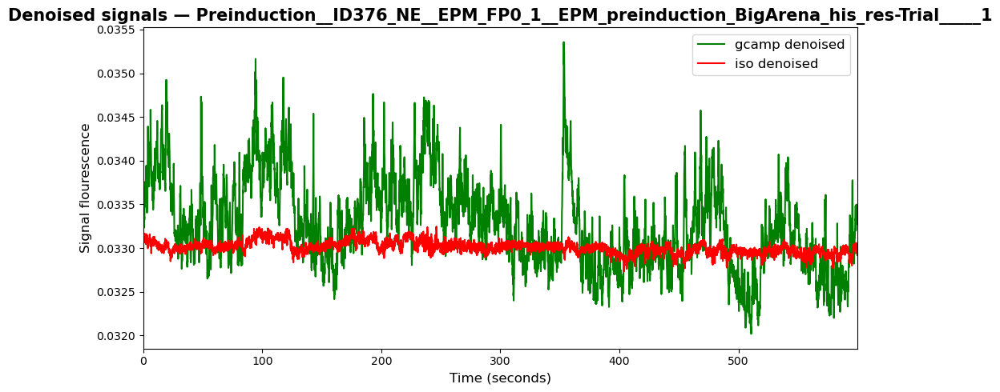

Index(['Time_video', 'iso415', 'gcamp470', 'gcamp_denoised', 'iso_denoised'], dtype='object')


In [26]:

from scipy.signal import butter, filtfilt

sampling_rate = 50

# EXACT same filter design
b, a = butter(2, 10, btype='low', fs=sampling_rate)


for key, df in coregistered_traces.items():
    
    # Apply filtering EXACTLY like notebook
    df["gcamp_denoised"] = filtfilt(b, a, df["gcamp470"].values)
    df["iso_denoised"]   = filtfilt(b, a, df["iso415"].values)


trial_key = list(coregistered_traces.keys())[0]
df = coregistered_traces[trial_key]

fig, ax = plt.subplots(figsize=(10,5))

# Plot both signals on same axis
plot1 = ax.plot(df["Time_video"], df["gcamp_denoised"], 'g', label='gcamp denoised')
plot2 = ax.plot(df["Time_video"], df["iso_denoised"], 'r', label='iso denoised')

ax.set_xlabel('Time (seconds)')
ax.set_ylabel('Signal flourescence')
ax.set_title(f'Denoised signals — {trial_key}')

# Same legend logic
lines = plot1 + plot2
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, loc='upper right')

plt.tight_layout()
plt.show()

#check denoising added to original dataframe:
first_key = list(coregistered_traces.keys())[0]
print(coregistered_traces[first_key].columns)

# Zoomed in plot to see denoising more clearly

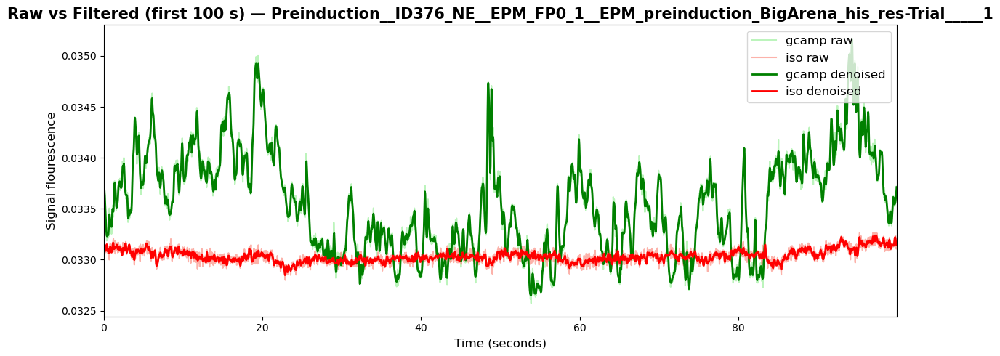

In [27]:
# Select trial
trial_key = list(coregistered_traces.keys())[0]
df = coregistered_traces[trial_key]

# --- Zoom window ---
df_zoom = df[df["Time_video"] <= 100]

fig, ax = plt.subplots(figsize=(12,5))

# RAW signals (faint)
ax.plot(df_zoom["Time_video"], df_zoom["gcamp470"], color='lightgreen', alpha=0.6, label='gcamp raw')
ax.plot(df_zoom["Time_video"], df_zoom["iso415"],   color='salmon',     alpha=0.6, label='iso raw')

# FILTERED signals (bold)
ax.plot(df_zoom["Time_video"], df_zoom["gcamp_denoised"], 'g', linewidth=2, label='gcamp denoised')
ax.plot(df_zoom["Time_video"], df_zoom["iso_denoised"],   'r', linewidth=2, label='iso denoised')

ax.set_xlabel("Time (seconds)")
ax.set_ylabel("Signal flourescence")
ax.set_title(f"Raw vs Filtered (first 100 s) — {trial_key}")

ax.legend(loc="upper right")

plt.tight_layout()
plt.show()

## Photbleaching correction via double exponential fit (like neurophotometrics guide)
One way of removing the influence of bleaching is to fit an exponential decay to the data and subtract this exponential fit from the signal (note, some groups divide the signal by the baseline rather than subtracting the baseline, see Fiber Photometry Primer for more discussion). In practice we find that a double exponential fit is preferable to a single exponential fit because there are typically multiple sources of fluorescence that contribute to the bleaching (e.g. autofluorescence from fiber, autofluorescence from brain tissue, and flurophore fluorescence), which may bleach at different rates, so a single exponential fit can be overly restrictive.

First single trial to try out, then applied to all trials

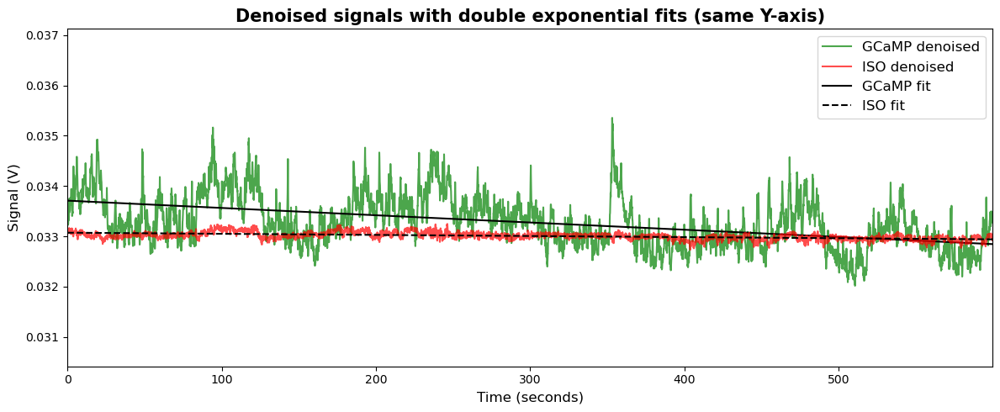

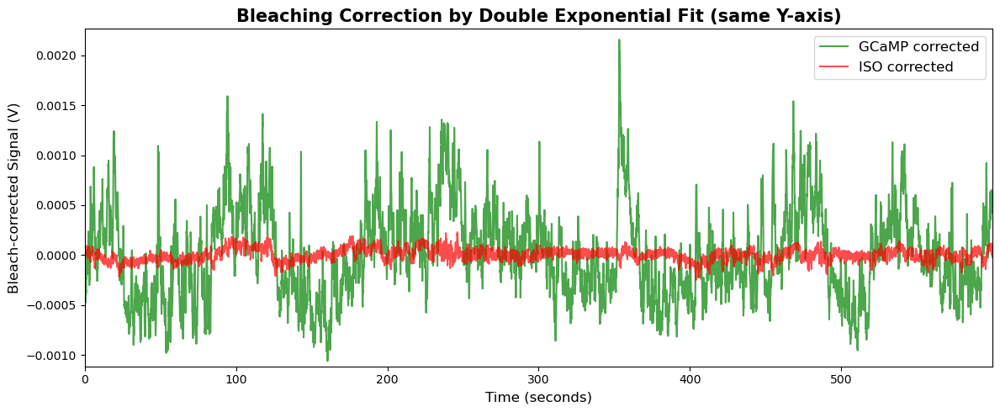

In [28]:
# ==========================================================
# Single trial: double exponential fit + bleach correction
# Both signals on the same Y-axis
# ==========================================================

import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Pick the first trial
trial_key = list(coregistered_traces.keys())[0]
df = coregistered_traces[trial_key]

time_seconds = df["Time_video"].values

# ----------------------------------------------------------
# Double exponential function
# ----------------------------------------------------------
def double_exponential(t, const, amp_fast, amp_slow, tau_slow, tau_multiplier):
    """
    Compute a double exponential function with constant offset.
    Parameters
    ----------
    t           : array_like, time vector in seconds
    const       : amplitude of constant offset
    amp_fast    : amplitude of fast component
    amp_slow    : amplitude of slow component
    tau_slow    : time constant of slow component (s)
    tau_multiplier : time constant of fast component relative to slow
    """
    tau_fast = tau_slow * tau_multiplier
    return const + amp_slow * np.exp(-t / tau_slow) + amp_fast * np.exp(-t / tau_fast)

# ----------------------------------------------------------
# Fit double exponential to GCaMP
# ----------------------------------------------------------
max_sig = np.max(df["gcamp_denoised"])
initial_params = [max_sig/2, max_sig/4, max_sig/4, 3600, 0.1]
bounds = ([0, 0, 0, 600, 0],
          [max_sig, max_sig, max_sig, 36000, 1])

gcamp_params, _ = curve_fit(double_exponential, time_seconds, df["gcamp_denoised"],
                            p0=initial_params, bounds=bounds, maxfev=1000)
df["gcamp_expfit"] = double_exponential(time_seconds, *gcamp_params)

# ----------------------------------------------------------
# Fit double exponential to ISO
# ----------------------------------------------------------
max_sig = np.max(df["iso_denoised"])
initial_params = [max_sig/2, max_sig/4, max_sig/4, 3600, 0.1]
bounds = ([0, 0, 0, 600, 0],
          [max_sig, max_sig, max_sig, 36000, 1])

iso_params, _ = curve_fit(double_exponential, time_seconds, df["iso_denoised"],
                          p0=initial_params, bounds=bounds, maxfev=1000)
df["iso_expfit"] = double_exponential(time_seconds, *iso_params)

# ----------------------------------------------------------
# Bleach-corrected signals
# ----------------------------------------------------------
df["gcamp_bleach_corrected"] = df["gcamp_denoised"] - df["gcamp_expfit"]
df["iso_bleach_corrected"]   = df["iso_denoised"] - df["iso_expfit"]

# ==========================================================
# Plot 1: Denoised signals with double exponential fits
# Both on the same Y-axis
# ==========================================================
fig, ax1 = plt.subplots(figsize=(12,5))

# GCaMP
plot1 = ax1.plot(time_seconds, df["gcamp_denoised"], 'g', alpha=0.7, label='GCaMP denoised')
plot3 = ax1.plot(time_seconds, df["gcamp_expfit"], 'k', linewidth=1.5, label='GCaMP fit')

# ISO
plot2 = ax1.plot(time_seconds, df["iso_denoised"], 'r', alpha=0.7, label='ISO denoised')
plot4 = ax1.plot(time_seconds, df["iso_expfit"], 'k', linestyle='--', linewidth=1.5, label='ISO fit')

ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('Signal (V)')
ax1.set_title('Denoised signals with double exponential fits (same Y-axis)')

# Legend
lines = plot1 + plot2 + plot3 + plot4
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper right')

# Dynamic Y-limits based on both signals
ymin = min(df["gcamp_denoised"].min(), df["iso_denoised"].min()) * 0.95
ymax = max(df["gcamp_denoised"].max(), df["iso_denoised"].max()) * 1.05
ax1.set_ylim(ymin, ymax)

plt.tight_layout()
plt.show()

# ==========================================================
# Plot 2: Bleach-corrected (detrended) signals
# Both on the same Y-axis
# ==========================================================
fig, ax1 = plt.subplots(figsize=(12,5))

# GCaMP
plot1 = ax1.plot(time_seconds, df["gcamp_bleach_corrected"], 'g', alpha=0.7, label='GCaMP corrected')

# ISO
plot2 = ax1.plot(time_seconds, df["iso_bleach_corrected"], 'r', alpha=0.7, label='ISO corrected')

ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('Bleach-corrected Signal (V)')
ax1.set_title('Bleaching Correction by Double Exponential Fit (same Y-axis)')

# Legend
lines = plot1 + plot2
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper right')

# Dynamic Y-limits based on both signals
ymin = min(df["gcamp_bleach_corrected"].min(), df["iso_bleach_corrected"].min()) * 1.05
ymax = max(df["gcamp_bleach_corrected"].max(), df["iso_bleach_corrected"].max()) * 1.05
ax1.set_ylim(ymin, ymax)

plt.tight_layout()
plt.show()

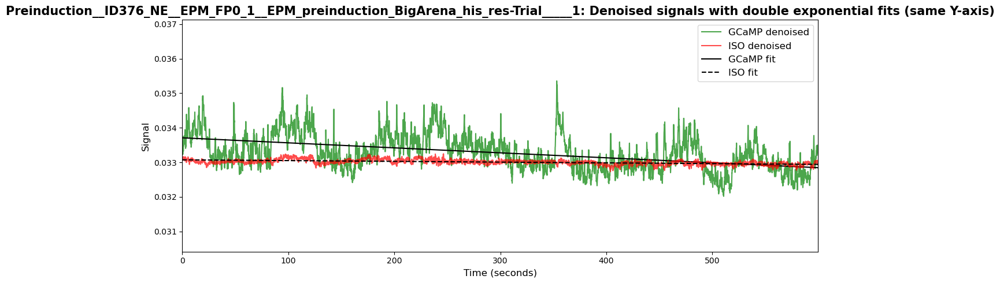

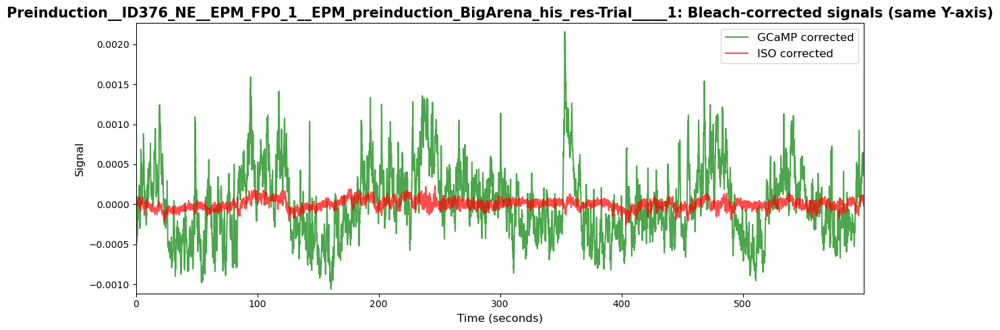

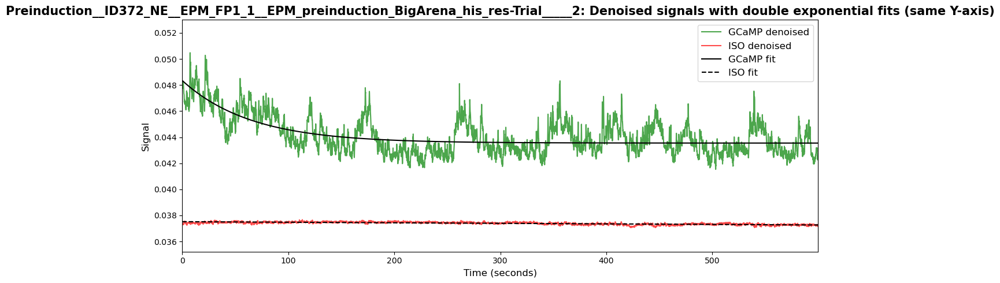

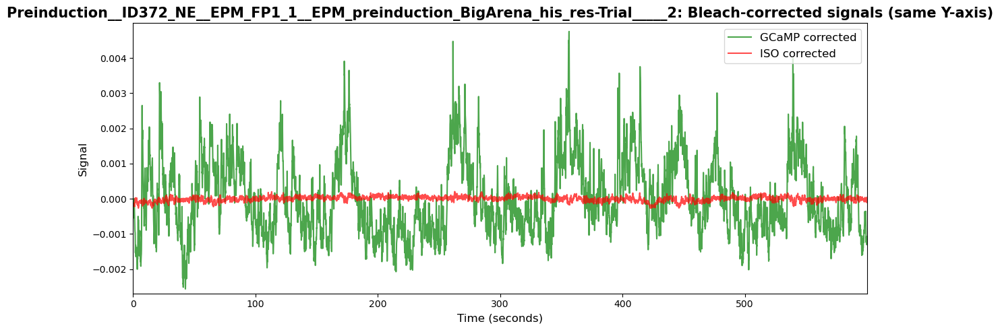

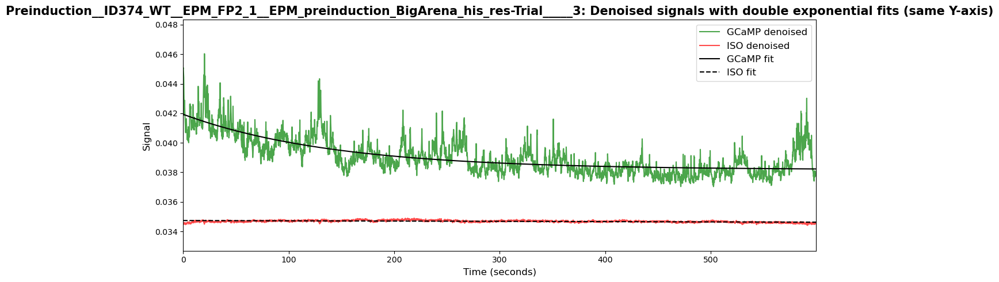

...

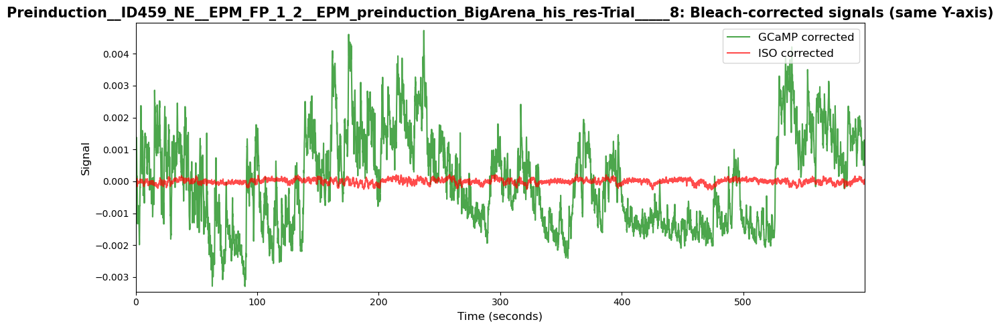

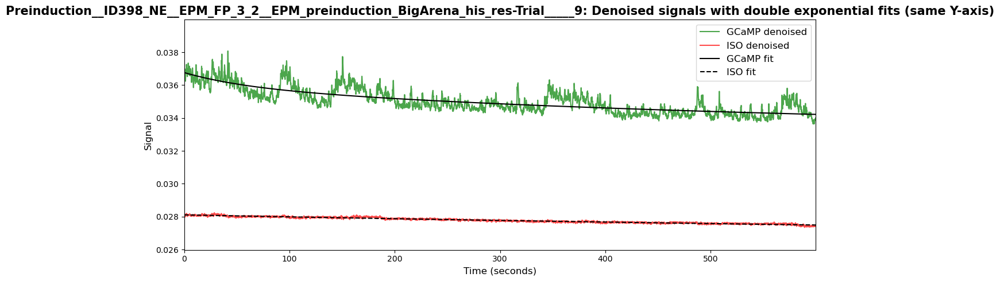

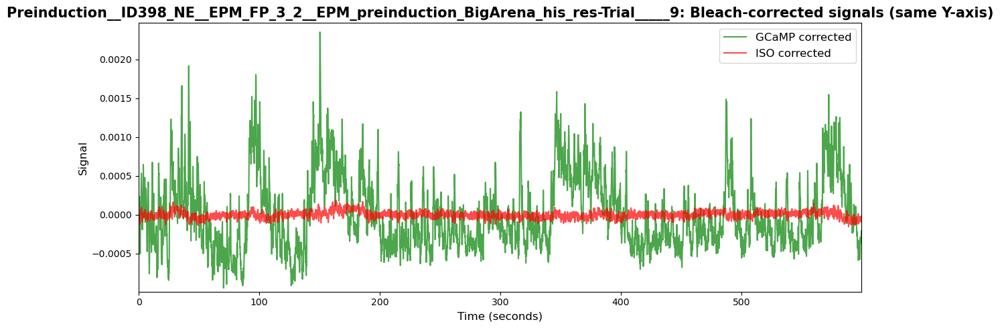

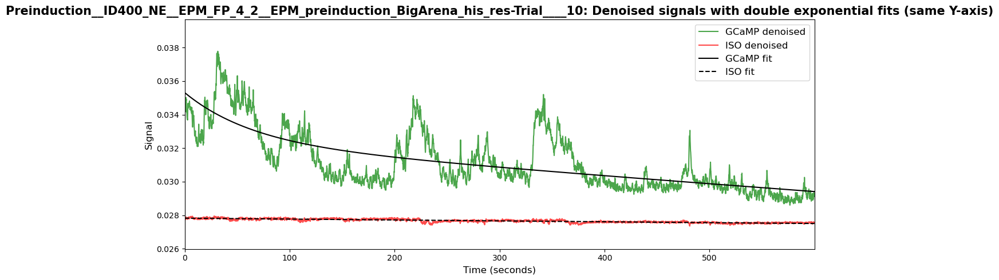

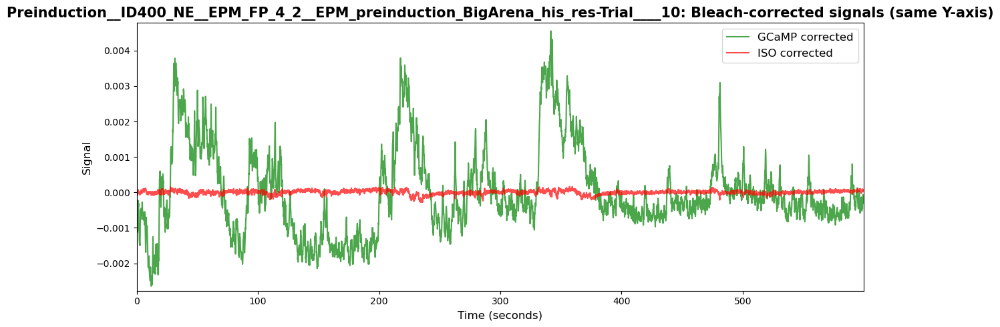

Index(['Time_video', 'iso415', 'gcamp470', 'gcamp_denoised', 'iso_denoised',
       'gcamp_expfit', 'iso_expfit', 'gcamp_bleach_corrected',
       'iso_bleach_corrected'],
      dtype='object')


In [29]:


from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt

# ----------------------------------------------------------
# Double exponential function
# ----------------------------------------------------------
def double_exponential(t, const, amp_fast, amp_slow, tau_slow, tau_multiplier):
    """
    Compute a double exponential function with constant offset.
    Parameters
    ----------
    t           : array_like, time vector in seconds
    const       : amplitude of constant offset
    amp_fast    : amplitude of fast component
    amp_slow    : amplitude of slow component
    tau_slow    : time constant of slow component (s)
    tau_multiplier : time constant of fast component relative to slow
    """
    tau_fast = tau_slow * tau_multiplier
    return const + amp_slow * np.exp(-t / tau_slow) + amp_fast * np.exp(-t / tau_fast)

# Store fits and corrected signals
for trial_key, df in coregistered_traces.items():
    time_seconds = df["Time_video"].values

    # -------------------------
    # Fit GCaMP
    # -------------------------
    max_sig = np.max(df["gcamp_denoised"])
    initial_params = [max_sig/2, max_sig/4, max_sig/4, 3600, 0.1]
    bounds = ([0, 0, 0, 600, 0], [max_sig, max_sig, max_sig, 36000, 1])

    try:
        gcamp_params, _ = curve_fit(double_exponential, time_seconds, df["gcamp_denoised"],
                                    p0=initial_params, bounds=bounds, maxfev=1000)
        df["gcamp_expfit"] = double_exponential(time_seconds, *gcamp_params)
        df["gcamp_bleach_corrected"] = df["gcamp_denoised"] - df["gcamp_expfit"]
    except Exception as e:
        print(f"[WARN] Could not fit GCaMP for {trial_key}: {e}")
        df["gcamp_expfit"] = np.zeros_like(time_seconds)
        df["gcamp_bleach_corrected"] = df["gcamp_denoised"].copy()

    # -------------------------
    # Fit ISO
    # -------------------------
    max_sig = np.max(df["iso_denoised"])
    initial_params = [max_sig/2, max_sig/4, max_sig/4, 3600, 0.1]
    bounds = ([0, 0, 0, 600, 0], [max_sig, max_sig, max_sig, 36000, 1])

    try:
        iso_params, _ = curve_fit(double_exponential, time_seconds, df["iso_denoised"],
                                  p0=initial_params, bounds=bounds, maxfev=1000)
        df["iso_expfit"] = double_exponential(time_seconds, *iso_params)
        df["iso_bleach_corrected"] = df["iso_denoised"] - df["iso_expfit"]
    except Exception as e:
        print(f"[WARN] Could not fit ISO for {trial_key}: {e}")
        df["iso_expfit"] = np.zeros_like(time_seconds)
        df["iso_bleach_corrected"] = df["iso_denoised"].copy()

    # -------------------------
    # Plot: Denoised signals with exponential fits
    # -------------------------
    fig, ax1 = plt.subplots(figsize=(12,5))
    plot1 = ax1.plot(time_seconds, df["gcamp_denoised"], 'g', alpha=0.7, label='GCaMP denoised')
    plot3 = ax1.plot(time_seconds, df["gcamp_expfit"], 'k', linewidth=1.5, label='GCaMP fit')
    plot2 = ax1.plot(time_seconds, df["iso_denoised"], 'r', alpha=0.7, label='ISO denoised')
    plot4 = ax1.plot(time_seconds, df["iso_expfit"], 'k', linestyle='--', linewidth=1.5, label='ISO fit')

    ax1.set_xlabel('Time (seconds)')
    ax1.set_ylabel('Signal')
    ax1.set_title(f'{trial_key}: Denoised signals with double exponential fits (same Y-axis)')

    lines = plot1 + plot2 + plot3 + plot4
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper right')

    ymin = min(df["gcamp_denoised"].min(), df["iso_denoised"].min()) * 0.95
    ymax = max(df["gcamp_denoised"].max(), df["iso_denoised"].max()) * 1.05
    ax1.set_ylim(ymin, ymax)

    plt.tight_layout()
    plt.show()

    # -------------------------
    # Plot: Bleach-corrected signals
    # -------------------------
    fig, ax2 = plt.subplots(figsize=(12,5))
    plot1_corr = ax2.plot(time_seconds, df["gcamp_bleach_corrected"], 'g', alpha=0.7, label='GCaMP corrected')
    plot2_corr = ax2.plot(time_seconds, df["iso_bleach_corrected"], 'r', alpha=0.7, label='ISO corrected')

    ax2.set_xlabel('Time (seconds)')
    ax2.set_ylabel('Signal')
    ax2.set_title(f'{trial_key}: Bleach-corrected signals (same Y-axis)')

    # Y-axis limits based on corrected signals
    ymin_corr = min(df["gcamp_bleach_corrected"].min(), df["iso_bleach_corrected"].min()) * 1.05
    ymax_corr = max(df["gcamp_bleach_corrected"].max(), df["iso_bleach_corrected"].max()) * 1.05
    ax2.set_ylim(ymin_corr, ymax_corr)

    lines_corr = plot1_corr + plot2_corr
    labels_corr = [l.get_label() for l in lines_corr]
    ax2.legend(lines_corr, labels_corr, loc='upper right')

    plt.tight_layout()
    plt.show()

#check columns added to overall dataframe
first_key = list(coregistered_traces.keys())[0]
print(coregistered_traces[first_key].columns)

Processing Preinduction__ID376_NE__EPM_FP0_1__EPM_preinduction_BigArena_his_res-Trial_____1


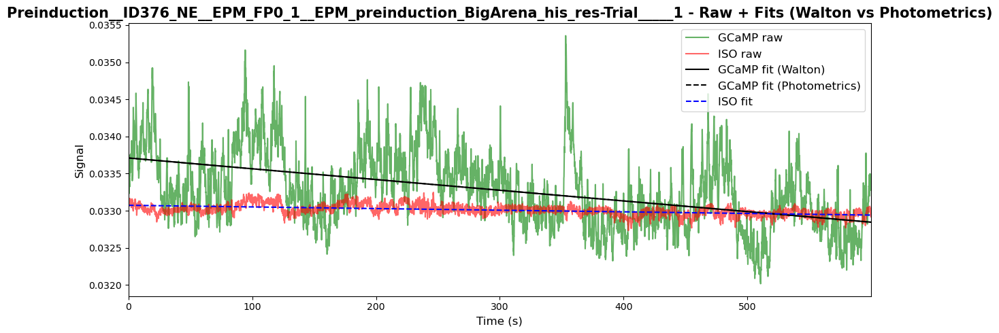

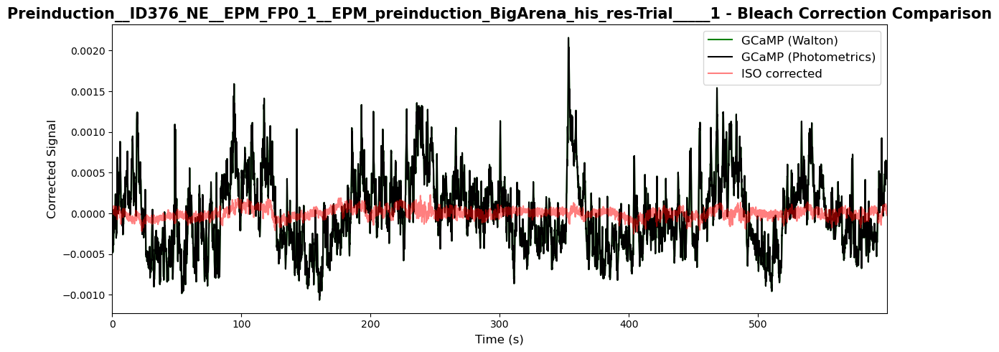

Processing Preinduction__ID372_NE__EPM_FP1_1__EPM_preinduction_BigArena_his_res-Trial_____2


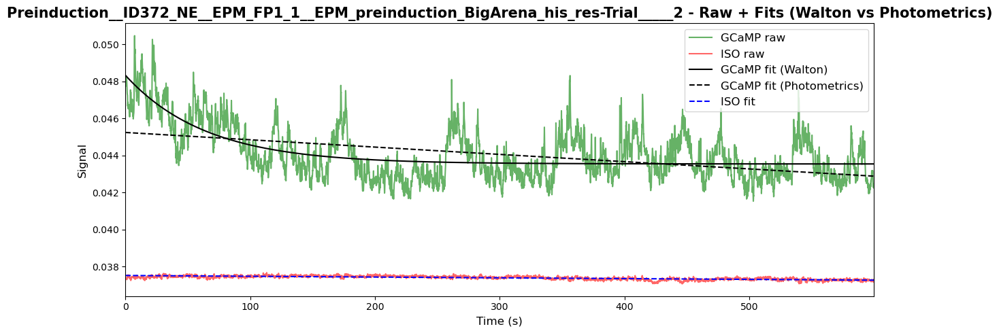

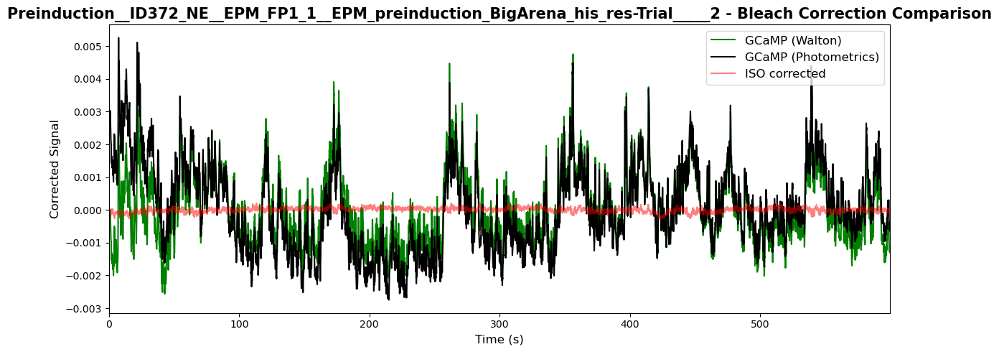

Processing Preinduction__ID374_WT__EPM_FP2_1__EPM_preinduction_BigArena_his_res-Trial_____3


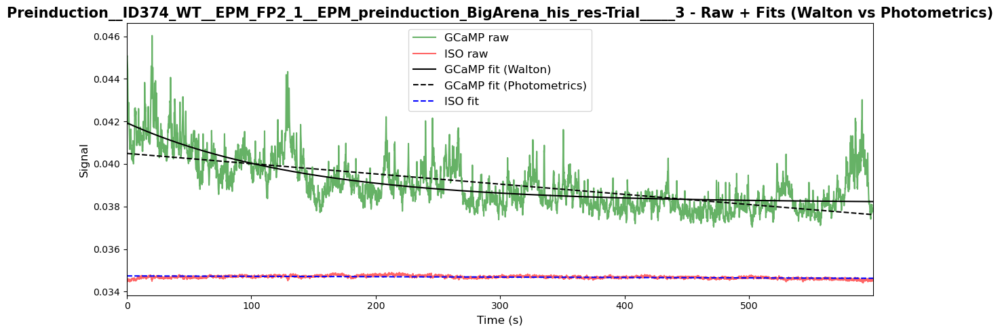

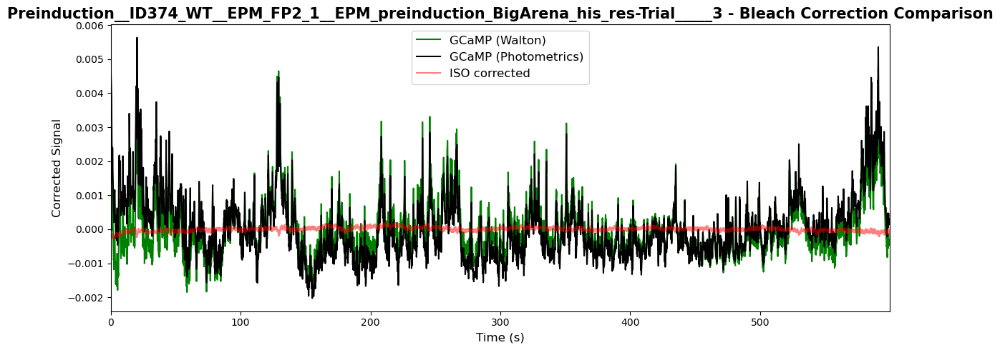

Processing Preinduction__ID429_WT__EPM_FP3_1__EPM_preinduction_BigArena_his_res-Trial_____4


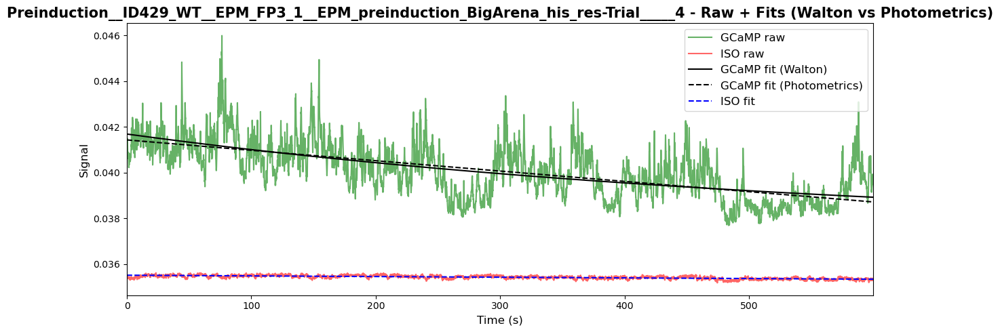

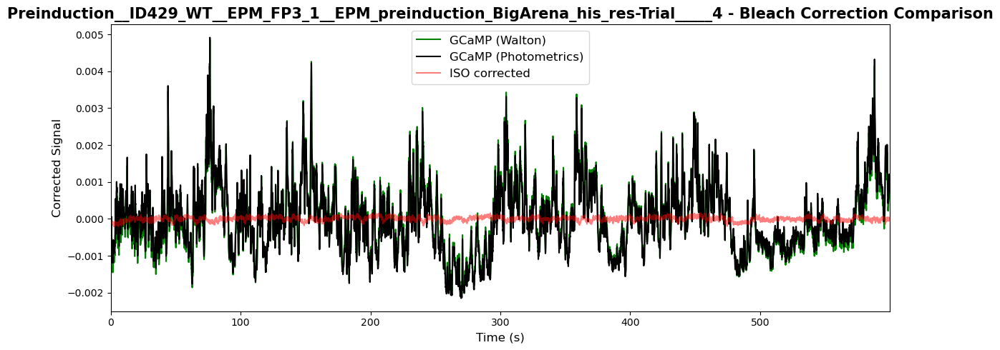

Processing Preinduction__ID423_NE__EPM_FP5_1__EPM_preinduction_BigArena_his_res-Trial_____5


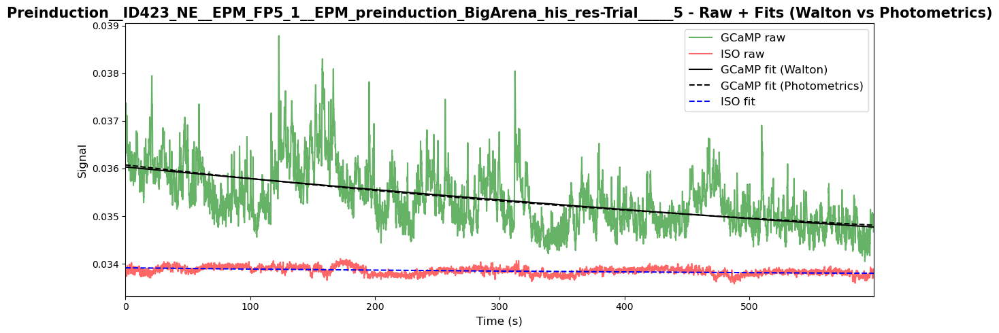

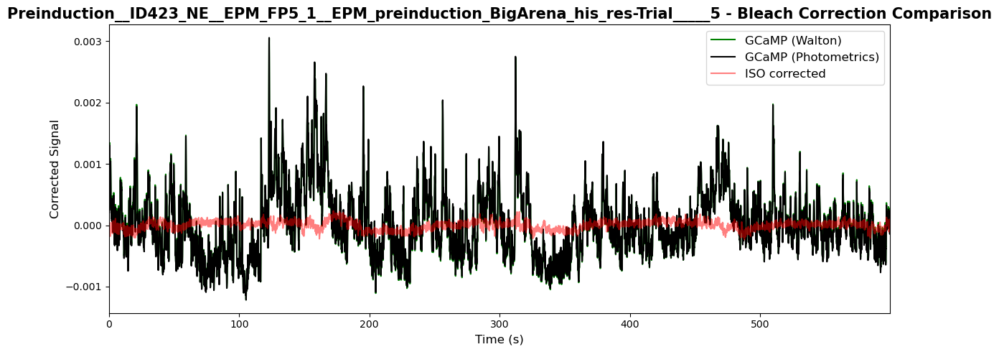

Processing Preinduction__ID463_WT__EPM_FP_0_2__EPM_preinduction_BigArena_his_res-Trial_____7


/var/folders/3y/jmv30wb16ss901m1yrdysjh80000gq/T/ipykernel_11477/2742674529.py:53: RankWarning: Polyfit may be poorly conditioned
  m, b = np.polyfit(X, y, 1)


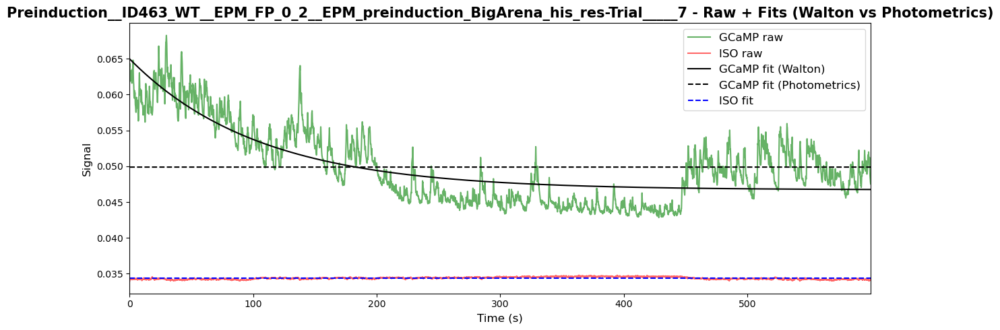

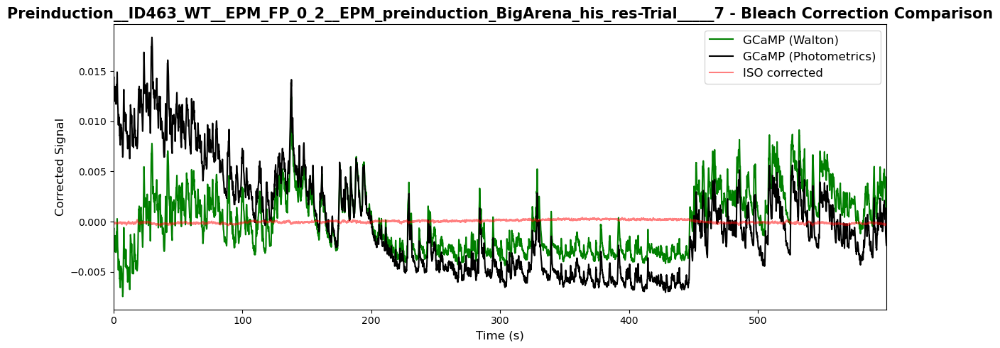

Processing Preinduction__ID459_NE__EPM_FP_1_2__EPM_preinduction_BigArena_his_res-Trial_____8


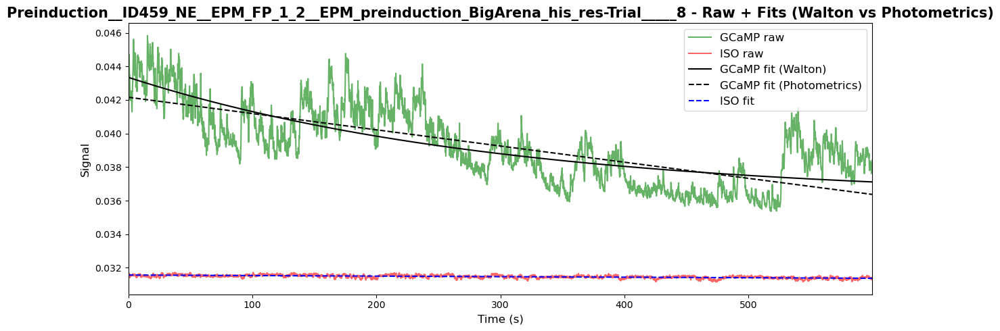

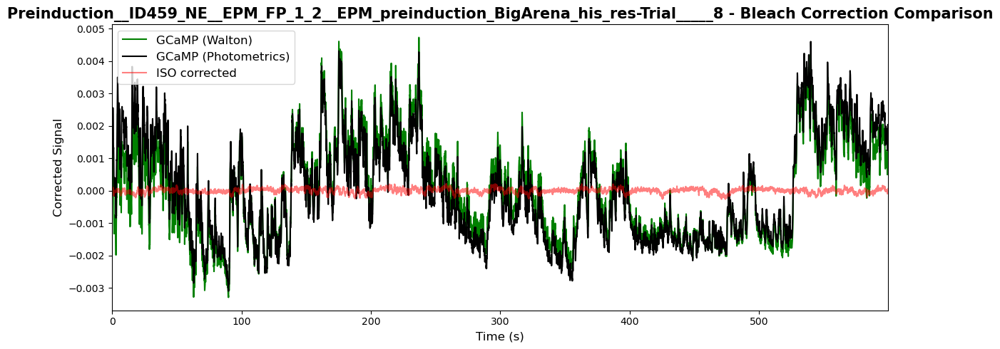

Processing Preinduction__ID398_NE__EPM_FP_3_2__EPM_preinduction_BigArena_his_res-Trial_____9


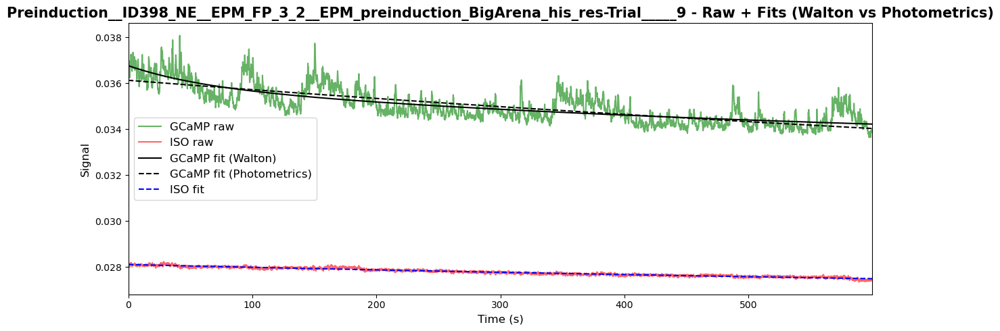

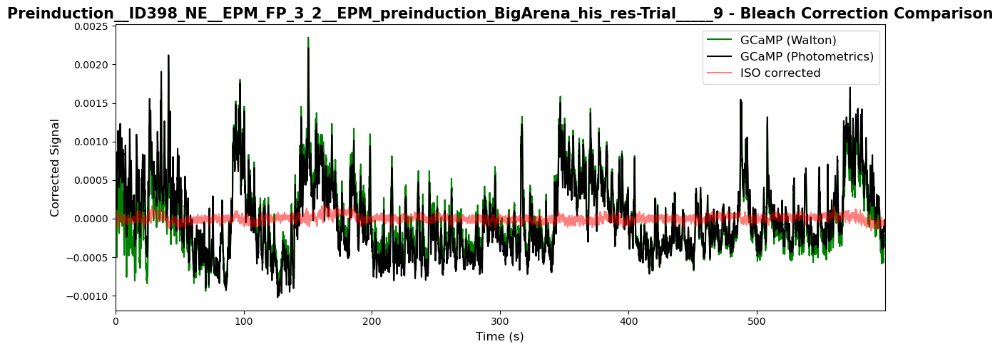

Processing Preinduction__ID400_NE__EPM_FP_4_2__EPM_preinduction_BigArena_his_res-Trial____10


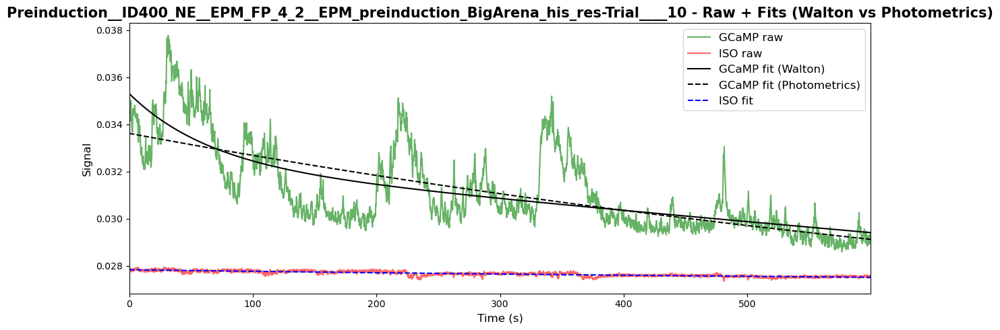

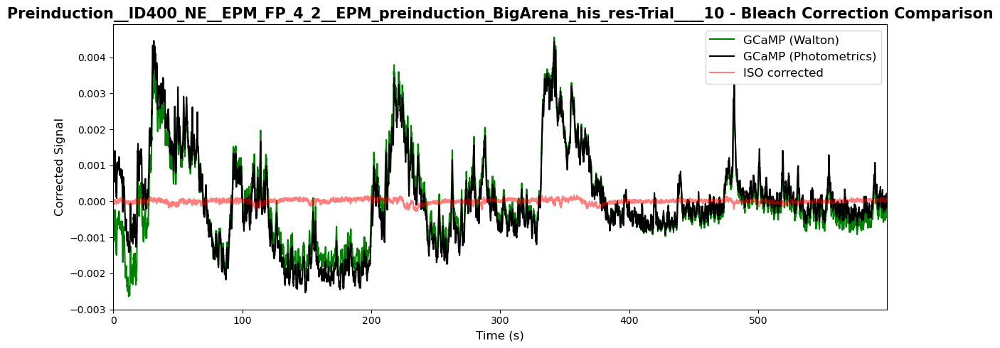

In [30]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# ----------------------------------------------------------
# Double exponential
# ----------------------------------------------------------
def double_exponential(t, const, amp_fast, amp_slow, tau_slow, tau_multiplier):
    tau_fast = tau_slow * tau_multiplier
    return const + amp_slow * np.exp(-t / tau_slow) + amp_fast * np.exp(-t / tau_fast)

# ==========================================================
# Loop through trials
# ==========================================================
for trial_key, df in coregistered_traces.items():

    print(f"Processing {trial_key}")
    time_seconds = df["Time_video"].values

    # ======================================================
    # WALTON METHOD (old)
    # ======================================================
    # --- GCaMP fit ---
    max_g = np.max(df["gcamp_denoised"])
    p0 = [max_g/2, max_g/4, max_g/4, 3600, 0.1]
    bounds = ([0,0,0,600,0],[max_g,max_g,max_g,36000,1])

    gcamp_params, _ = curve_fit(double_exponential, time_seconds, df["gcamp_denoised"],
                                p0=p0, bounds=bounds, maxfev=5000)
    df["gcamp_expfit_walton"] = double_exponential(time_seconds, *gcamp_params)

    # --- ISO fit ---
    max_iso = np.max(df["iso_denoised"])
    p0_iso = [max_iso/2, max_iso/4, max_iso/4, 3600, 0.1]

    iso_params, _ = curve_fit(double_exponential, time_seconds, df["iso_denoised"],
                              p0=p0_iso, bounds=bounds, maxfev=5000)
    df["iso_expfit_walton"] = double_exponential(time_seconds, *iso_params)

    # --- Walton correction ---
    df["gcamp_corrected_walton"] = df["gcamp_denoised"] - df["gcamp_expfit_walton"]
    df["iso_corrected_walton"]   = df["iso_denoised"] - df["iso_expfit_walton"]

    # ======================================================
    # PHOTOMETRICS METHOD (new)
    # ======================================================
    # Reuse ISO fit
    df["iso_expfit_photometrics"] = df["iso_expfit_walton"]

    X = df["iso_expfit_photometrics"].values
    y = df["gcamp_denoised"].values

    m, b = np.polyfit(X, y, 1)
    df["gcamp_expfit_photometrics"] = m * X + b

    # --- Photometrics correction ---
    df["gcamp_corrected_photometrics"] = df["gcamp_denoised"] - df["gcamp_expfit_photometrics"]
    df["iso_corrected_photometrics"]   = df["iso_denoised"] - df["iso_expfit_photometrics"]

    # ======================================================
    # PLOTTING
    # ======================================================
    plot_trials = True

    if plot_trials:

        # -------- Plot 1: RAW + FITS --------
        fig, ax = plt.subplots(figsize=(12,5))

        ax.plot(time_seconds, df["gcamp_denoised"], 'g', alpha=0.6, label='GCaMP raw')
        ax.plot(time_seconds, df["iso_denoised"], 'r', alpha=0.6, label='ISO raw')

        ax.plot(time_seconds, df["gcamp_expfit_walton"], 'k', label='GCaMP fit (Walton)')
        ax.plot(time_seconds, df["gcamp_expfit_photometrics"], 'k--', label='GCaMP fit (Photometrics)')

        ax.plot(time_seconds, df["iso_expfit_walton"], 'b--', label='ISO fit')

        ax.set_title(f"{trial_key} - Raw + Fits (Walton vs Photometrics)")
        ax.set_xlabel("Time (s)")
        ax.set_ylabel("Signal")
        ax.legend()
        plt.tight_layout()
        plt.show()

        # -------- Plot 2: BLEACH CORRECTION --------
        fig, ax = plt.subplots(figsize=(12,5))

        ax.plot(time_seconds, df["gcamp_corrected_walton"], 'g', label='GCaMP (Walton)')
        ax.plot(time_seconds, df["gcamp_corrected_photometrics"], 'k', label='GCaMP (Photometrics)')

        ax.plot(time_seconds, df["iso_corrected_walton"], 'r', alpha=0.5, label='ISO corrected')

        ax.set_title(f"{trial_key} - Bleach Correction Comparison")
        ax.set_xlabel("Time (s)")
        ax.set_ylabel("Corrected Signal")
        ax.legend()
        plt.tight_layout()
        plt.show()

## Motion correction

We now do motion correction by finding the best linear fit of the TdTomato signal to the dLight signal and subtracting this estimated motion component from the dLight signal. We will use the data that was bleaching corrected using the double exponential fit as this is less likely to remove meaningful slow variation in the signals.
first single trial

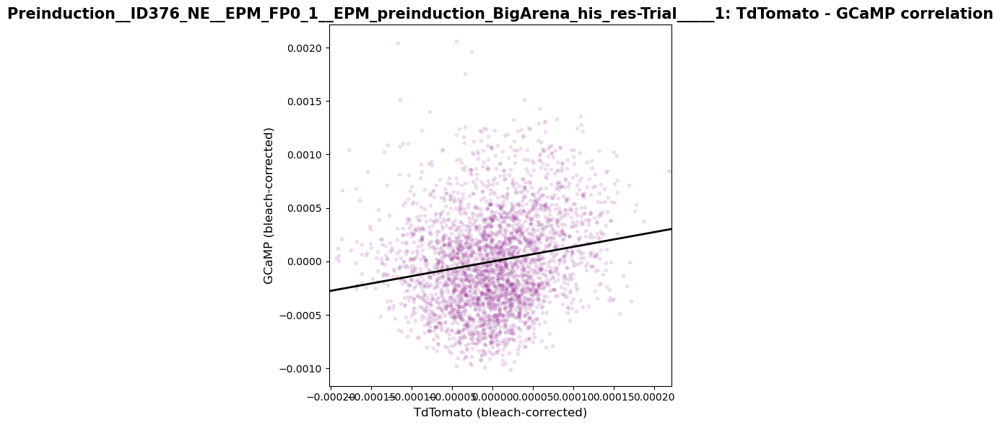

Slope    : 1.370
Intercept: -0.000
R-squared: 0.033
p-value  : 5.963e-111
Std err  : 0.061


In [31]:
from scipy.stats import linregress
import matplotlib.pyplot as plt
import numpy as np

# Pick first trial
trial_key = list(coregistered_traces.keys())[0]
df = coregistered_traces[trial_key]

# Use bleach-corrected signals
x = df["iso_bleach_corrected"].values       # TdTom / ISO
y = df["gcamp_bleach_corrected"].values    # GCaMP

# Perform linear regression
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Scatter plot (downsample every 5 points for clarity)
plt.figure(figsize=(6,6))
plt.scatter(x[::5], y[::5], alpha=0.1, marker='.', color='purple')

# Regression line
line_x = np.array(plt.xlim())
line_y = intercept + slope*line_x
plt.plot(line_x, line_y, color='black', linewidth=2)

plt.xlabel('TdTomato (bleach-corrected)')
plt.ylabel('GCaMP (bleach-corrected)')
plt.title(f'{trial_key}: TdTomato - GCaMP correlation')
plt.tight_layout()
plt.show()

# Print regression stats
print(f"Slope    : {slope:.3f}")
print(f"Intercept: {intercept:.3f}")
print(f"R-squared: {r_value**2:.3f}")
print(f"p-value  : {p_value:.3e}")
print(f"Std err  : {std_err:.3f}")

We can see that as expected the signals have a positive correlation due to the common contribution of movement to each. We can also see from the slope of the fit being 1.37 that the movement artifacts in the gcamp channel are a bit bigger (I think , not too ure what this means) than in the iso channel. From paper: This is likely because the shorter wavelength excitation light used for dLight excites much more autofluorescence from patch cords and bulk brain tissue, and as a large area diffuse source, autofluorescence is generally less affected by movement. For the same reason movement artifacts in isosbestic control channels, which use short wavelength excitation, are typically smaller than in the dLight channel. so I think it makes sense the movement artifacts in my gcamp channel is estimated to be bigger than in my iso channel makes sense?

We now calculate the estimated motion component of the dLight signal and subtract to get the motion corrected signal.

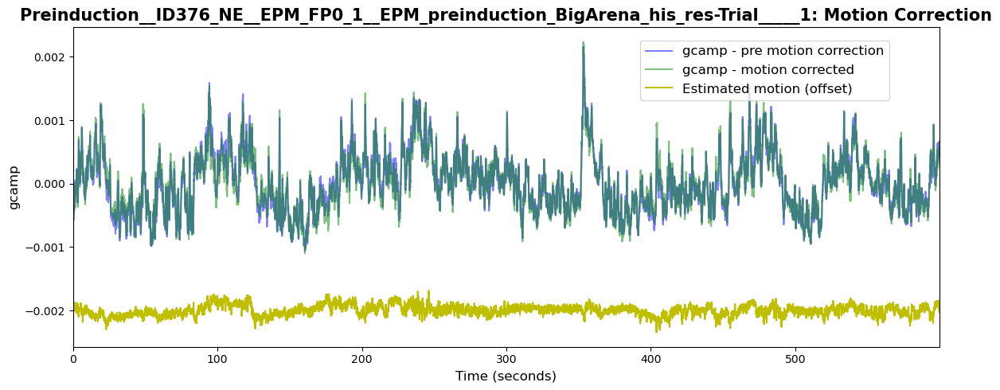

Slope    : 1.370
Intercept: -0.000
R-squared: 0.033
p-value  : 5.963e-111
Std err  : 0.061


In [32]:
from scipy.stats import linregress
import numpy as np
import matplotlib.pyplot as plt

# Pick first trial
trial_key = list(coregistered_traces.keys())[0]
df = coregistered_traces[trial_key]

time_seconds = df["Time_video"].values

# Signals to use
iso_detrended = df["iso_bleach_corrected"].values      # ISO / TdTom
gcamp_detrended = df["gcamp_bleach_corrected"].values   # GCaMP / dLight

# ---------------------------------------------------------
# Linear regression: motion correction - i think this is the same linear regression method as oreviously used, but check (but just done after photobleaching correction and denoising)
# ---------------------------------------------------------
slope, intercept, r_value, p_value, std_err = linregress(iso_detrended, gcamp_detrended)

# Estimate motion contribution
gcamp_est_motion = intercept + slope * iso_detrended
gcamp__motion_corrected = gcamp_detrended - gcamp_est_motion

# ---------------------------------------------------------
# Plot motion correction
# ---------------------------------------------------------
fig, ax1 = plt.subplots(figsize=(12,5))

# Pre-motion corrected
plot1 = ax1.plot(time_seconds, gcamp_detrended, 'b', alpha=0.5, label='gcamp - pre motion correction')

# Motion-corrected
plot3 = ax1.plot(time_seconds, gcamp__motion_corrected, 'g', alpha=0.5, label='gcamp - motion corrected')

# Estimated motion
plot4 = ax1.plot(time_seconds, gcamp_est_motion - 0.002, 'y', label='Estimated motion (offset)')

# Example reward cues (optional)
# reward_cue_times = np.array([...])  # define if you have reward timestamps
# reward_ticks = ax1.plot(reward_cue_times, np.full(np.size(reward_cue_times), 0.08),
#                        label='Reward Cue', color='w', marker="v", mfc='k', mec='k', ms=8)

ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('gcamp')
ax1.set_title(f'{trial_key}: Motion Correction')

# Combine legend
lines = plot1 + plot3 + plot4  # + reward_ticks if used
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper right', bbox_to_anchor=(0.95, 0.98))


plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# Print regression stats
# ---------------------------------------------------------
print(f"Slope    : {slope:.3f}")
print(f"Intercept: {intercept:.3f}")
print(f"R-squared: {r_value**2:.3f}")
print(f"p-value  : {p_value:.3e}")
print(f"Std err  : {std_err:.3f}")






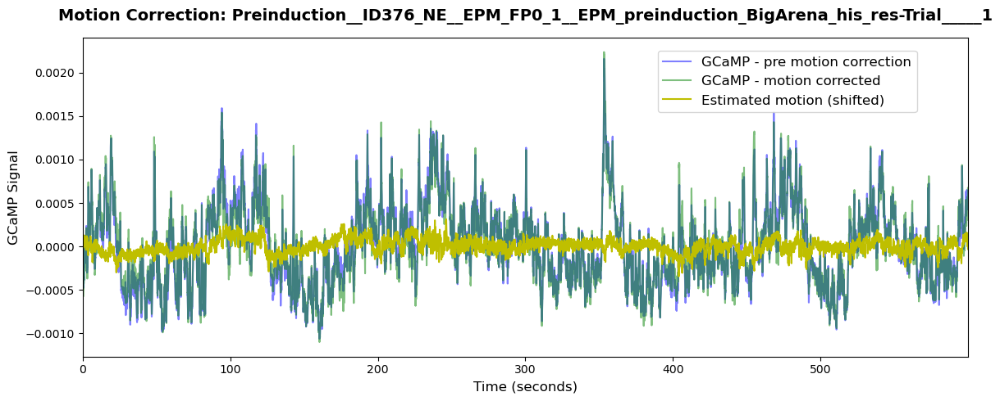


Trial: Preinduction__ID376_NE__EPM_FP0_1__EPM_preinduction_BigArena_his_res-Trial_____1
 Slope    : 1.370
 Intercept: -0.000
 R-squared: 0.033
 p-value  : 5.963e-111
 Std err  : 0.061


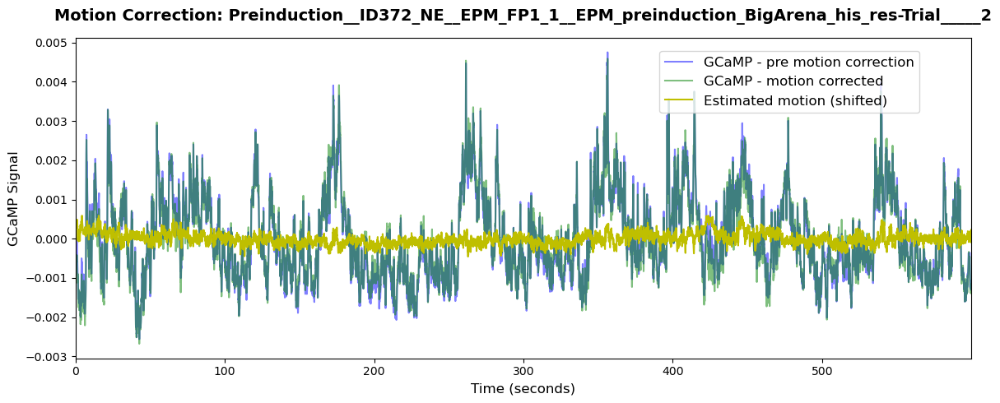


Trial: Preinduction__ID372_NE__EPM_FP1_1__EPM_preinduction_BigArena_his_res-Trial_____2
 Slope    : -2.224
 Intercept: 0.000
 R-squared: 0.020
 p-value  : 4.123e-69
 Std err  : 0.126


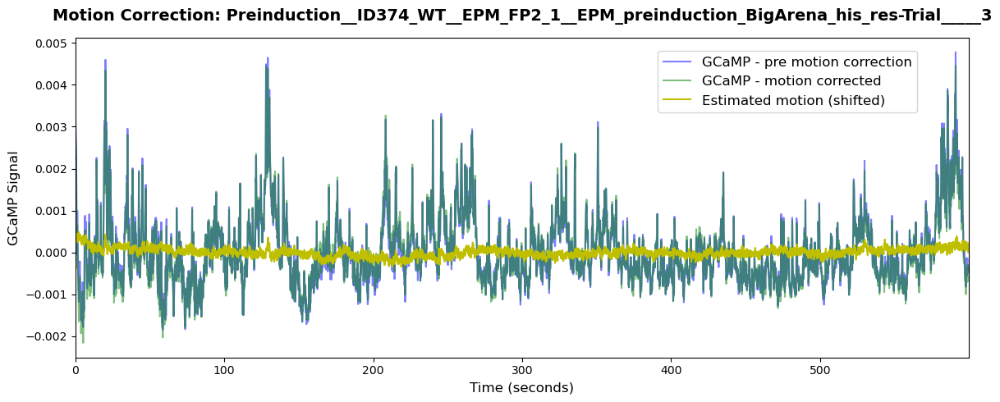


Trial: Preinduction__ID374_WT__EPM_FP2_1__EPM_preinduction_BigArena_his_res-Trial_____3
 Slope    : -1.757
 Intercept: 0.000
 R-squared: 0.016
 p-value  : 2.226e-55
 Std err  : 0.112


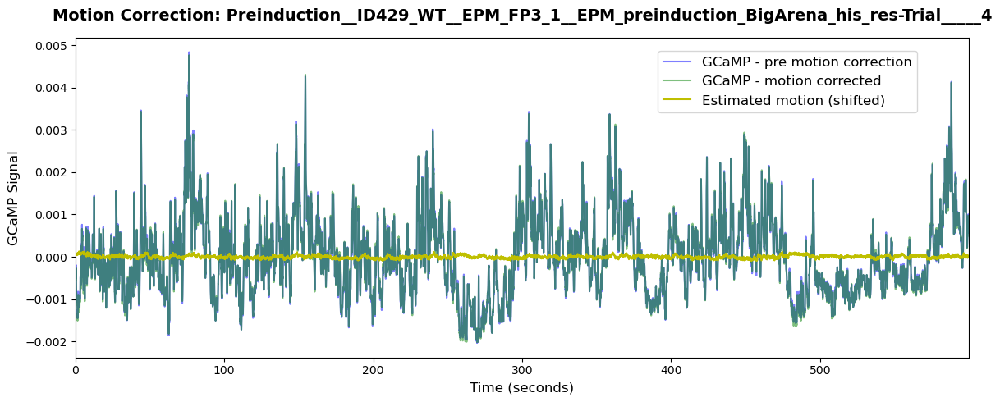


Trial: Preinduction__ID429_WT__EPM_FP3_1__EPM_preinduction_BigArena_his_res-Trial_____4
 Slope    : -0.613
 Intercept: 0.000
 R-squared: 0.002
 p-value  : 2.056e-06
 Std err  : 0.129


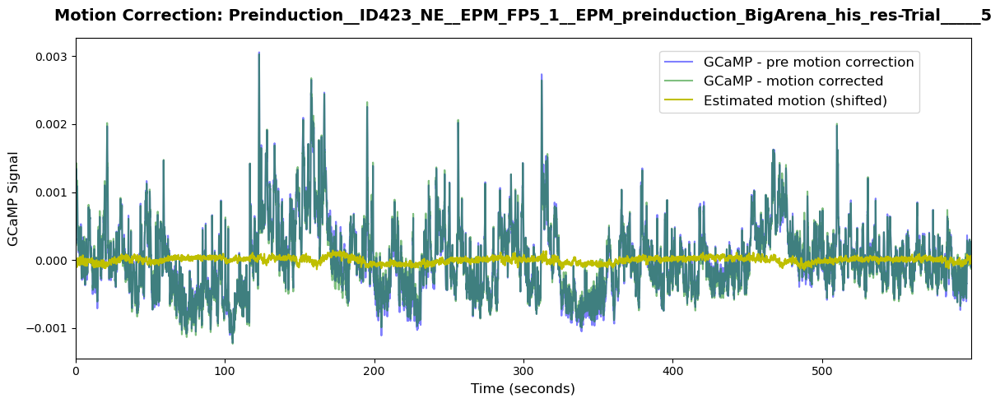


Trial: Preinduction__ID423_NE__EPM_FP5_1__EPM_preinduction_BigArena_his_res-Trial_____5
 Slope    : 0.611
 Intercept: 0.000
 R-squared: 0.006
 p-value  : 4.949e-23
 Std err  : 0.062


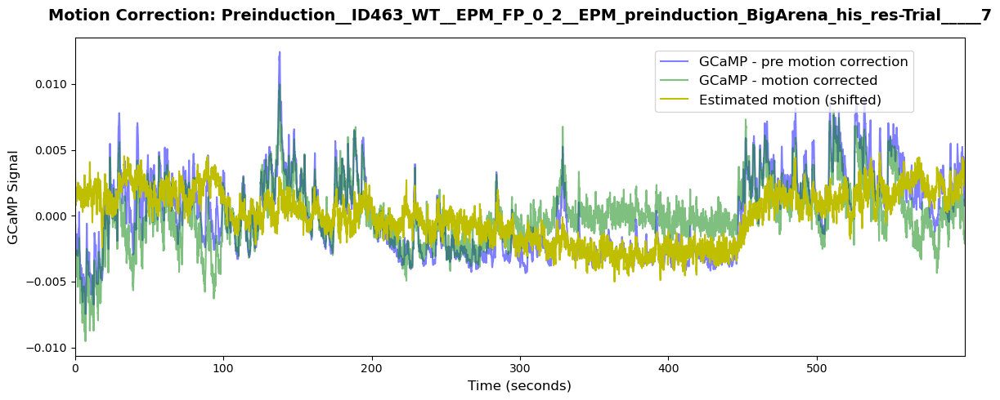


Trial: Preinduction__ID463_WT__EPM_FP_0_2__EPM_preinduction_BigArena_his_res-Trial_____7
 Slope    : -12.103
 Intercept: 0.000
 R-squared: 0.404
 p-value  : 0.000e+00
 Std err  : 0.120


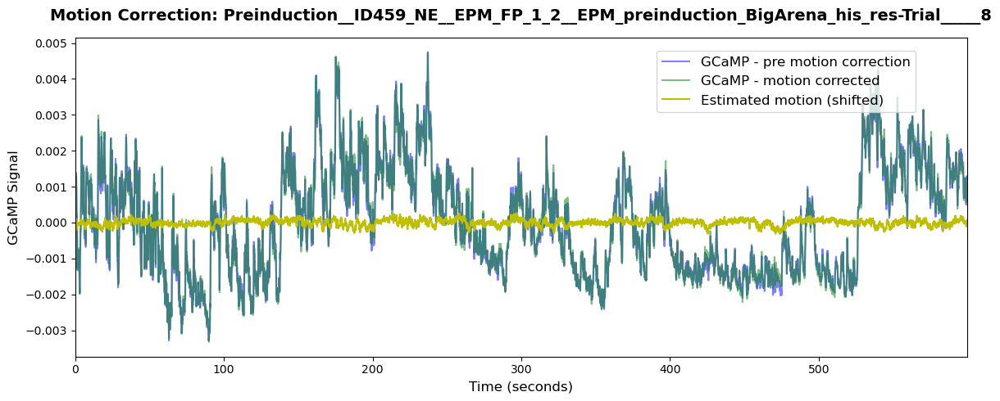


Trial: Preinduction__ID459_NE__EPM_FP_1_2__EPM_preinduction_BigArena_his_res-Trial_____8
 Slope    : 1.192
 Intercept: 0.000
 R-squared: 0.004
 p-value  : 6.946e-14
 Std err  : 0.159


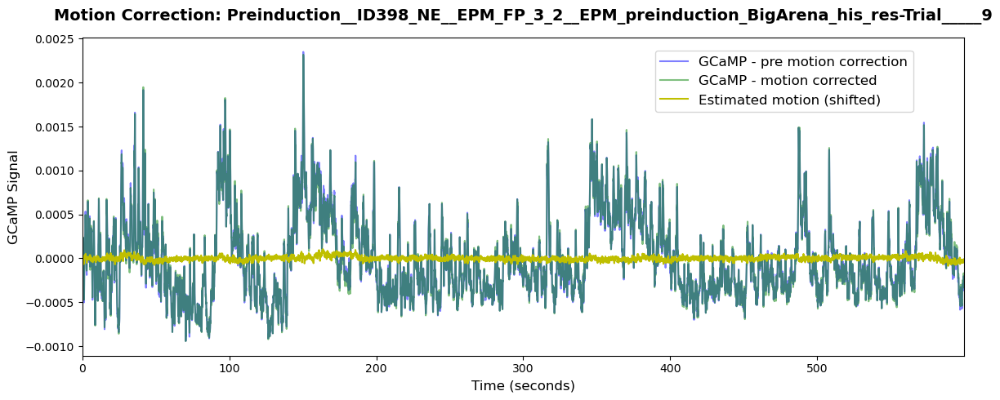


Trial: Preinduction__ID398_NE__EPM_FP_3_2__EPM_preinduction_BigArena_his_res-Trial_____9
 Slope    : 0.566
 Intercept: -0.000
 R-squared: 0.003
 p-value  : 3.444e-10
 Std err  : 0.090


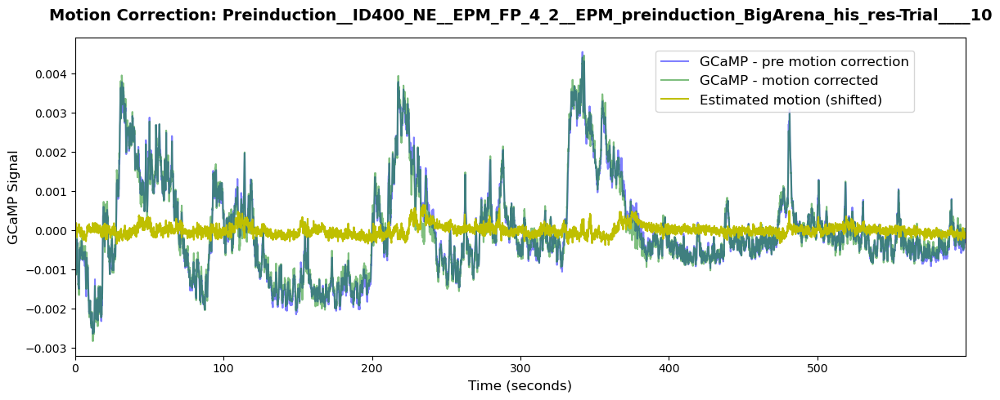


Trial: Preinduction__ID400_NE__EPM_FP_4_2__EPM_preinduction_BigArena_his_res-Trial____10
 Slope    : -2.320
 Intercept: -0.000
 R-squared: 0.012
 p-value  : 2.623e-41
 Std err  : 0.172
Index(['Time_video', 'iso415', 'gcamp470', 'gcamp_denoised', 'iso_denoised',
       'gcamp_expfit', 'iso_expfit', 'gcamp_bleach_corrected',
       'iso_bleach_corrected', 'gcamp_expfit_walton', 'iso_expfit_walton',
       'gcamp_corrected_walton', 'iso_corrected_walton',
       'iso_expfit_photometrics', 'gcamp_expfit_photometrics',
       'gcamp_corrected_photometrics', 'iso_corrected_photometrics',
       'gcamp_motion_corrected', 'gcamp_est_motion'],
      dtype='object')


In [33]:
from scipy.stats import linregress
import numpy as np
import matplotlib.pyplot as plt

# Dictionary to store motion-corrected traces
motion_corrected_traces = {}

# Loop over all trials
for trial_key, df in coregistered_traces.items():
    
    time_seconds = df["Time_video"].values
    
    # Bleach-corrected signals
    iso_detrended = df["iso_bleach_corrected"].values      # TdTom / ISO
    gcamp_detrended = df["gcamp_bleach_corrected"].values  # GCaMP / dLight

    # ---------------------------------------------------------
    # Linear regression: motion correction
    # ---------------------------------------------------------
    slope, intercept, r_value, p_value, std_err = linregress(iso_detrended, gcamp_detrended)

    # Estimate motion contribution
    gcamp_est_motion = intercept + slope * iso_detrended
    gcamp_motion_corrected = gcamp_detrended - gcamp_est_motion

    # Store results
    motion_corrected_traces[trial_key] = {
        "gcamp_motion_corrected": gcamp_motion_corrected,
        "gcamp_est_motion": gcamp_est_motion,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value,
        "std_err": std_err,
        "time_seconds": time_seconds
    }

    # ---------------------------------------------------------
    # Plot motion correction
    # ---------------------------------------------------------
    fig, ax1 = plt.subplots(figsize=(12,5))
    
    # Pre-motion corrected
    plot1 = ax1.plot(time_seconds, gcamp_detrended, 'b', alpha=0.5, label='GCaMP - pre motion correction')
    
    # Motion-corrected
    plot3 = ax1.plot(time_seconds, gcamp_motion_corrected, 'g', alpha=0.5, label='GCaMP - motion corrected')
    
    # Shift motion trace for visual alignment
    motion_offset = gcamp_detrended.mean() - gcamp_motion_corrected.mean()
    plot4 = ax1.plot(time_seconds, gcamp_est_motion + motion_offset, 'y', label='Estimated motion (shifted)')
    
    # Auto Y-axis limits based on the range of signals
    combined = np.concatenate([gcamp_detrended, gcamp_motion_corrected, gcamp_est_motion + motion_offset])
    y_min, y_max = combined.min(), combined.max()
    y_padding = (y_max - y_min) * 0.05  # 5% padding
    ax1.set_ylim(y_min - y_padding, y_max + y_padding)
    
    # Add trial key at top
    ax1.set_title(f'Motion Correction: {trial_key}', fontsize=14, pad=15)
    
    ax1.set_xlabel('Time (seconds)')
    ax1.set_ylabel('GCaMP Signal')
    
    # Combine legend
    lines = plot1 + plot3 + plot4
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper right', bbox_to_anchor=(0.95, 0.98))
    
    # Optional zoom per trial
    # ax1.set_xlim(1000, 1060)
    
    plt.tight_layout()
    plt.show()
    
    # Print regression stats
    print(f"\nTrial: {trial_key}")
    print(f" Slope    : {slope:.3f}")
    print(f" Intercept: {intercept:.3f}")
    print(f" R-squared: {r_value**2:.3f}")
    print(f" p-value  : {p_value:.3e}")
    print(f" Std err  : {std_err:.3f}")

    #add the variables to the data frame
    df["gcamp_motion_corrected"] = gcamp_motion_corrected
    df["gcamp_est_motion"] = gcamp_est_motion

 #check columns added to overall dataframe
first_key = list(coregistered_traces.keys())[0]
print(coregistered_traces[first_key].columns)

## Normalisation

Typically in a photometry experiment we want to combine data across sessions and/or subjects. This is complicated by the fact that different sessions may have different levels of fluorphore expression, excitation light and autofluorescence. It is therefore desirable to normalise the data to reduce this variability. The two most widely used ways of doing this are computing dF/F or z-scores.

Method 1: dF/F

To compute dF/F we divide the signal changes (dF) by the baseline fluorescence (F) and multiply by 100 to convert to percent. The dF is just the motion corrected signal plotted above. The baseline fluorescence F changes over the course of the session due to photobleaching, and is just the baseline we estimated with our double exponential fit.
Question: if using the old exp fit from gcamp, wouldnt that one have a much higher number, and a curve?

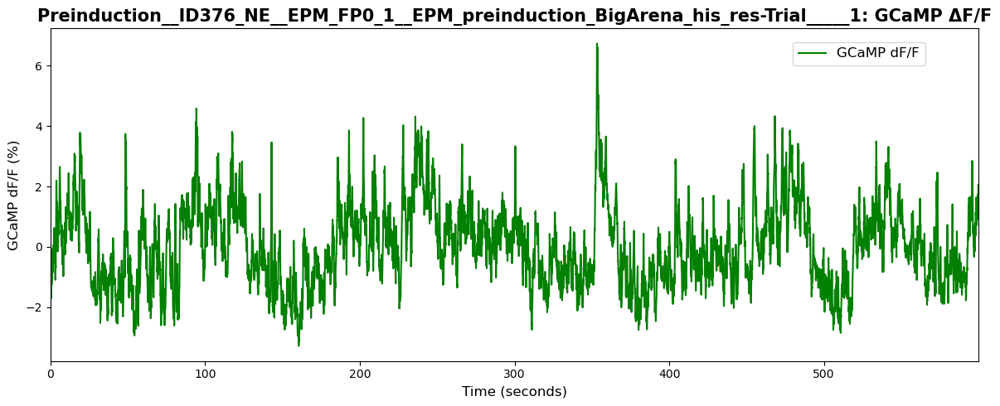

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Pick a trial
trial_key = list(coregistered_traces.keys())[0]
df = coregistered_traces[trial_key]

time_seconds = df["Time_video"].values

# Compute ΔF/F (%) using motion-corrected signal and exponential fit - so it is not divided by the iso signal, but by the double exponential fit from earlier - however, that was fit before bleach correction, so why do we divide by this? wouldn't this have the bleaching slope with it, which our new trace does not? would it be better to divide by the bleach corrected iso signal? or even add motion correction to the iso signal and divide by the motion-corrected iso signal?
gcamp_dF_F = 100 * df["gcamp_motion_corrected"] / df["gcamp_expfit"]

# Example reward cue times (replace with your actual reward timestamps if available)
# reward_cue_times = np.array([...])
# For now, we'll just leave this commented or empty if you don't have them
reward_cue_times = np.array([])  

# Plot ΔF/F
fig, ax1 = plt.subplots(figsize=(12,5))

plot1 = ax1.plot(time_seconds, gcamp_dF_F, 'g', label='GCaMP dF/F')
if reward_cue_times.size > 0:
    reward_ticks = ax1.plot(reward_cue_times, np.full(np.size(reward_cue_times), 6),
                            label='Reward Cue', color='w', marker="v", mfc='k', mec='k', ms=8)

ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('GCaMP dF/F (%)')
ax1.set_title(f'{trial_key}: GCaMP ΔF/F')

# Legend
lines = plot1
if reward_cue_times.size > 0:
    lines += reward_ticks
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper right', bbox_to_anchor=(0.95, 0.98))


plt.tight_layout()
plt.show()

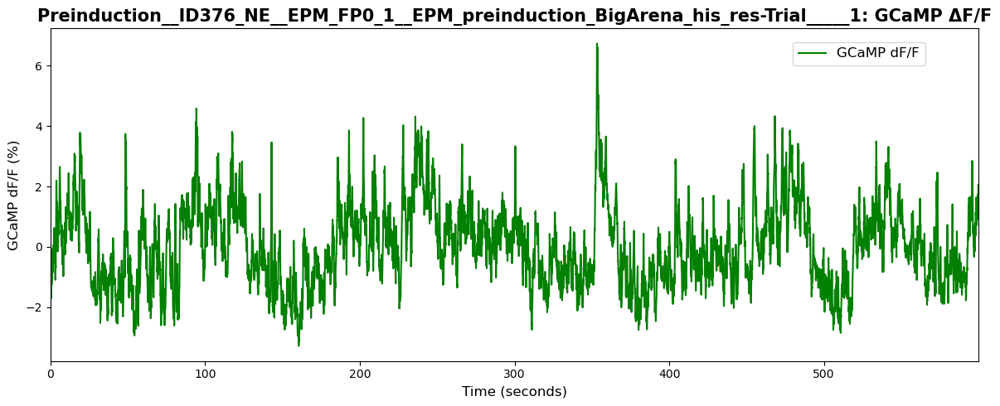

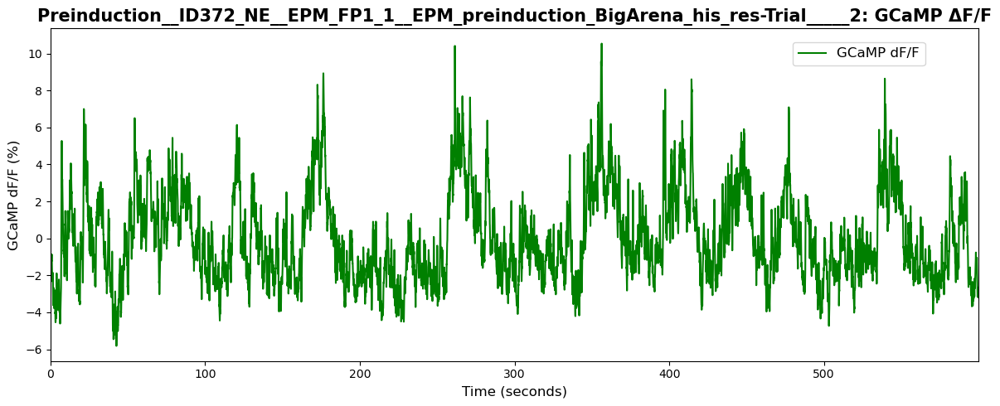

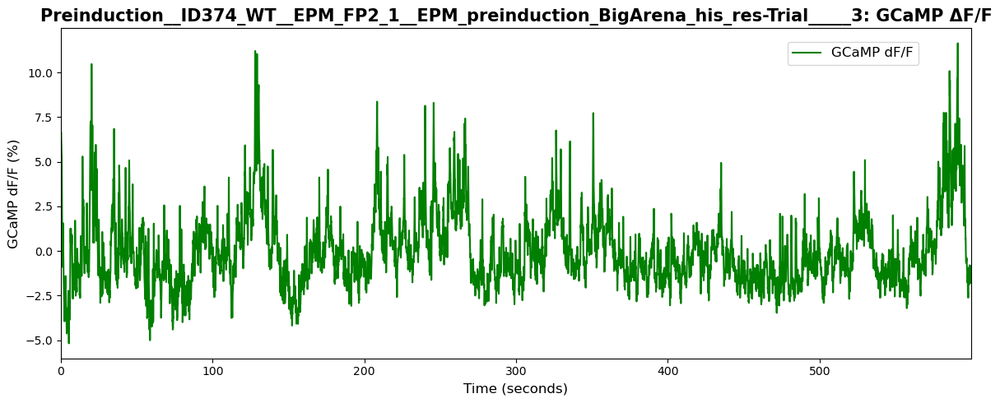

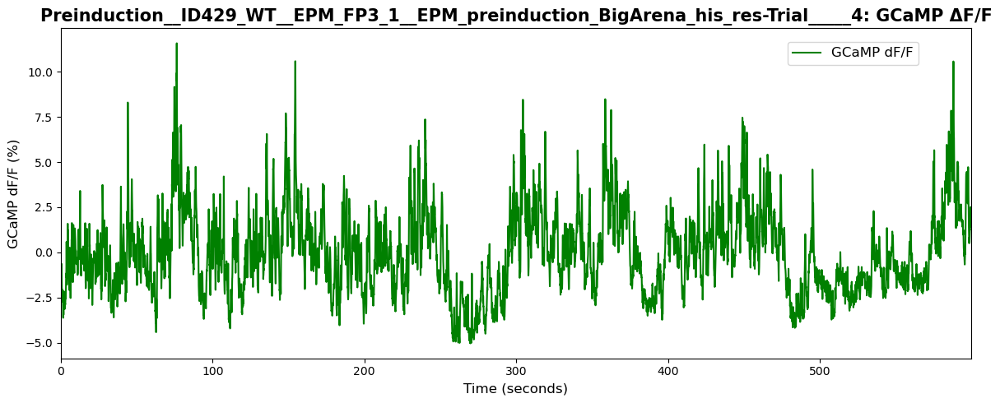

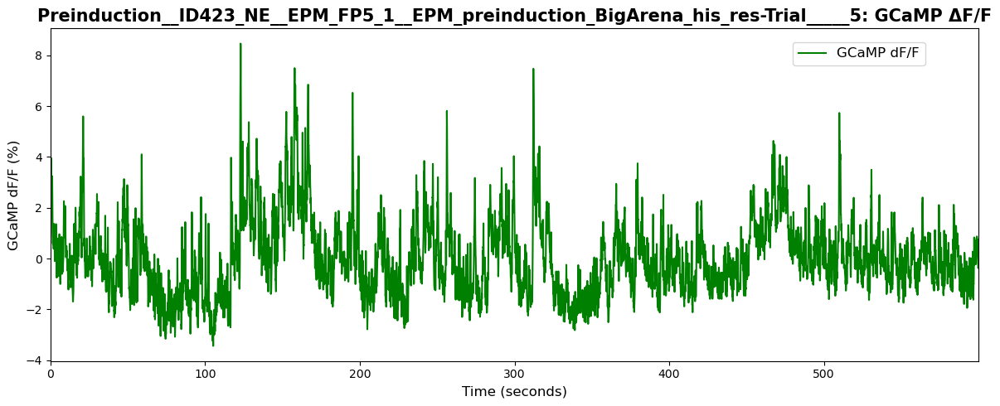

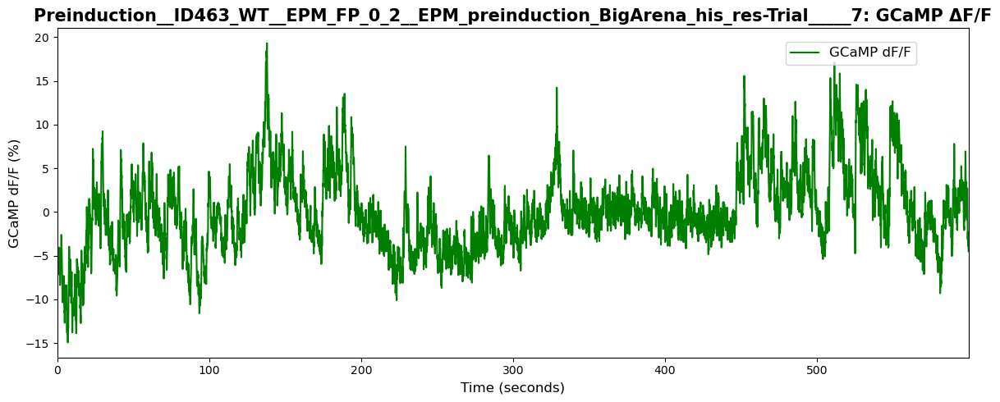

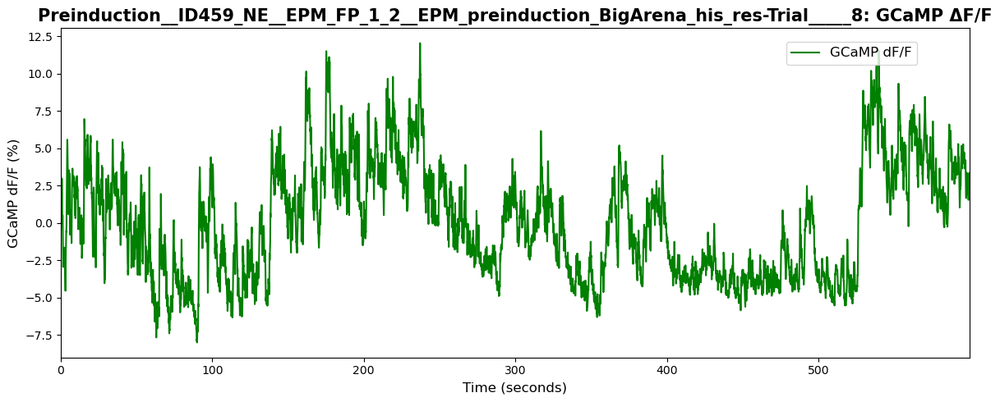

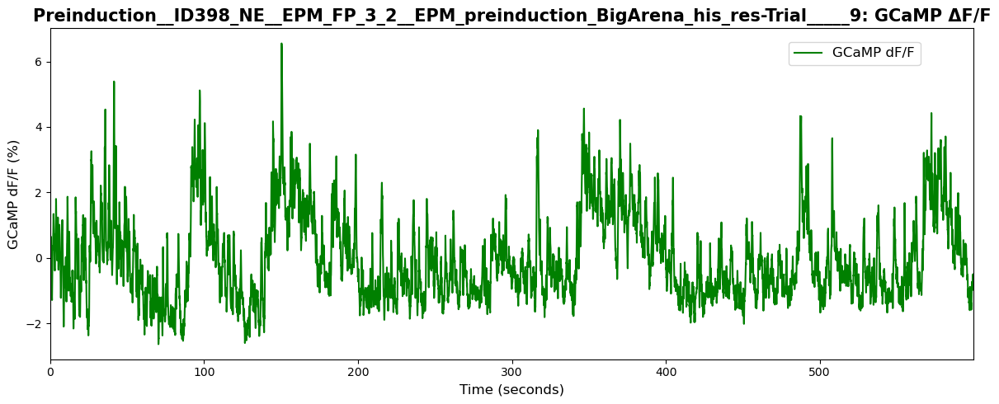

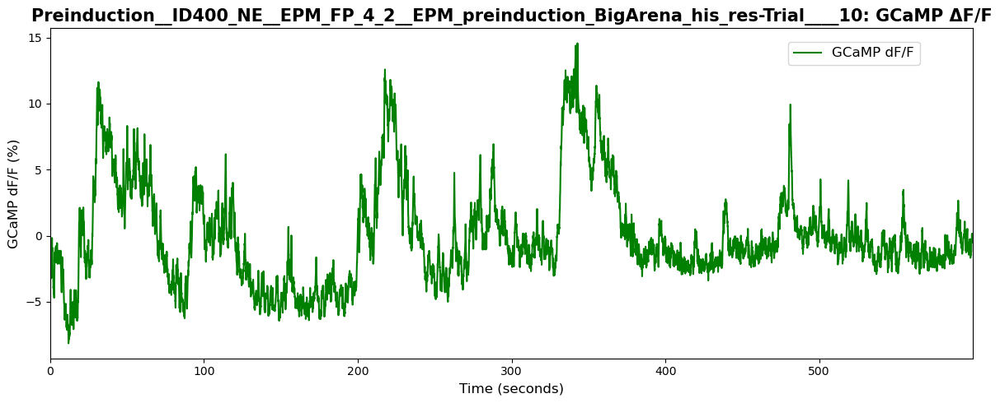

Index(['Time_video', 'iso415', 'gcamp470', 'gcamp_denoised', 'iso_denoised',
       'gcamp_expfit', 'iso_expfit', 'gcamp_bleach_corrected',
       'iso_bleach_corrected', 'gcamp_expfit_walton', 'iso_expfit_walton',
       'gcamp_corrected_walton', 'iso_corrected_walton',
       'iso_expfit_photometrics', 'gcamp_expfit_photometrics',
       'gcamp_corrected_photometrics', 'iso_corrected_photometrics',
       'gcamp_motion_corrected', 'gcamp_est_motion', 'gcamp_dF_F'],
      dtype='object')


In [35]:
import numpy as np
import matplotlib.pyplot as plt

# Example reward cue times (replace with actual timestamps if available)
reward_cue_times = np.array([])

# Loop over all trials
for trial_key, df in coregistered_traces.items():
    time_seconds = df["Time_video"].values

    # Compute ΔF/F (%) for GCaMP (gcamp_bleach_corrected / gcamp_expfit)
    df["gcamp_dF_F"] = 100 * df["gcamp_motion_corrected"] / df["gcamp_expfit"]

    # Optional: compute ΔF/F for ISO channel if desired
    # df["iso_dF_F"] = 100 * df["iso_bleach_corrected"] / df["iso_expfit"]

    # -------------------------
    # Plot ΔF/F for each trial
    # -------------------------
    fig, ax1 = plt.subplots(figsize=(12,5))
    
    plot1 = ax1.plot(time_seconds, df["gcamp_dF_F"], 'g', label='GCaMP dF/F')
    
    if reward_cue_times.size > 0:
        reward_ticks = ax1.plot(reward_cue_times, np.full(np.size(reward_cue_times), 6),
                                label='Reward Cue', color='w', marker="v", mfc='k', mec='k', ms=8)
    
    ax1.set_xlabel('Time (seconds)')
    ax1.set_ylabel('GCaMP dF/F (%)')
    ax1.set_title(f'{trial_key}: GCaMP ΔF/F')
    
    # Combine legend
    lines = plot1
    if reward_cue_times.size > 0:
        lines += reward_ticks
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper right', bbox_to_anchor=(0.95, 0.98))
    
    
    plt.tight_layout()
    plt.show()
    #add the variables to the data frame
    #df["gcamp_motion_corrected"] = gcamp_motion_corrected
    #df["gcamp_est_motion"] = gcamp_est_motion


 #check columns added to overall dataframe
first_key = list(coregistered_traces.keys())[0]
print(coregistered_traces[first_key].columns)

Method 2: Z-scoring

Alternatively, we can normalise the data by z-scoring each session - i.e. subtracting the mean and dividing by the standard deviation.

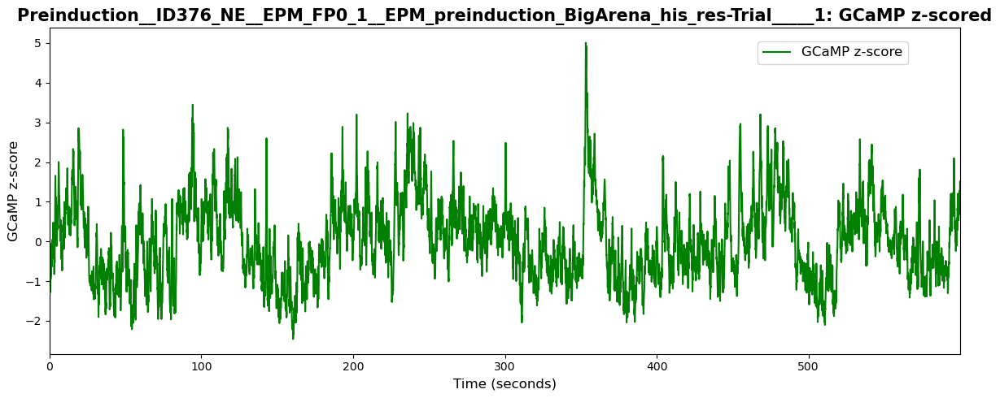

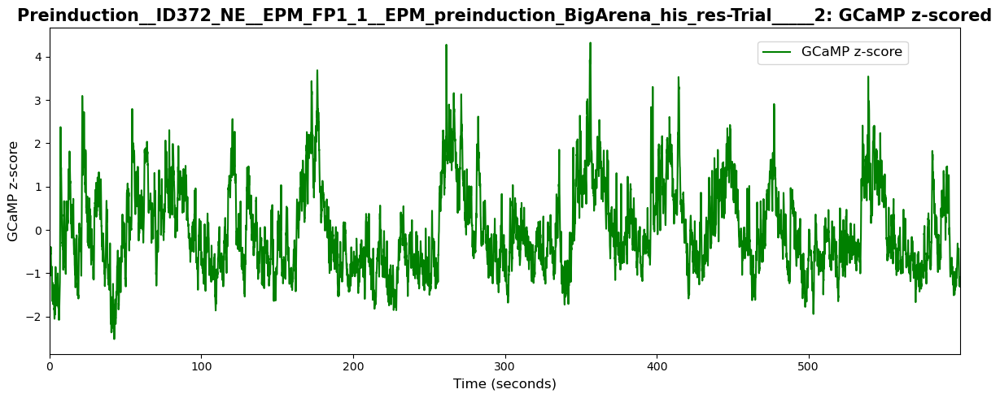

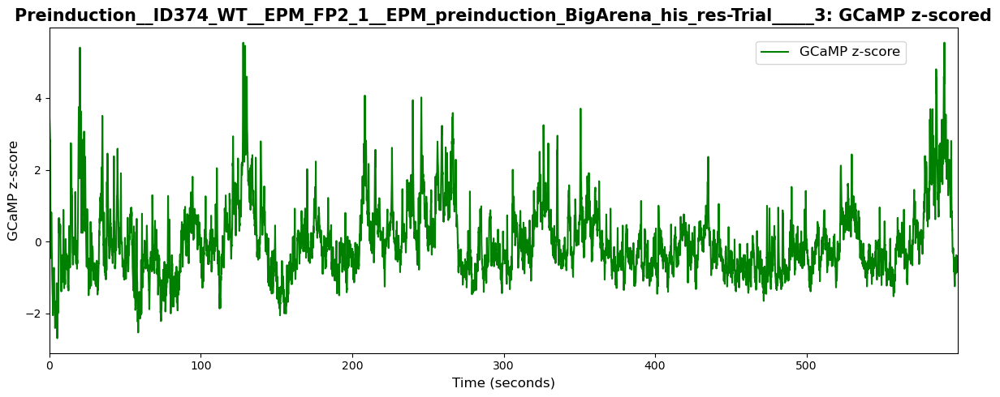

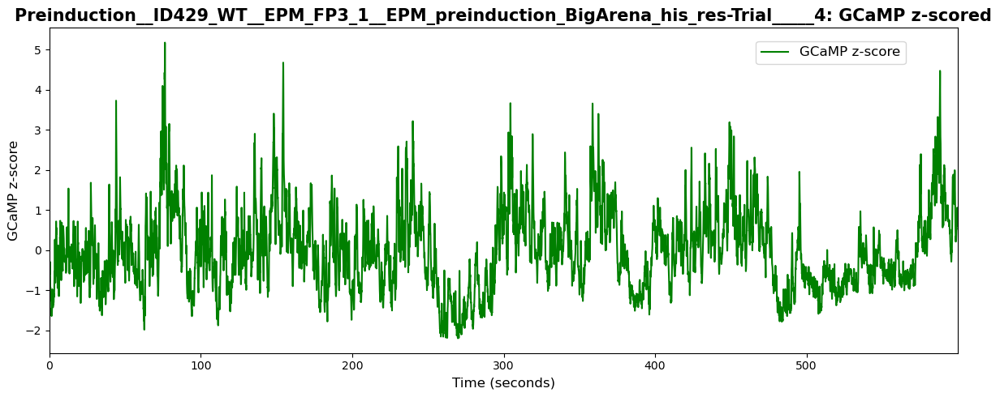

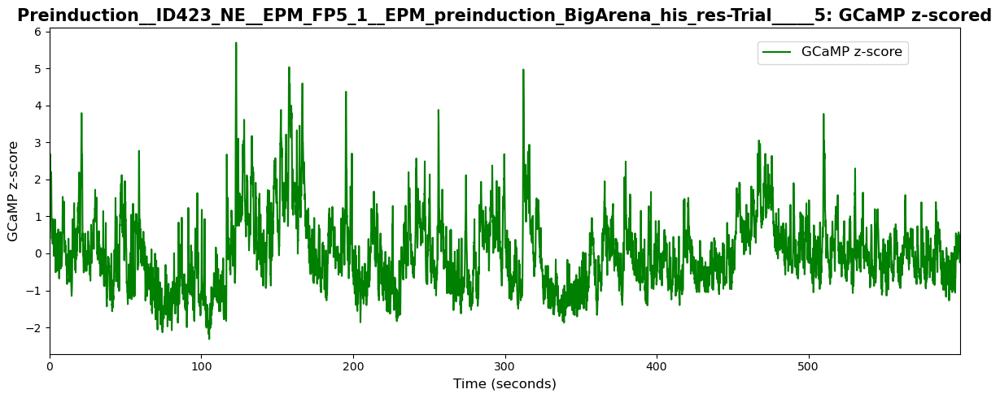

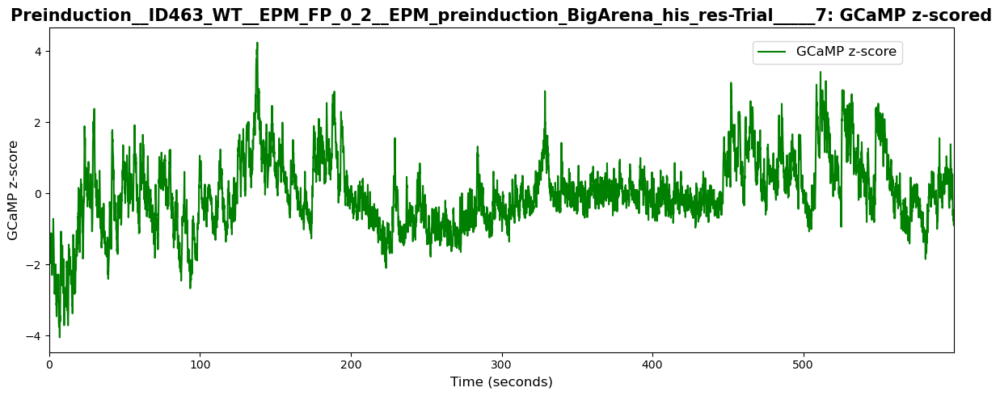

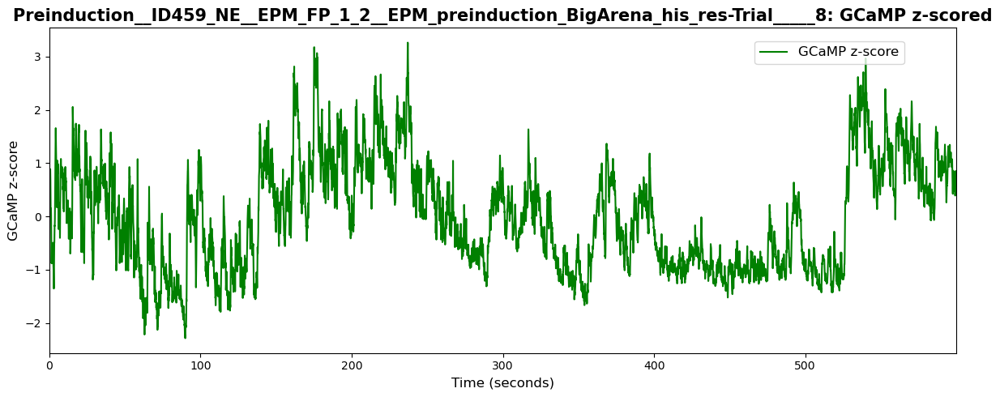

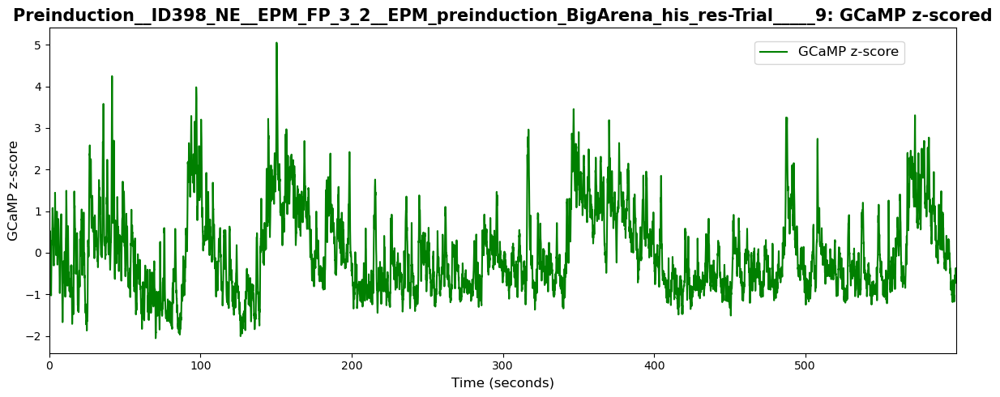

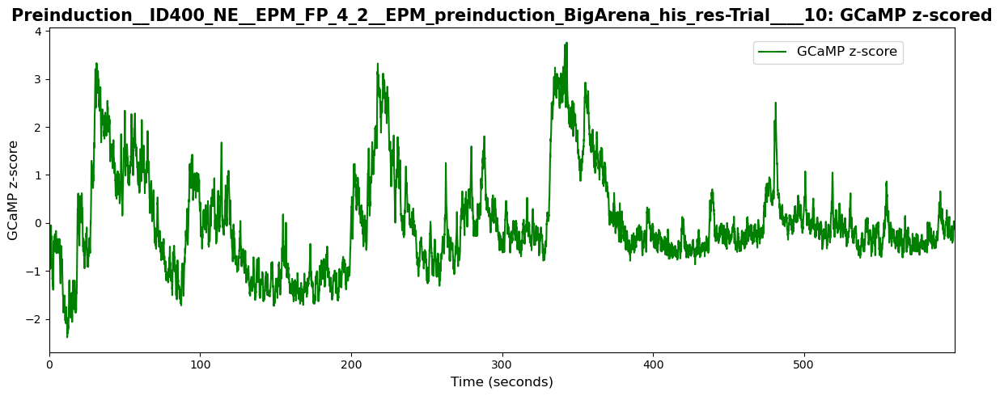

Index(['Time_video', 'iso415', 'gcamp470', 'gcamp_denoised', 'iso_denoised',
       'gcamp_expfit', 'iso_expfit', 'gcamp_bleach_corrected',
       'iso_bleach_corrected', 'gcamp_expfit_walton', 'iso_expfit_walton',
       'gcamp_corrected_walton', 'iso_corrected_walton',
       'iso_expfit_photometrics', 'gcamp_expfit_photometrics',
       'gcamp_corrected_photometrics', 'iso_corrected_photometrics',
       'gcamp_motion_corrected', 'gcamp_est_motion', 'gcamp_dF_F', 'gcamp_z'],
      dtype='object')


In [36]:
import numpy as np
import matplotlib.pyplot as plt

# Example reward cue times (replace with actual timestamps if available)
reward_cue_times = np.array([])

# Loop over all trials
for trial_key, df in coregistered_traces.items():
    time_seconds = df["Time_video"].values

    # Compute z-score for motion- and bleach-corrected GCaMP
    df["gcamp_z"] = (df["gcamp_motion_corrected"] - np.mean(df["gcamp_motion_corrected"])) / np.std(df["gcamp_motion_corrected"])

    # Optional: compute z-score for ISO if desired
    # df["iso_z"] = (df["iso_corrected"] - np.mean(df["iso_corrected"])) / np.std(df["iso_corrected"])

    # -------------------------
    # Plot z-scored GCaMP for each trial
    # -------------------------
    fig, ax1 = plt.subplots(figsize=(12,5))
    
    plot1 = ax1.plot(time_seconds, df["gcamp_z"], 'g', label='GCaMP z-score')
    
    if reward_cue_times.size > 0:
        reward_ticks = ax1.plot(reward_cue_times, np.full(np.size(reward_cue_times), 6),
                                label='Reward Cue', color='w', marker="v", mfc='k', mec='k', ms=8)
    
    ax1.set_xlabel('Time (seconds)')
    ax1.set_ylabel('GCaMP z-score')
    ax1.set_title(f'{trial_key}: GCaMP z-scored')
    
    # Combine legend
    lines = plot1
    if reward_cue_times.size > 0:
        lines += reward_ticks
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper right', bbox_to_anchor=(0.95, 0.98))
    
    
    plt.tight_layout()
    plt.show()

 #check columns added to overall dataframe
first_key = list(coregistered_traces.keys())[0]
print(coregistered_traces[first_key].columns)

# Putting together corrections to ethovision ethogram and FP preprocessed traces

below code uses all the preprocessed signals, also the intermediares + skip to the next block to see only delta F over F signal

In [63]:
def map_behavior_to_time(time_vector, timeline_kernel):
    """
    Map the kernel-smoothed behavior to each timepoint in the FP time vector.
    
    Args:
        time_vector (np.array): FP time points (Time_video)
        timeline_kernel (pd.DataFrame): Kernel-smoothed ethogram with columns
                                        ['Behavior', 'Start_time_s', 'End_time_s']
    Returns:
        np.array: Behavior label for each time point
    """
    behavior_at_time = np.array(["Unknown"] * len(time_vector), dtype=object)

    for _, row in timeline_kernel.iterrows():
        mask = (time_vector >= row["Start_time_s"]) & (time_vector < row["End_time_s"])
        behavior_at_time[mask] = row["Behavior"]

    return behavior_at_time


In [64]:
combined_trials = {}

for key in coregistered_traces.keys():
    df = coregistered_traces[key].copy()
    if "timeline_kernel" in fp_traces[key]:
        timeline_kernel = fp_traces[key]["timeline_kernel"]
        df["Behavior"] = map_behavior_to_time(df["Time_video"].values, timeline_kernel)
    else:
        df["Behavior"] = "Unknown"  # fallback
    combined_trials[key] = df


In [39]:
# import matplotlib.pyplot as plt
# import matplotlib.patches as mpatches
# import numpy as np

# def plot_fp_with_ethogram(df, key, save_dir=None):
#     """
#     Plot FP preprocessed traces together with kernel-smoothed ethogram.
    
#     df must contain:
#         Time_video
#         iso415_smooth
#         gcamp_bleach_corrected
#         iso_fit
#         dFF
#         Behavior
#     """
#     time = df["Time_video"].values
#     iso = df["iso_bleach_corrected"].values
#     gcamp = df["gcamp_bleach_corrected"].values
#     baseline = df["gcamp_est_motion"].values
#     dFF = df["gcamp_dF_F"].values
#     behaviors = df["Behavior"].values

#     # Unique behaviors and colors
#     beh_labels = np.unique(behaviors)
#     colors = plt.cm.tab10(np.arange(len(beh_labels)))  # up to 10 colors
#     beh_color_map = dict(zip(beh_labels, colors))

#     fig, axes = plt.subplots(4, 1, figsize=(14, 10), sharex=True,
#                              gridspec_kw={"height_ratios": [2, 2, 1, 1]})

#     # --- 1) ISO 415 ---
#     axes[0].plot(time, iso, color="gray", linewidth=1)
#     axes[0].set_ylabel("ISO 415")
#     axes[0].set_title(f"{key} — FP + Kernel-smoothed ethogram")

#     # --- 2) GCaMP 470 ---
#     axes[1].plot(time, gcamp, color="green", linewidth=1)
#     axes[1].set_ylabel("GCaMP 470")

#     # --- 3) Baseline vs GCaMP ---
#     axes[2].plot(time, gcamp, color="green", linewidth=0.8, label="GCaMP")
#     axes[2].plot(time, baseline, color="black", linewidth=0.8, linestyle="--", label="Fitted baseline")
#     axes[2].set_ylabel("Value")
#     axes[2].legend(loc="upper right")

#     # --- 4) dF/F (%) ---
#     axes[3].plot(time, dFF, color="purple", linewidth=0.8)
#     axes[3].set_ylabel("dF/F (%)")
#     axes[3].set_xlabel("Time (s)")

#     # --- Overlay ethogram as colored bands ---
#     for ax in axes:
#         for beh in beh_labels:
#             mask = behaviors == beh
#             ax.fill_between(time, ax.get_ylim()[0], ax.get_ylim()[1],
#                             where=mask, color=beh_color_map[beh], alpha=0.2, step="post")

#     # Create legend for behaviors
#     handles = [mpatches.Patch(color=beh_color_map[b], alpha=0.3, label=b) for b in beh_labels]
#     axes[0].legend(handles=handles, bbox_to_anchor=(1.05, 1), loc="upper left")

#     plt.tight_layout()

#     # Save or show
#     if save_dir is not None:
#         out = save_dir / f"{key}_FP_ethogram.png"
#         plt.savefig(out, dpi=200)
#         plt.close()
#     else:
#         plt.show()


In [40]:
# example_key = list(combined_trials.keys())[0]
# plot_fp_with_ethogram(combined_trials[example_key], example_key)


In [41]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

def plot_dff_with_ethogram(df, key, save_dir=None):
    """
    Plot only the dF/F (%) signal together with kernel-smoothed ethogram.

    df must contain:
        Time_video
        dFF
        Behavior
    """
    time = df["Time_video"].values
    dFF = df["gcamp_dF_F"].values
    behaviors = df["Behavior"].values

    # Unique behaviors and colors
    beh_labels = np.unique(behaviors)
    colors = plt.cm.tab10(np.arange(len(beh_labels)))  # up to 10 colors
    beh_color_map = dict(zip(beh_labels, colors))

    fig, ax = plt.subplots(1, 1, figsize=(14, 4))

    # Plot dF/F
    ax.plot(time, dFF, color="purple", linewidth=1)
    ax.set_ylabel("dF/F (%)")
    ax.set_xlabel("Time (s)")
    ax.set_title(f"{key} — dF/F with kernel-smoothed ethogram")

    # Overlay ethogram as colored bands
    for beh in beh_labels:
        mask = behaviors == beh
        ax.fill_between(time, ax.get_ylim()[0], ax.get_ylim()[1],
                        where=mask, color=beh_color_map[beh], alpha=0.2, step="post")

    # Legend for behaviors
    handles = [mpatches.Patch(color=beh_color_map[b], alpha=0.3, label=b) for b in beh_labels]
    ax.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc="upper left")

    plt.tight_layout()

    if save_dir is not None:
        out = save_dir / f"{key}_dFF_ethogram.png"
        plt.savefig(out, dpi=200)
        plt.close()
    else:
        plt.show()


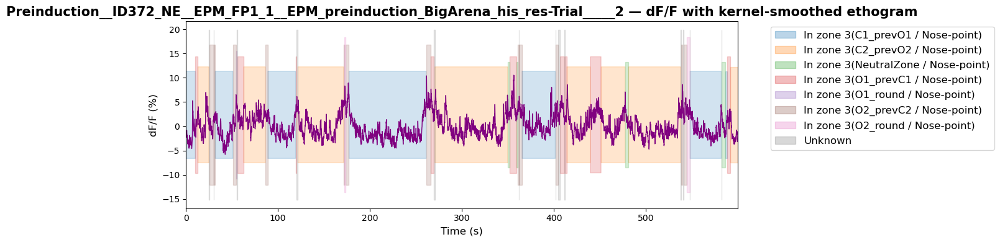

In [42]:
example_key = list(combined_trials.keys())[1]
plot_dff_with_ethogram(combined_trials[example_key], example_key)


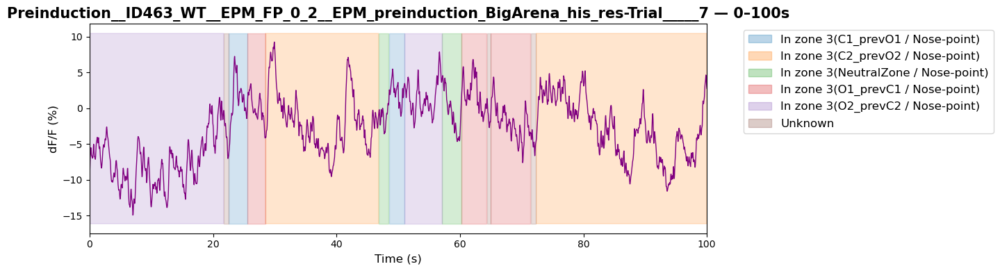

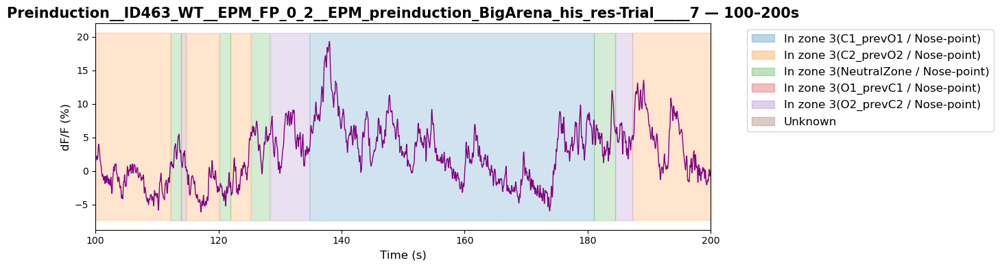

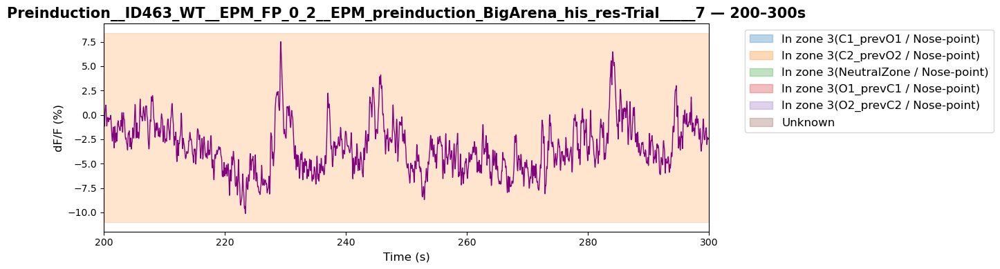

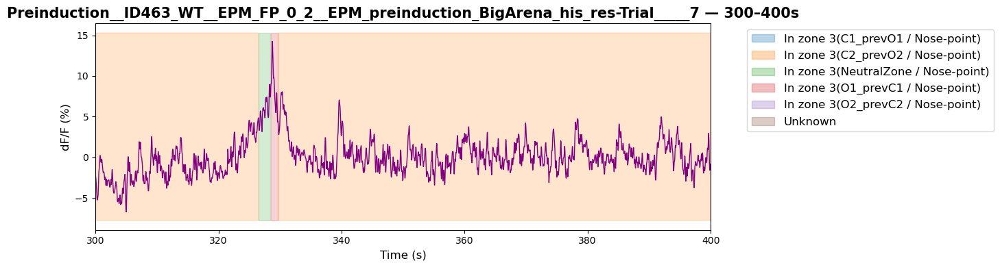

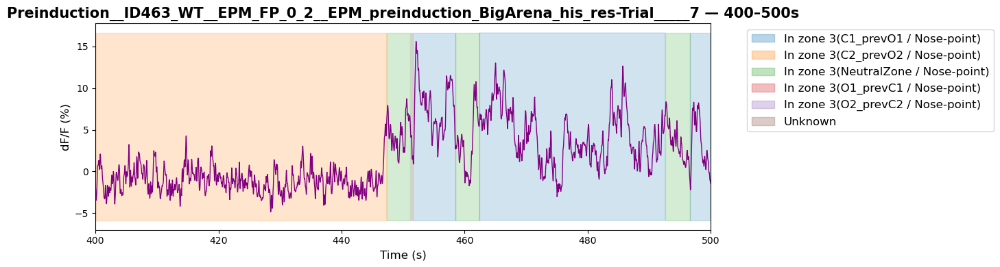

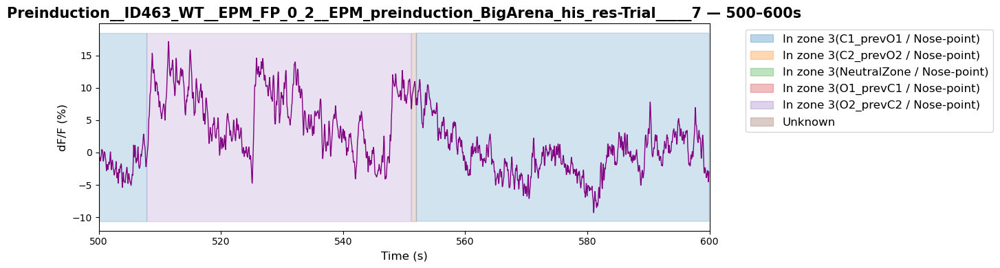

In [43]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

def plot_dff_segments(df, key, window=100, save_dir=None):
    """
    Plot dF/F with ethogram in consecutive time windows.

    Parameters
    ----------
    window : int or float
        Length of each segment in seconds
    """
    time = df["Time_video"].values
    dFF = df["gcamp_dF_F"].values
    behaviors = df["Behavior"].values

    beh_labels = np.unique(behaviors)
    colors = plt.cm.tab10(np.arange(len(beh_labels)))
    beh_color_map = dict(zip(beh_labels, colors))

    start = 0
    end = time.max()

    segment_idx = 0

    while start < end:
        stop = start + window

        mask = (time >= start) & (time < stop)

        fig, ax = plt.subplots(figsize=(14, 4))

        ax.plot(time[mask], dFF[mask], color="purple", linewidth=1)
        ax.set_xlim(start, stop)
        ax.set_ylabel("dF/F (%)")
        ax.set_xlabel("Time (s)")
        ax.set_title(f"{key} — {start:.0f}–{stop:.0f}s")

        ymin, ymax = ax.get_ylim()

        # Ethogram overlay
        for beh in beh_labels:
            beh_mask = (behaviors == beh) & mask
            ax.fill_between(time, ymin, ymax,
                            where=beh_mask,
                            color=beh_color_map[beh],
                            alpha=0.2,
                            step="post")

        handles = [mpatches.Patch(color=beh_color_map[b], alpha=0.3, label=b)
                   for b in beh_labels]
        ax.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc="upper left")

        plt.tight_layout()

        if save_dir is not None:
            out = save_dir / f"{key}_segment_{segment_idx}.png"
            plt.savefig(out, dpi=200)
            plt.close()
        else:
            plt.show()

        start += window
        segment_idx += 1

example_key = list(combined_trials.keys())[5]
plot_dff_segments(combined_trials[example_key], example_key, window=100)

# PERI EVENT PLOTS CORRECTED SIGNAL


In [44]:
#okay do this, but instead of a defined time window, take the entire length of the occurrence, plus 5 s before and after the event.

In [65]:
import numpy as np
import pandas as pd

# Pick the trial
example_key = list(combined_trials.keys())[1]
df = combined_trials[example_key]

behaviors = df["Behavior"].values
unique_beh = np.unique(behaviors)

# Count number of instances (rising edges into each behavior)
event_counts = {}

for beh in unique_beh:
    mask = (behaviors == beh)
    mask_int = mask.astype(int)
    diffs = np.diff(np.r_[0, mask_int])  # prepend 0 for first element
    event_starts_idx = np.where(diffs == 1)[0]  # transitions into behavior
    event_counts[beh] = len(event_starts_idx)

# Convert to DataFrame for display
event_counts_df = pd.DataFrame.from_dict(event_counts, orient="index", columns=["Num_Instances"])
event_counts_df.index.name = "Behavior"
event_counts_df


,Num_Instances
Behavior,
In zone 3(C1_prevO1 / Nose-point),7
In zone 3(C2_prevO2 / Nose-point),8
In zone 3(NeutralZone / Nose-point),4
In zone 3(O1_prevC1 / Nose-point),9
In zone 3(O1_round / Nose-point),1
In zone 3(O2_prevC2 / Nose-point),12
In zone 3(O2_round / Nose-point),2
Unknown,13


In [66]:
# timeline = []

# prev = None

# for b in behaviors:
#     if b != prev:
#         timeline.append(b)
#         prev = b

# timeline

# ---------- BUILD TIMELINE WITH INDEX TRACKING + EVENT HIGHLIGHT SUPPORT ----------

timeline = []
timeline_idx = []
timeline_flags = []  # optional: mark valid event-related positions

prev = None

for i, b in enumerate(behaviors):

    # keep only transitions (same logic as before)
    if b != prev:
        timeline.append(b)
        timeline_idx.append(i)
        prev = b

# OPTIONAL: mark which timeline points correspond to event starts
# (only works if you have a variable called `starts` in scope)

start_set = set(starts) if "starts" in globals() else set()

for idx in timeline_idx:
    if idx in start_set:
        timeline_flags.append("EVENT")
    elif idx - 1 in start_set:
        timeline_flags.append("PREV")
    else:
        timeline_flags.append(None)

timeline




['In zone 3(C1_prevO1 / Nose-point)',
 'In zone 3(O1_prevC1 / Nose-point)',
 'In zone 3(C2_prevO2 / Nose-point)',
 'Unknown',
 'In zone 3(O2_prevC2 / Nose-point)',
 'Unknown',
 'In zone 3(O2_prevC2 / Nose-point)',
 'In zone 3(C1_prevO1 / Nose-point)',
 'In zone 3(O2_prevC2 / Nose-point)',
 'In zone 3(O1_round / Nose-point)',
 'Unknown',
 'In zone 3(O1_prevC1 / Nose-point)',
 'In zone 3(C2_prevO2 / Nose-point)',
 'In zone 3(O2_prevC2 / Nose-point)',
 'In zone 3(C1_prevO1 / Nose-point)',
 'In zone 3(O1_prevC1 / Nose-point)',
 'Unknown',
 'In zone 3(C2_prevO2 / Nose-point)',
 'In zone 3(O2_prevC2 / Nose-point)',
 'In zone 3(O2_round / Nose-point)',
 'In zone 3(O2_prevC2 / Nose-point)',
 'In zone 3(C1_prevO1 / Nose-point)',
 'In zone 3(O2_prevC2 / Nose-point)',
 'In zone 3(O1_prevC1 / Nose-point)',
 'Unknown',
 'In zone 3(C2_prevO2 / Nose-point)',
 'In zone 3(NeutralZone / Nose-point)',
 'In zone 3(O1_prevC1 / Nose-point)',
 'In zone 3(NeutralZone / Nose-point)',
 'In zone 3(O2_prevC2 / No

In [67]:
# added rhis code when error main behaviours not defined below - not sure if ti is appropriate 

df_out = pd.DataFrame()
df_test = combined_trials['Preinduction__ID376_NE__EPM_FP0_1__EPM_preinduction_BigArena_his_res-Trial_____1']

main_behaviors = ['In Zone(c1_prevo1 / nose-point)', 'In Zone(c2_prevo2 / nose-point)']
prev_behaviors = ['In Zone(o1_prevc1 / nose-point)', 'In Zone(o2_prevc2 / nose-point)']

for i, row in df_test.iterrows():
    if i == 0:
        continue  # skip first row, no previous row exists

    if (
        row['Behavior'] in main_behaviors and
        df_test.loc[i-1, 'Behavior'] in prev_behaviors
    ):
        df_out = pd.concat([df_out, row.to_frame().T], ignore_index=True)

In [68]:
timeline = []
timeline_idx = []
timeline_flags = []

prev = None

# 1) build clean transition timeline (same as before)
for i, b in enumerate(behaviors):
    if b != prev:
        timeline.append(b)
        timeline_idx.append(i)
        prev = b

# 2) EXACT event detection (matches your plotting logic)
mask = np.isin(behaviors, main_behaviors)
starts = np.where(np.diff(np.r_[0, mask.astype(int)]) == 1)[0]

valid_starts = [
    i for i in starts
    if i > 0 and behaviors[i - 1] in prev_behaviors
]

valid_set = set(valid_starts)

# 3) mark timeline entries
for idx in timeline_idx:
    if idx in valid_set:
        timeline_flags.append("EVENT")
    elif idx - 1 in valid_set:
        timeline_flags.append("PREV")
    else:
        timeline_flags.append(None)

def simplify(b):
    if "c1" in b:
        return "c1"
    elif "c2" in b:
        return "c2"
    elif "o1" in b:
        return "o1"
    elif "o2" in b:
        return "o2"
    elif b == "Other":
        return "X"
    else:
        return "?"

out = []

for b, flag in zip(timeline, timeline_flags):
    s = simplify(b)

    if flag == "EVENT":
        s = f"[{s}]"
    elif flag == "PREV":
        s = f"({s})"

    out.append(s)

print(" → ".join(out))

? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ? → ?


In [69]:
example_key = list(combined_trials.keys())[0]
df = combined_trials[example_key].copy()

if "timeline_kernel" in fp_traces[example_key]:
    timeline_kernel = fp_traces[example_key]["timeline_kernel"]
else:
    raise ValueError(f"timeline_kernel not found for trial {example_key}")


In [70]:
# bar plots

def map_kernel_to_time_vector(time_vector, timeline_kernel):
    """
    Assign behavior to each FP timepoint exactly as in the ethogram plots.
    Fills gaps with 'Other'.
    """
    behavior_at_time = np.array(["Other"] * len(time_vector), dtype=object)
    
    for _, row in timeline_kernel.iterrows():
        mask = (time_vector >= row["Start_time_s"]) & (time_vector < row["End_time_s"])
        behavior_at_time[mask] = row["Behavior"]
    
    return behavior_at_time


combined_trials = {}

for key in coregistered_traces.keys():
    df = coregistered_traces[key].copy()
    if "timeline_kernel" in fp_traces[key]:
        timeline_kernel = fp_traces[key]["timeline_kernel"]
        df["Behavior"] = map_kernel_to_time_vector(df["Time_video"].values, timeline_kernel)
    else:
        df["Behavior"] = "Other"  # fallback
    combined_trials[key] = df

import numpy as np
import pandas as pd

# -------------------------------------------------------------
# BUILD mean_summary_df from combined_trials + fp_traces
# -------------------------------------------------------------

mean_rows = []

for trial_key, df in combined_trials.items():

    fp_info = fp_traces[trial_key]

    mouse_id  = fp_info.get("mouse_id")
    genotype  = fp_info.get("genotype")
    condition = fp_info.get("condition")
    week      = fp_info.get("week")

    # behavior labels + signal
    beh = df["Behavior"].values
    dff = df["gcamp_dF_F"].values

    # list of behaviors in the trial
    unique_behaviors = np.unique(beh)

    for b in unique_behaviors:

        mask = beh == b
        if mask.sum() == 0:
            continue

        mean_dff = np.nanmean(dff[mask])
        npoints  = mask.sum()

        mean_rows.append({
            "mouse_id":  mouse_id,
            "genotype":  genotype,
            "condition": condition,
            "week":      week,
            "behavior":  b,
            "mean_dFF":  mean_dff,
            "n_points":  npoints,
            "trial_key": trial_key
        })

mean_summary_df = pd.DataFrame(mean_rows)

print("Created mean_summary_df with shape:", mean_summary_df.shape)
mean_summary_df.head()


Created mean_summary_df with shape: (62, 8)


,mouse_id,genotype,condition,week,behavior,mean_dFF,n_points,trial_key
0,376,NE,None,Preinduction,In zone 3(C1_prevO1 / Nose-point),-0.093200,7056,Preinduction__ID376_NE__EPM_FP0_1__EPM_preindu...
1,376,NE,None,Preinduction,In zone 3(C2_prevO2 / Nose-point),-0.469820,4075,Preinduction__ID376_NE__EPM_FP0_1__EPM_preindu...
2,376,NE,None,Preinduction,In zone 3(NeutralZone / Nose-point),0.242243,2531,Preinduction__ID376_NE__EPM_FP0_1__EPM_preindu...
3,376,NE,None,Preinduction,In zone 3(O1_prevC1 / Nose-point),1.179694,900,Preinduction__ID376_NE__EPM_FP0_1__EPM_preindu...
4,376,NE,None,Preinduction,In zone 3(O2_prevC2 / Nose-point),2.210931,415,Preinduction__ID376_NE__EPM_FP0_1__EPM_preindu...


In [71]:
from collections import Counter

week_counts = Counter()
for fp_info in fp_traces.values():
    week_counts[fp_info.get("week")] += 1

print("Week occurrences:")
for week, count in week_counts.items():
    print(f"{week}: {count}")
    
behavior_counts = Counter()
for trial_key, trial_data in combined_trials.items():
    behaviors = trial_data["Behavior"].values
    behavior_counts.update([str(b).strip().capitalize() for b in behaviors])

print("Behavior occurrences:")
for beh, count in behavior_counts.items():
    print(f"{beh}: {count}")

Week occurrences:
Preinduction: 9
Behavior occurrences:
Other: 1115
In zone 3(neutralzone / nose-point): 6901
In zone 3(o1_prevc1 / nose-point): 5838
In zone 3(c2_prevo2 / nose-point): 59918
In zone 3(o2_prevc2 / nose-point): 11524
In zone 3(c1_prevo1 / nose-point): 48479
In zone 3(o1_round / nose-point): 627
In zone 3(o2_round / nose-point): 573


In [72]:
from collections import defaultdict, Counter

# Initialize a dict-of-dicts: week → behavior → count
behavior_per_week = defaultdict(Counter)

for trial_key, trial_data in combined_trials.items():
    fp_info = fp_traces[trial_key]
    week = fp_info.get("week", "Unknown")  # handle missing weeks

    behaviors = trial_data["Behavior"].values
    for b in behaviors:
        if b != "Other":  # skip "Other"
            behavior_per_week[week][b] += 1

# Print counts per week
for week, counts in behavior_per_week.items():
    print(f"\n=== Week: {week} ===")
    for beh, count in counts.items():
        print(f"{beh}: {count}")


=== Week: Preinduction ===
In zone 3(NeutralZone / Nose-point): 6901
In zone 3(O1_prevC1 / Nose-point): 5838
In zone 3(C2_prevO2 / Nose-point): 59918
In zone 3(O2_prevC2 / Nose-point): 11524
In zone 3(C1_prevO1 / Nose-point): 48479
In zone 3(O1_round / Nose-point): 627
In zone 3(O2_round / Nose-point): 573


In [73]:
import re

for trial_key, fp_info in fp_traces.items():
    # Capture W1, W2, W3, or Preinduction
    m = re.search(r"(W\d+|Preinduction)", trial_key, flags=re.IGNORECASE)
    if m:
        fp_info["week"] = m.group(1).upper().strip()  # normalize
    else:
        fp_info["week"] = "Unknown"

In [74]:
combined_trials['Preinduction__ID376_NE__EPM_FP0_1__EPM_preinduction_BigArena_his_res-Trial_____1']

,Time_video,iso415,gcamp470,gcamp_denoised,iso_denoised,gcamp_expfit,iso_expfit,gcamp_bleach_corrected,iso_bleach_corrected,gcamp_expfit_walton,...,iso_corrected_walton,iso_expfit_photometrics,gcamp_expfit_photometrics,gcamp_corrected_photometrics,iso_corrected_photometrics,gcamp_motion_corrected,gcamp_est_motion,gcamp_dF_F,gcamp_z,Behavior
0,0.000000,0.033076,0.033753,0.033753,0.033076,0.033711,0.033073,0.000043,0.000003,0.033711,...,0.000003,0.033073,0.033710,0.000043,0.000003,0.000039,0.000004,0.115664,0.087335,Other
1,0.040000,0.033114,0.033775,0.033718,0.033100,0.033711,0.033073,0.000008,0.000027,0.033711,...,0.000027,0.033073,0.033710,0.000008,0.000027,-0.000029,0.000037,-0.086722,-0.065482,Other
2,0.080000,0.033101,0.033609,0.033669,0.033114,0.033710,0.033073,-0.000041,0.000041,0.033710,...,0.000041,0.033073,0.033710,-0.000041,0.000041,-0.000097,0.000056,-0.288838,-0.218095,Other
3,0.120000,0.033125,0.033639,0.033611,0.033114,0.033710,0.033073,-0.000100,0.000041,0.033710,...,0.000041,0.033073,0.033710,-0.000099,0.000041,-0.000156,0.000056,-0.461357,-0.348359,Other
4,0.160000,0.033103,0.033542,0.033542,0.033102,0.033710,0.033073,-0.000169,0.000028,0.033710,...,0.000028,0.033073,0.033710,-0.000168,0.000028,-0.000208,0.000039,-0.615760,-0.464944,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14992,599.679232,0.032974,0.033351,0.033373,0.032987,0.032847,0.032942,0.000527,0.000045,0.032847,...,0.000045,0.032942,0.032846,0.000528,0.000045,0.000465,0.000062,1.415521,1.041444,In zone 3(C1_prevO1 / Nose-point)
14993,599.719232,0.033018,0.033428,0.033424,0.032977,0.032847,0.032942,0.000577,0.000035,0.032847,...,0.000035,0.032942,0.032846,0.000578,0.000035,0.000529,0.000048,1.609006,1.183795,In zone 3(C1_prevO1 / Nose-point)
14994,599.759232,0.032936,0.033444,0.033480,0.032944,0.032847,0.032942,0.000633,0.000002,0.032847,...,0.000002,0.032942,0.032846,0.000634,0.000002,0.000631,0.000002,1.919983,1.412587,In zone 3(C1_prevO1 / Nose-point)
14995,599.799232,0.032882,0.033576,0.033489,0.032917,0.032847,0.032942,0.000642,-0.000024,0.032847,...,-0.000024,0.032942,0.032846,0.000643,-0.000024,0.000676,-0.000033,2.057700,1.513907,In zone 3(C1_prevO1 / Nose-point)


In [82]:
df_out = pd.DataFrame()

df_test = combined_trials[
    'Preinduction__ID376_NE__EPM_FP0_1__EPM_preinduction_BigArena_his_res-Trial_____1'
].reset_index(drop=True)

main_behaviors = [
    'In Zone(C1_prevO1 / Nose-point)',
    'In Zone(C2_prevO2 / Nose-point)'
]

prev_behaviors = [
    'In Zone(O1_prevC1 / Nose-point)',
    'In Zone(O2_prevC2 / Nose-point)'
]

for i in range(1, len(df_test)):
    row = df_test.iloc[i]
    prev_row = df_test.iloc[i - 1]

    if (
        row['Behavior'] in main_behaviors and
        prev_row['Behavior'] in prev_behaviors
    ):
        df_out = pd.concat([df_out, row.to_frame().T], ignore_index=True)

df_out

,Time_video,iso415,gcamp470,gcamp_denoised,iso_denoised,gcamp_expfit,iso_expfit,gcamp_bleach_corrected,iso_bleach_corrected,gcamp_expfit_walton,...,iso_corrected_walton,iso_expfit_photometrics,gcamp_expfit_photometrics,gcamp_corrected_photometrics,iso_corrected_photometrics,gcamp_motion_corrected,gcamp_est_motion,gcamp_dF_F,gcamp_z,Behavior
0,19.359968,0.03311,0.034744,0.034781,0.03304,0.033682,0.033069,0.001098,-0.000029,0.033682,...,-0.000029,0.033069,0.033682,0.001099,-0.000029,0.001138,-0.00004,3.378729,2.549067,In Zone(C2_prevO2 / Nose-point)
1,123.03984,0.033103,0.033961,0.033947,0.033091,0.033532,0.033046,0.000415,0.000045,0.033532,...,0.000045,0.033046,0.033532,0.000415,0.000045,0.000353,0.000062,1.053392,0.791169,In Zone(C2_prevO2 / Nose-point)
2,194.639712,0.033084,0.033735,0.033755,0.033079,0.033428,0.03303,0.000328,0.000049,0.033428,...,0.000049,0.03303,0.033428,0.000327,0.000049,0.000261,0.000067,0.780264,0.584218,In Zone(C2_prevO2 / Nose-point)
3,247.239648,0.033127,0.034422,0.034413,0.033096,0.033352,0.033019,0.001061,0.000077,0.033352,...,0.000077,0.033019,0.033352,0.001061,0.000077,0.000955,0.000106,2.862963,2.138751,In Zone(C1_prevO1 / Nose-point)
4,265.879616,0.033055,0.034158,0.034179,0.033018,0.033325,0.033015,0.000854,0.000003,0.033325,...,0.000003,0.033015,0.033325,0.000854,0.000003,0.00085,0.000004,2.55031,1.90365,In Zone(C1_prevO1 / Nose-point)


In [ ]:


# import re
# import numpy as np
# import matplotlib.pyplot as plt

# def funfunfunction(main_behaviors=None, prev_behaviors=None):
#     """
#     Funktion der tager en liste af main behaviours og en liste af previous 
#     behaviours og laver plots til de valgte udsnit.
#     """

#     # ---------- PARAMETERS ----------
#     pre_s = 2.0
#     post_s = 4.0

#     # ---------- NORMALIZE INPUT BEHAVIORS ----------
#     if main_behaviors is not None:
#         main_behaviors = [
#             re.sub(r"Zone\s*\d*", "Zone", b, flags=re.IGNORECASE)
#             for b in main_behaviors
#         ]
#     if prev_behaviors is not None:
#         prev_behaviors = [
#             re.sub(r"Zone\s*\d*", "Zone", b, flags=re.IGNORECASE)
#             for b in prev_behaviors
#         ]

#     # ---------- NORMALIZE FP_TRACES AND BEHAVIORS ----------
#     for trial_key, fp_info in fp_traces.items():
#         wk = fp_info.get("week", "")
#         if wk:
#             fp_info["week"] = wk.capitalize()
#         else:
#             m = re.search(r"(Preinduction|W\d+)", trial_key, flags=re.IGNORECASE)
#             if m:
#                 fp_info["week"] = m.group(1).capitalize()
#             else:
#                 fp_info["week"] = None
#                 print(f"[WARNING] No week found for trial key: {trial_key}")

#     for trial_key, trial_data in combined_trials.items():
#         normalized_behaviors = []
#         for b in trial_data["Behavior"].values:
#             if str(b).lower() == "other":
#                 normalized_behaviors.append("Other")
#             else:
#                 b_clean = re.sub(r"Zone\s*\d*", "Zone", str(b), flags=re.IGNORECASE)
#                 normalized_behaviors.append(b_clean)
#         trial_data["Behavior"] = normalized_behaviors

#     # ---------- COLLECT METADATA ----------
#     all_behaviors = set()
#     all_weeks = set()
#     all_genotypes = set()

#     for trial_key, trial_data in combined_trials.items():
#         fp_info = fp_traces[trial_key]

#         behs = np.unique(trial_data["Behavior"])
#         all_behaviors.update([b for b in behs if b != "Other"])

#         wk = fp_info.get("week")
#         if wk is not None:
#             all_weeks.add(wk)
#         else:
#             print(f"[WARNING] Week is None for trial {trial_key}")

#         all_genotypes.add(fp_info.get("genotype"))

#     week_order = ["Preinduction", "W1", "W2", "W3"]
#     all_weeks = sorted(all_weeks, key=lambda w: week_order.index(w) if w in week_order else 999)
#     all_genotypes = sorted(all_genotypes)
#     all_behaviors = sorted(all_behaviors)

#     print(f"Weeks detected: {all_weeks}")
#     print(f"Genotypes detected: {all_genotypes}")
#     print(f"Behaviors detected: {all_behaviors}")

#     # ---------- PLOTTING ----------
#     fig, axes = plt.subplots(
#         len(all_weeks),
#         len(all_genotypes),
#         figsize=(6 * len(all_genotypes), 4 * len(all_weeks)),
#         sharey=True,
#         sharex=True
#     )

#     if len(all_weeks) == 1:
#         axes = [axes]
#     if len(all_genotypes) == 1:
#         axes = [[axes[r]] for r in range(len(axes))]

#     for r, week in enumerate(all_weeks):
#         for c, genotype in enumerate(all_genotypes):
#             ax = axes[r][c]
#             mouse_segments = []
#             mouse_lengths = []

#             for trial_key, trial_data in combined_trials.items():
#                 fp_info = fp_traces[trial_key]

#                 if fp_info.get("week") != week:
#                     continue
#                 if fp_info.get("genotype") != genotype:
#                     continue

#                 df = trial_data.copy()
#                 time_vec = df["Time_video"].values
#                 signal_vec = df["gcamp_dF_F"].values
#                 behaviors = df["Behavior"].values

#                 # ---------- EVENT STARTS (FIXED) ----------
#                 mask = np.isin(behaviors, main_behaviors)
#                 starts = np.where(np.diff(np.r_[0, mask.astype(int)]) == 1)[0]

#                 # filter by preceding behavior
#                 starts = [
#                     i for i in starts
#                     if i > 0 and behaviors[i - 1] in prev_behaviors
#                 ]

#                 if len(starts) == 0:
#                     continue

#                 fps = 1.0 / np.mean(np.diff(time_vec))
#                 pre_n = int(pre_s * fps)
#                 post_n = int(post_s * fps)

#                 event_segments = []
#                 for idx in starts:
#                     start_idx = idx - pre_n
#                     stop_idx = idx + post_n

#                     seg = signal_vec[max(0, start_idx):min(stop_idx, len(signal_vec))].copy()

#                     if len(seg) > 0:
#                         pre_end = min(pre_n, len(seg))
#                         seg -= np.mean(seg[:pre_end])

#                     event_segments.append(seg)

#                 if len(event_segments) == 0:
#                     continue

#                 max_len_mouse = max(len(s) for s in event_segments)

#                 padded_events = []
#                 for s in event_segments:
#                     padded = np.full(max_len_mouse, np.nan)
#                     padded[:len(s)] = s
#                     padded_events.append(padded)

#                 mouse_mean = np.nanmean(np.vstack(padded_events), axis=0)

#                 mouse_segments.append(mouse_mean)
#                 mouse_lengths.append(len(mouse_mean))

#             if len(mouse_segments) == 0:
#                 ax.set_title(f"{week} | {genotype}\n(no events)")
#                 ax.grid(True)
#                 continue

#             target_len = max(mouse_lengths)

#             padded_mouse_segments = []
#             for seg in mouse_segments:
#                 padded = np.full(target_len, np.nan)
#                 padded[:len(seg)] = seg
#                 padded_mouse_segments.append(padded)

#             padded_mouse_segments = np.vstack(padded_mouse_segments)

#             t_window = np.linspace(-pre_s, post_s, target_len)

#             for i, seg in enumerate(padded_mouse_segments):
#                 ax.plot(t_window, seg, alpha=0.4, lw=1.5)

#             grand_mean = np.nanmean(padded_mouse_segments, axis=0)
#             ax.plot(t_window, grand_mean, lw=2.5)
#             ax.axvline(0, linestyle='--')

#             ax.set_title(f"{week} | {genotype}")
#             ax.grid(True)

#             if r == len(all_weeks) - 1:
#                 ax.set_xlabel("Time (s)")
#             if c == 0:
#                 ax.set_ylabel("ΔF/F (%)")

#     plt.tight_layout()
#     plt.show()
    

In [58]:
#all_behaviors

Weeks detected: ['Preinduction']


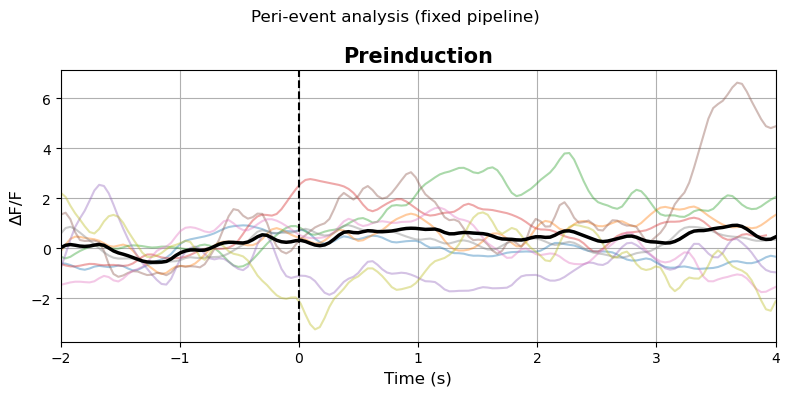

In [96]:


# import re
# import numpy as np
# import matplotlib.pyplot as plt


# # ============================================================
# # SAFE PRECEDING BEHAVIOR CHECK
# # ============================================================
# def valid_preceding_behavior(behaviors, idx, prev_behaviors):
#     i = idx - 1

#     while i >= 0:
#         b = behaviors[i]

#         if b in ["in zone(neutralzone/ nose-point)", "other"]:
#             i -= 1
#             continue

#         return b in prev_behaviors

#     return False


# # ============================================================
# # MAIN FUNCTION
# # ============================================================
# def funfunfunction(main_behaviors=None, prev_behaviors=None):

#     # ---------- PARAMETERS ----------
#     pre_s = 2.0
#     post_s = 4.0
#     min_duration_s = 2.0

#     # ============================================================
#     # NORMALIZE BEHAVIOR STRINGS IN DATA
#     # ============================================================
#     for trial_key, trial_data in combined_trials.items():
#         normalized = []

#         for b in trial_data["Behavior"].values:
#             b = str(b)

#             if b.lower() == "other":
#                 normalized.append("other")
#             else:
#                 b_clean = re.sub(r"\s+", " ", b)
#                 b_clean = b_clean.replace("Zone", "Zone")
#                 normalized.append(b_clean.lower())

#         trial_data["Behavior"] = np.array(normalized)

#     # normalize input lists too
#     main_behaviors = [b.lower() for b in main_behaviors]
#     prev_behaviors = [b.lower() for b in prev_behaviors]

#     # ============================================================
#     # EXTRACT WEEKS ROBUSTLY
#     # ============================================================
#     all_weeks = set()

#     for trial_key in combined_trials.keys():
#         wk = fp_traces.get(trial_key, {}).get("week")

#         if wk is None:
#             m = re.search(r"(Preinduction|W\d+)", trial_key, re.IGNORECASE)
#             wk = m.group(1).capitalize() if m else None

#         if wk:
#             all_weeks.add(wk)

#     week_order = ["Preinduction", "W1", "W2", "W3"]
#     all_weeks = sorted(all_weeks, key=lambda w: week_order.index(w))

#     print("Weeks detected:", all_weeks)

#     if len(all_weeks) == 0:
#         print("❌ No weeks found → nothing to plot")
#         return

#     # ============================================================
#     # FIGURE SETUP
#     # ============================================================
#     fig, axes = plt.subplots(
#         len(all_weeks),
#         1,
#         figsize=(8, 4 * len(all_weeks)),
#         sharex=True,
#         sharey=True
#     )

#     if len(all_weeks) == 1:
#         axes = [axes]

#     # ============================================================
#     # MAIN LOOP
#     # ============================================================
#     for r, week in enumerate(all_weeks):
#         ax = axes[r]

#         mouse_segments = []
#         mouse_lengths = []

#         for trial_key, trial_data in combined_trials.items():

#             fp_info = fp_traces.get(trial_key, {})
#             if fp_info.get("week") != week:
#                 continue

#             df = trial_data.copy()

#             time_vec = df["Time_video"].values
#             signal_vec = df["gcamp_dF_F"].values
#             behaviors = np.array(df["Behavior"].astype(str).values)

#             # ---------- EVENT DETECTION ----------
#             is_main = np.isin(behaviors, main_behaviors).astype(int)

#             starts = np.where(np.diff(np.r_[0, is_main]) == 1)[0]
#             ends = np.where(np.diff(np.r_[is_main, 0]) == -1)[0]

#             if len(starts) == 0:
#                 continue

#             if len(starts) != len(ends):
#                 min_len = min(len(starts), len(ends))
#                 starts = starts[:min_len]
#                 ends = ends[:min_len]

#             fps = 1.0 / np.mean(np.diff(time_vec))
#             pre_n = int(pre_s * fps)
#             post_n = int(post_s * fps)

#             valid_starts = []

#             # ---------- FILTER EVENTS ----------
#             for s, e in zip(starts, ends):

#                 duration = (e - s) / fps

#                 if duration < min_duration_s:
#                     continue

#                 if not valid_preceding_behavior(behaviors, s, prev_behaviors):
#                     continue

#                 valid_starts.append(s)

#             if len(valid_starts) == 0:
#                 continue

#             # ---------- EXTRACT SIGNAL ----------
#             event_segments = []

#             for idx in valid_starts:
#                 start = idx - pre_n
#                 stop = idx + post_n

#                 seg = signal_vec[max(0, start):min(len(signal_vec), stop)]

#                 if len(seg) == 0:
#                     continue

#                 seg = seg - np.mean(seg[:min(pre_n, len(seg))])
#                 event_segments.append(seg)

#             if len(event_segments) == 0:
#                 continue

#             # ---------- AVERAGE PER MOUSE ----------
#             max_len = max(len(s) for s in event_segments)
#             padded = np.full((len(event_segments), max_len), np.nan)

#             for i, s in enumerate(event_segments):
#                 padded[i, :len(s)] = s

#             mouse_mean = np.nanmean(padded, axis=0)

#             mouse_segments.append(mouse_mean)
#             mouse_lengths.append(len(mouse_mean))

#         # ========================================================
#         # PLOT
#         # ========================================================
#         if len(mouse_segments) == 0:
#             ax.set_title(f"{week} (NO EVENTS FOUND)")
#             ax.grid(True)
#             continue

#         target_len = max(mouse_lengths)
#         padded_mouse = np.full((len(mouse_segments), target_len), np.nan)

#         for i, seg in enumerate(mouse_segments):
#             padded_mouse[i, :len(seg)] = seg

#         t = np.linspace(-pre_s, post_s, target_len)

#         for i, seg in enumerate(padded_mouse):
#             ax.plot(t, seg, alpha=0.4)

#         ax.plot(t, np.nanmean(padded_mouse, axis=0), color="black", lw=2.5)

#         ax.axvline(0, linestyle="--", color="k")
#         ax.set_title(week)
#         ax.grid(True)

#         if r == len(all_weeks) - 1:
#             ax.set_xlabel("Time (s)")
#         if r == 0:
#             ax.set_ylabel("ΔF/F")

#     plt.suptitle("Peri-event analysis (fixed pipeline)")
#     plt.tight_layout()
#     plt.savefig("peri_event_plot.svg", format="svg", bbox_inches="tight")
#     plt.show()


# # ============================================================
# # RUN
# # ============================================================

# # #Open arm entries after closed arm
# # funfunfunction(
# #     main_behaviors=[
# #         'In Zone(O1_prevC1 / Nose-point)',
# #         'In Zone(O2_prevC2 / Nose-point)'
# #     ],
# #     prev_behaviors=[
# #         'In Zone(C1_prevO1 / Nose-point)',
# #         'In Zone(C2_prevO2 / Nose-point)'
# #     ]
# # )

# #closed arm entries after open arm
# # funfunfunction(
# #     main_behaviors=[
# #         'In Zone(C1_prevO1 / Nose-point)',
# #         'In Zone(C2_prevO2 / Nose-point)'

# #     ],
# #         prev_behaviors=[
# #         'In Zone(O1_prevC1 / Nose-point)',
# #         'In Zone(O2_prevC2 / Nose-point)'
# #     ]
# # )

# #head dips after closed or open arm
# funfunfunction(
#     main_behaviors=[
#         'In Zone(O1_round / Nose-point)',
#         'In Zone(O2_round / Nose-point)'
#     ],
#     prev_behaviors=[
#         'In Zone(C1_prevO1 / Nose-point)',
#         'In Zone(C2_prevO2 / Nose-point)',
#         'In Zone(O1_prevC1 / Nose-point)',
#         'In Zone(O2_prevC2 / Nose-point)',
#         'In Zone(O1_round / Nose-point)',
#         'In Zone(O2_round / Nose-point)'
#     ]
# )

import re
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# SAFE PRECEDING BEHAVIOR CHECK
# ============================================================
def valid_preceding_behavior(behaviors, idx, prev_behaviors):

    # ✅ NO CONSTRAINT MODE → accept everything
    if prev_behaviors is None or len(prev_behaviors) == 0:
        return True

    i = idx - 1

    while i >= 0:
        b = behaviors[i]

        if b in ["in zone(neutralzone/ nose-point)", "other"]:
            i -= 1
            continue

        return b in prev_behaviors

    return False


# ============================================================
# MAIN FUNCTION
# ============================================================
def funfunfunction(main_behaviors=None, prev_behaviors=None):

    # ---------- PARAMETERS ----------
    pre_s = 2.0
    post_s = 4.0
    min_duration_s = 2.0

    # ============================================================
    # NORMALIZE BEHAVIOR STRINGS IN DATA
    # ============================================================
    for trial_key, trial_data in combined_trials.items():
        normalized = []

        for b in trial_data["Behavior"].values:
            b = str(b)

            if b.lower() == "other":
                normalized.append("other")
            else:
                b_clean = re.sub(r"\s+", " ", b)
                b_clean = b_clean.replace("Zone", "Zone")
                normalized.append(b_clean.lower())

        trial_data["Behavior"] = np.array(normalized)

    # normalize input lists too
    main_behaviors = [b.lower() for b in main_behaviors]
    prev_behaviors = [b.lower() for b in prev_behaviors] if prev_behaviors is not None else []

    # ============================================================
    # EXTRACT WEEKS ROBUSTLY
    # ============================================================
    all_weeks = set()

    for trial_key in combined_trials.keys():
        wk = fp_traces.get(trial_key, {}).get("week")

        if wk is None:
            m = re.search(r"(Preinduction|W\d+)", trial_key, re.IGNORECASE)
            wk = m.group(1).capitalize() if m else None

        if wk:
            all_weeks.add(wk)

    week_order = ["Preinduction", "W1", "W2", "W3"]
    all_weeks = sorted(all_weeks, key=lambda w: week_order.index(w))

    print("Weeks detected:", all_weeks)

    if len(all_weeks) == 0:
        print("❌ No weeks found → nothing to plot")
        return

    # ============================================================
    # FIGURE SETUP
    # ============================================================
    fig, axes = plt.subplots(
        len(all_weeks),
        1,
        figsize=(8, 4 * len(all_weeks)),
        sharex=True,
        sharey=True
    )

    if len(all_weeks) == 1:
        axes = [axes]

    # ============================================================
    # MAIN LOOP
    # ============================================================
    for r, week in enumerate(all_weeks):
        ax = axes[r]

        mouse_segments = []
        mouse_lengths = []

        for trial_key, trial_data in combined_trials.items():

            fp_info = fp_traces.get(trial_key, {})
            if fp_info.get("week") != week:
                continue

            df = trial_data.copy()

            time_vec = df["Time_video"].values
            signal_vec = df["gcamp_dF_F"].values
            behaviors = np.array(df["Behavior"].astype(str).values)

            # ---------- EVENT DETECTION ----------
            is_main = np.isin(behaviors, main_behaviors).astype(int)

            starts = np.where(np.diff(np.r_[0, is_main]) == 1)[0]
            ends = np.where(np.diff(np.r_[is_main, 0]) == -1)[0]

            if len(starts) == 0:
                continue

            if len(starts) != len(ends):
                min_len = min(len(starts), len(ends))
                starts = starts[:min_len]
                ends = ends[:min_len]

            fps = 1.0 / np.mean(np.diff(time_vec))
            pre_n = int(pre_s * fps)
            post_n = int(post_s * fps)

            valid_starts = []

            # ---------- FILTER EVENTS ----------
            for s, e in zip(starts, ends):

                duration = (e - s) / fps

                if duration < min_duration_s:
                    continue

                if not valid_preceding_behavior(behaviors, s, prev_behaviors):
                    continue

                valid_starts.append(s)

            if len(valid_starts) == 0:
                continue

            # ---------- EXTRACT SIGNAL ----------
            event_segments = []

            for idx in valid_starts:
                start = idx - pre_n
                stop = idx + post_n

                seg = signal_vec[max(0, start):min(len(signal_vec), stop)]

                if len(seg) == 0:
                    continue

                seg = seg - np.mean(seg[:min(pre_n, len(seg))])
                event_segments.append(seg)

            if len(event_segments) == 0:
                continue

            # ---------- AVERAGE PER MOUSE ----------
            max_len = max(len(s) for s in event_segments)
            padded = np.full((len(event_segments), max_len), np.nan)

            for i, s in enumerate(event_segments):
                padded[i, :len(s)] = s

            mouse_mean = np.nanmean(padded, axis=0)

            mouse_segments.append(mouse_mean)
            mouse_lengths.append(len(mouse_mean))

        # ========================================================
        # PLOT
        # ========================================================
        if len(mouse_segments) == 0:
            ax.set_title(f"{week} (NO EVENTS FOUND)")
            ax.grid(True)
            continue

        target_len = max(mouse_lengths)
        padded_mouse = np.full((len(mouse_segments), target_len), np.nan)

        for i, seg in enumerate(mouse_segments):
            padded_mouse[i, :len(seg)] = seg

        t = np.linspace(-pre_s, post_s, target_len)

        for i, seg in enumerate(padded_mouse):
            ax.plot(t, seg, alpha=0.4)

        ax.plot(t, np.nanmean(padded_mouse, axis=0), color="black", lw=2.5)

        ax.axvline(0, linestyle="--", color="k")
        ax.set_title(week)
        ax.grid(True)

        if r == len(all_weeks) - 1:
            ax.set_xlabel("Time (s)")
        if r == 0:
            ax.set_ylabel("ΔF/F")

    plt.suptitle("Peri-event analysis (fixed pipeline)")
    plt.tight_layout()
    plt.savefig("peri_event_plot.svg", format="svg", bbox_inches="tight")
    plt.show()


# # #Open arm entries after closed arm
funfunfunction(
    main_behaviors=[
        'In Zone(O1_prevC1 / Nose-point)',
        'In Zone(O2_prevC2 / Nose-point)'
    ],
    prev_behaviors=[
        'In Zone(C1_prevO1 / Nose-point)',
        'In Zone(C2_prevO2 / Nose-point)'
    ]
)

# #closed arm entries after open arm
# funfunfunction(
#     main_behaviors=[
#         'In Zone(C1_prevO1 / Nose-point)',
#         'In Zone(C2_prevO2 / Nose-point)'

#     ],
#         prev_behaviors=[
#         'In Zone(O1_prevC1 / Nose-point)',
#         'In Zone(O2_prevC2 / Nose-point)'
#     ]
# )

# #head dips after closed or open arm
# funfunfunction(
#     main_behaviors=[
#         'In Zone(O1_round / Nose-point)',
#         'In Zone(O2_round / Nose-point)'
#     ],
#     prev_behaviors=[
#     ]
# )


Stats for in zone(o1_prevc1 / nose-point)
  genotype          week    t_stat   p_value  cohens_d  p_corrected
0       NE  Preinduction -0.092154  0.930154 -0.037622     1.000000
1       WT  Preinduction  8.969659  0.012202  5.178635     0.024405


/Users/annastuckert/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/annastuckert/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:#1f77b4'` for same effect.
  warnings.warn(msg, FutureWarning)
/Users/annastuckert/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:#1f77b4'` for same effect.
  warnings.warn(msg, FutureWarning)
/Users/annastuckert/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/3y/jmv30wb16ss901m1yrdysjh80000gq/T/ipykernel_11477/364460780.py:256: UserW

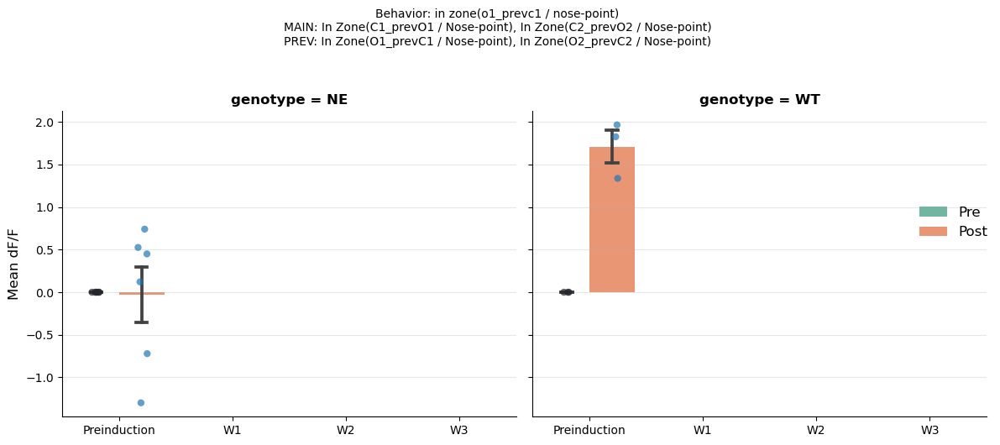

In [109]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_1samp
from statsmodels.stats.multitest import multipletests

# ============================================================
# EPM EVENT EXTRACTION → ONE VALUE PER MOUSE PER WEEK
# ============================================================
def build_epm_prepost_df(main_behaviors,
                         prev_behaviors,
                         pre_s=2.0,
                         post_s=2.0,
                         min_duration_s=2.0):

    rows = []

    main_behaviors = [b.lower() for b in main_behaviors]
    prev_behaviors = [b.lower() for b in prev_behaviors]

    for trial_key, trial_data in combined_trials.items():

        fp_info = fp_traces.get(trial_key, {})
        week = fp_info.get("week")
        mouse_id = fp_info.get("mouse_id", trial_key)

        df = trial_data.copy()

        time_vec = df["Time_video"].values
        signal = df["gcamp_dF_F"].values
        behaviors = np.array([b.lower() for b in df["Behavior"].astype(str).values])

        # ----------------------------------------------------
        # EVENT DETECTION
        # ----------------------------------------------------
        is_main = np.isin(behaviors, main_behaviors).astype(int)

        starts = np.where(np.diff(np.r_[0, is_main]) == 1)[0]
        ends = np.where(np.diff(np.r_[is_main, 0]) == -1)[0]

        if len(starts) == 0:
            continue

        if len(starts) != len(ends):
            m = min(len(starts), len(ends))
            starts, ends = starts[:m], ends[:m]

        fps = 1.0 / np.mean(np.diff(time_vec))
        pre_n = int(pre_s * fps)
        post_n = int(post_s * fps)

        pre_vals = []
        post_vals = []

        # ====================================================
        # EVENT LOOP
        # ====================================================
        for s, e in zip(starts, ends):

            duration = (e - s) / fps
            if duration < min_duration_s:
                continue

            # ------------------------------------------------
            # STRICT WINDOW CHECK (IMPORTANT FIX)
            # ------------------------------------------------
            if s - pre_n < 0 or s + post_n >= len(signal):
                continue

            # ------------------------------------------------
            # PRECEDING BEHAVIOR CHECK
            # ------------------------------------------------
            i = s - 1
            while i >= 0 and behaviors[i] in [
                "in zone(neutralzone/ nose-point)",
                "other"
            ]:
                i -= 1

            if len(prev_behaviors) > 0:
                if i < 0 or behaviors[i] not in prev_behaviors:
                    continue

            # ------------------------------------------------
            # EXTRACT EXACT WINDOW (NO CLIPPING)
            # ------------------------------------------------
            seg = signal[s - pre_n : s + post_n]

            # baseline correction (same logic as your pipeline)
            seg = seg - np.mean(seg[:pre_n])

            pre_vals.append(np.mean(seg[:pre_n]))
            post_vals.append(np.mean(seg[pre_n:]))

        # ----------------------------------------------------
        # ONE VALUE PER MOUSE (AVERAGE ACROSS EVENTS)
        # ----------------------------------------------------
        if len(pre_vals) == 0:
            continue

        rows.append({
            "mouse_id": mouse_id,
            "genotype": fp_info.get("genotype", "Unknown"),
            "week": week,
            "behavior": main_behaviors[0],
            "pre_mean_dFF": np.nanmean(pre_vals),
            "post_mean_dFF": np.nanmean(post_vals)
        })

    return pd.DataFrame(rows)


# ============================================================
# PLOT FUNCTION (UNCHANGED EXCEPT TITLE)
# ============================================================
def plot_mouse_prepost(df,
                        pre_col,
                        post_col,
                        value_name="signal",
                        condition_filter=None,
                        genotype_filter=None):

    data = df.copy()

    if condition_filter is not None:
        data = data[data["condition"] == condition_filter]

    if genotype_filter is not None:
        data = data[data["genotype"] == genotype_filter]

    data = data[data["behavior"] != "Other"]

    if data.empty:
        print("[WARN] No data to plot")
        return

    week_order = ["Preinduction", "W1", "W2", "W3"]
    data["week"] = pd.Categorical(data["week"], categories=week_order, ordered=True)

    behaviors = sorted(data["behavior"].unique())

    for beh in behaviors:

        sub = data[data["behavior"] == beh]

        stats_results = []

        for (genotype, week), grp in sub.groupby(["genotype", "week"]):

            if len(grp) < 2:
                continue

            diff = grp[post_col] - grp[pre_col]
            diff = diff.dropna()

            if len(diff) < 2:
                continue

            stat, p = ttest_1samp(diff, 0)
            cohens_d = diff.mean() / diff.std(ddof=1) if diff.std(ddof=1) != 0 else np.nan

            stats_results.append({
                "genotype": genotype,
                "week": week,
                "t_stat": stat,
                "p_value": p,
                "cohens_d": cohens_d
            })

        stats_df = pd.DataFrame(stats_results)

        if not stats_df.empty:
            _, pvals_corr, _, _ = multipletests(stats_df["p_value"], method="bonferroni")
            stats_df["p_corrected"] = pvals_corr

        print(f"\nStats for {beh}")
        print(stats_df)

        long_sub = sub.melt(
            id_vars=["mouse_id", "genotype", "week"],
            value_vars=[pre_col, post_col],
            var_name="window",
            value_name=value_name
        )

        long_sub["window"] = long_sub["window"].map({
            pre_col: "Pre",
            post_col: "Post"
        })

        g = sns.FacetGrid(long_sub, col="genotype", height=5, aspect=1.1, sharey=True)

        g.map_dataframe(
            sns.barplot,
            x="week",
            y=value_name,
            hue="window",
            palette="Set2",
            errorbar="se",
            capsize=0.1
        )

        g.map_dataframe(
            sns.stripplot,
            x="week",
            y=value_name,
            hue="window",
            dodge=True,
            size=6,
            alpha=0.7
        )

        g.add_legend()

        # ========================================================
        # CLEAN TITLE (MAIN + PREV)
        # ========================================================
        g.fig.suptitle(
            f"Behavior: {beh}\nMAIN: {', '.join(main_behaviors)}\nPREV: {', '.join(prev_behaviors)}",
            y=1.05,
            fontsize=10
        )

        axes = g.axes.flatten()

        for ax in axes:

            y_max = ax.get_ylim()[1]

            for i, week in enumerate(week_order):

                row = stats_df[stats_df["week"] == week]

                if row.empty:
                    continue

                p = row["p_corrected"].values[0]

                if p < 0.001:
                    text = "***"
                elif p < 0.01:
                    text = "**"
                elif p < 0.05:
                    text = "*"
                else:
                    continue

                ax.text(i, y_max * 1.1, text,
                        ha="center", va="bottom", fontsize=12)

        for ax in axes:
            ax.grid(axis="y", alpha=0.3)
            ax.set_xlabel("")

        plt.tight_layout()
        plt.show()


# ============================================================
# RUN (EPM)
# ============================================================
epm_prepost_df = build_epm_prepost_df(
    main_behaviors=[
        'In Zone(O1_prevC1 / Nose-point)',
        'In Zone(O2_prevC2 / Nose-point)'
    ],
    prev_behaviors=[
        'In Zone(C1_prevO1 / Nose-point)',
        'In Zone(C2_prevO2 / Nose-point)'
    ],
    pre_s=2.0,
    post_s=2.0
)

plot_mouse_prepost(
    epm_prepost_df,
    pre_col="pre_mean_dFF",
    post_col="post_mean_dFF",
    value_name="Mean dF/F"
)

In [108]:
print("pre_vals sample:", pre_vals[:10])
print("post_vals sample:", post_vals[:10])

NameError: name 'pre_vals' is not defined

In [105]:
import re
import numpy as np
import matplotlib.pyplot as plt

def valid_preceding_behavior(behaviors, idx, prev_behaviors):
    """
    Returns True if the event at index idx has a valid preceding behavior.
    If the immediate preceding behavior is neutral, check one more step back.
    """
    if idx <= 0:
        return False

    prev1 = behaviors[idx - 1]

    # If neutral → look one more step back
    if prev1 == "In Zone(neutralZone/ nose-point)":
        if idx <= 1:
            return False
        prev2 = behaviors[idx - 2]
        return prev2 in prev_behaviors

    return prev1 in prev_behaviors

# def valid_preceding_behavior(behaviors, idx, prev_behaviors):
#     i = idx - 1

#     while i >= 0:
#         b = behaviors[i]

#         # skip neutral AND Other
#         if b in ["In Zone(neutralZone/ nose-point)", "Other"]:
#             i -= 1
#             continue

#         return b in prev_behaviors

#     return False


def funfunfunction(main_behaviors=None, prev_behaviors=None, min_bout_s=2.0):
    """
    Peri-event dF/F plotting (week × genotype)

    Filters:
        - behavior ∈ main_behaviors
        - preceding behavior ∈ prev_behaviors
        - bout duration ≥ min_bout_s
    """

    # ---------- PARAMETERS ----------
    pre_s = 2.0
    post_s = 4.0

    # ---------- NORMALIZE FP_TRACES AND BEHAVIORS ----------
    for trial_key, fp_info in fp_traces.items():
        wk = fp_info.get("week", "")
        if wk:
            fp_info["week"] = wk.capitalize()
        else:
            m = re.search(r"(Preinduction|W\d+)", trial_key, flags=re.IGNORECASE)
            fp_info["week"] = m.group(1).capitalize() if m else None

    for trial_key, trial_data in combined_trials.items():
        normalized = []
        for b in trial_data["Behavior"].values:
            if b.lower() == "other":
                normalized.append("Other")
            else:
                b_clean = re.sub(r"Zone\s*\d*", "Zone", b, flags=re.IGNORECASE)
                normalized.append(b_clean)
        trial_data["Behavior"] = normalized

    # ---------- COLLECT METADATA ----------
    all_weeks = set()
    all_genotypes = set()

    for trial_key, trial_data in combined_trials.items():
        fp_info = fp_traces[trial_key]
        wk = fp_info.get("week")
        if wk:
            all_weeks.add(wk)
        all_genotypes.add(fp_info.get("genotype"))

    week_order = ["Preinduction", "W1", "W2", "W3"]
    all_weeks = sorted(all_weeks, key=lambda w: week_order.index(w))
    all_genotypes = sorted(all_genotypes)

    print(f"Weeks detected: {all_weeks}")
    print(f"Genotypes detected: {all_genotypes}")

    # ====================================================================== #
    #                           CREATE FIGURE                                #
    # ====================================================================== #

    fig, axes = plt.subplots(
        len(all_weeks),
        len(all_genotypes),
        figsize=(6 * len(all_genotypes), 4 * len(all_weeks)),
        sharey=True,
        sharex=True
    )

    if len(all_weeks) == 1:
        axes = [axes]
    if len(all_genotypes) == 1:
        axes = [[axes[r]] for r in range(len(axes))]

    # ====================================================================== #
    #                         MAIN LOOP                                      #
    # ====================================================================== #

    for r, week in enumerate(all_weeks):
        for c, genotype in enumerate(all_genotypes):
            ax = axes[r][c]

            mouse_segments = []
            mouse_lengths = []

            for trial_key, trial_data in combined_trials.items():
                fp_info = fp_traces[trial_key]

                if fp_info.get("week") != week:
                    continue
                if fp_info.get("genotype") != genotype:
                    continue

                df = trial_data.copy()
                time_vec = df["Time_video"].values
                signal_vec = df["gcamp_dF_F"].values
                behaviors = np.array(df["Behavior"].values)

                # ---------- EVENT STARTS + FILTERING ----------
                is_main = np.isin(behaviors, main_behaviors).astype(int)

                starts = np.where(np.diff(np.r_[0, is_main]) == 1)[0]
                ends   = np.where(np.diff(np.r_[is_main, 0]) == -1)[0]

                valid_starts = []

                for s, e in zip(starts, ends):

                    # bout duration filter (FLEXIBLE)
                    duration_s = time_vec[e] - time_vec[s]
                    if duration_s < min_bout_s:
                        continue

                    # preceding behavior filter
                    if not valid_preceding_behavior(behaviors, s, prev_behaviors):
                        continue

                    valid_starts.append(s)

                starts = valid_starts

                if len(starts) == 0:
                    continue

                fps = 1.0 / np.mean(np.diff(time_vec))
                pre_n = int(pre_s * fps)
                post_n = int(post_s * fps)

                event_segments = []

                for idx in starts:
                    start_idx = idx - pre_n
                    stop_idx = idx + post_n

                    seg = signal_vec[max(0, start_idx):min(stop_idx, len(signal_vec))].copy()
                    if len(seg) == 0:
                        continue

                    pre_end = min(pre_n, len(seg))
                    seg -= np.mean(seg[:pre_end])

                    event_segments.append(seg)

                if len(event_segments) == 0:
                    continue

                # pad per mouse
                max_len = max(len(s) for s in event_segments)
                padded = np.full((len(event_segments), max_len), np.nan)

                for i, s in enumerate(event_segments):
                    padded[i, :len(s)] = s

                mouse_mean = np.nanmean(padded, axis=0)
                mouse_segments.append(mouse_mean)
                mouse_lengths.append(len(mouse_mean))

            # ---------- EMPTY ----------
            if len(mouse_segments) == 0:
                ax.set_title(f"{week} | {genotype}\n(no events)")
                ax.grid(True)
                continue

            # ---------- PLOT ----------
            target_len = max(mouse_lengths)
            padded_mouse = np.full((len(mouse_segments), target_len), np.nan)

            for i, seg in enumerate(mouse_segments):
                padded_mouse[i, :len(seg)] = seg

            t_window = np.linspace(-pre_s, post_s, target_len)

            for i, seg in enumerate(padded_mouse):
                ax.plot(t_window, seg, color=plt.cm.tab20(i % 20), alpha=0.4, lw=1.5)

            grand_mean = np.nanmean(padded_mouse, axis=0)
            ax.plot(t_window, grand_mean, color="black", lw=2.5)

            ax.axvline(0, color='k', linestyle='--')
            ax.set_title(f"{week} | {genotype}")
            ax.grid(True)

            if r == len(all_weeks) - 1:
                ax.set_xlabel("Time (s)")
            if c == 0:
                ax.set_ylabel("ΔF/F (%)")

    plt.suptitle(
        "Peri-event dF/F\n"
        "Main behaviors: " + ", ".join(main_behaviors) + "\n"
        "Preceding behaviors: " + ", ".join(prev_behaviors),
        fontsize=18
    )

    plt.tight_layout()
    plt.show()

In [88]:
import numpy as np
import pandas as pd

all_events = []

for trial_key, trial_data in combined_trials.items():
    fp_info = fp_traces[trial_key]

    df = trial_data.copy()
    time_vec = np.array(df["Time_video"].values)
    behaviors = np.array(df["Behavior"].values)

    # same main behavior definition you used in the function call
    is_main = np.isin(behaviors, [
        'In Zone(c1_prevo1 / nose-point)',
        'In Zone(c2_prevo2 / nose-point)'
    ]).astype(int)

    # detect starts + ends of contiguous bouts
    starts = np.where(np.diff(np.r_[0, is_main]) == 1)[0]
    ends = np.where(np.diff(np.r_[is_main, 0]) == -1)[0]

    for s, e in zip(starts, ends):

        # apply same preceding behavior filter as plotting
        if s == 0:
            continue

        prev1 = behaviors[s - 1]

        if prev1 == "In Zone(neutralZone/ nose-point)":
            if s < 2:
                continue
            prev2 = behaviors[s - 2]
            valid = prev2 in [
                'In Zone(o1_prevc1 / nose-point)',
                'In Zone(o2_prevc2 / nose-point)'
            ]
        else:
            valid = prev1 in [
                'In Zone(o1_prevc1 / nose-point)',
                'In Zone(o2_prevc2 / nose-point)'
            ]

        if not valid:
            continue

        duration = time_vec[e] - time_vec[s]

        all_events.append({
            "trial": trial_key,
            "week": fp_info.get("week"),
            "genotype": fp_info.get("genotype"),
            "start_idx": s,
            "end_idx": e,
            "start_time_s": time_vec[s],
            "end_time_s": time_vec[e],
            "duration_s": duration,
            "behavior": behaviors[s],
            "preceding_behavior": prev1
        })

# convert to dataframe
events_df = pd.DataFrame(all_events)

# show full table
print(events_df)

# optional: quick summaries
print("\n--- Summary ---")
print(events_df.groupby(["week", "genotype"])["duration_s"].describe())

Empty DataFrame
Columns: []
Index: []

--- Summary ---


KeyError: 'week'

In [ ]:
funfunfunction(main_behaviors = ['In Zone(o1_prevc1 / nose-point)', 'In Zone(o2_prevc2 / nose-point)'],
               prev_behaviors = ['In Zone(c1_prevo1 / nose-point)', 'In Zone(c2_prevo2 / nose-point)'])



In [ ]:
import re
import numpy as np
import matplotlib.pyplot as plt

# ---------- PARAMETERS ----------
pre_s = 2.0
post_s = 4.0

# ---------- NORMALIZE FP_TRACES AND BEHAVIORS ----------
for trial_key, fp_info in fp_traces.items():
    wk = fp_info.get("week", "")
    if wk:  # standardize capitalization
        fp_info["week"] = wk.capitalize()
    else:
        m = re.search(r"(Preinduction|W\d+)", trial_key, flags=re.IGNORECASE)
        if m:
            fp_info["week"] = m.group(1).capitalize()
        else:
            fp_info["week"] = None
            print(f"[WARNING] No week found for trial key: {trial_key}")

for trial_key, trial_data in combined_trials.items():
    normalized_behaviors = []
    for b in trial_data["Behavior"].values:
        if b.lower() == "other":
            normalized_behaviors.append("Other")
        else:
            # make agnostic to "Zone", "Zone 2", "Zone 3", etc.
            b_clean = re.sub(r"Zone\s*\d*", "Zone", b, flags=re.IGNORECASE)
            normalized_behaviors.append(b_clean)
    trial_data["Behavior"] = normalized_behaviors

# ---------- COLLECT METADATA ----------
all_behaviors = set()
all_weeks = set()
all_genotypes = set()

for trial_key, trial_data in combined_trials.items():
    fp_info = fp_traces[trial_key]

    behs = np.unique(trial_data["Behavior"].values)
    all_behaviors.update([b for b in behs if b != "Other"])

    wk = fp_info.get("week")
    if wk is not None:
        all_weeks.add(wk)
    else:
        print(f"[WARNING] Week is None for trial {trial_key}")

    all_genotypes.add(fp_info.get("genotype"))

# sort metadata logically
week_order = ["Preinduction", "W1", "W2", "W3"]
all_weeks = sorted(all_weeks, key=lambda w: week_order.index(w))
all_genotypes = sorted(all_genotypes)
all_behaviors = sorted(all_behaviors)

print(f"Weeks detected: {all_weeks}")
print(f"Genotypes detected: {all_genotypes}")
print(f"Behaviors detected: {all_behaviors}")

# =====================================================
#      MAIN LOOP: BEHAVIOR × GENOTYPE × WEEK
# =====================================================
for beh in all_behaviors:

    fig, axes = plt.subplots(
        len(all_weeks),
        len(all_genotypes),
        figsize=(6 * len(all_genotypes), 4 * len(all_weeks)),
        sharey=True,
        sharex=True
    )

    # ensure axes is 2D array
    if len(all_weeks) == 1:
        axes = [axes]
    if len(all_genotypes) == 1:
        axes = [[axes[r]] for r in range(len(axes))]

    for r, week in enumerate(all_weeks):
        for c, genotype in enumerate(all_genotypes):
            ax = axes[r][c]

            mouse_segments = []
            mouse_ids = []
            mouse_lengths = []

            # collect data for this week × genotype × behavior
            for trial_key, trial_data in combined_trials.items():
                fp_info = fp_traces[trial_key]

                if fp_info.get("week") != week:
                    continue
                if fp_info.get("genotype") != genotype:
                    continue

                df = trial_data.copy()
                time_vec = df["Time_video"].values
                signal_vec = df["gcamp_dF_F"].values
                behaviors = df["Behavior"].values

                if beh not in behaviors:
                    continue

                # ---------- EVENT STARTS ----------
                starts = np.where(np.diff(np.r_[0, (behaviors == beh).astype(int)]) == 1)[0]
                if len(starts) == 0:
                    continue

                fps = 1.0 / np.mean(np.diff(time_vec))
                pre_n = int(pre_s * fps)
                post_n = int(post_s * fps)

                event_segments = []
                for idx in starts:
                    start_idx = idx - pre_n
                    stop_idx = idx + post_n
                    seg_raw = signal_vec[max(0, start_idx):min(stop_idx, len(signal_vec))].copy()
                    if len(seg_raw) > 0:
                        pre_end = min(pre_n, len(seg_raw))
                        seg_raw -= np.mean(seg_raw[:pre_end])
                    event_segments.append(seg_raw)

                if len(event_segments) == 0:
                    continue

                # pad event segments to same length for this mouse
                max_len_mouse = max(len(s) for s in event_segments)
                padded_events = []
                for s in event_segments:
                    padded = np.full(max_len_mouse, np.nan)
                    padded[:len(s)] = s
                    padded_events.append(padded)

                mouse_mean = np.nanmean(np.vstack(padded_events), axis=0)
                mouse_segments.append(mouse_mean)
                mouse_ids.append(fp_info.get("mouse_id", trial_key))
                mouse_lengths.append(len(mouse_mean))

            # =================================================
            #     NOTHING FOR THIS WEEK × GENOTYPE CELL
            # =================================================
            if len(mouse_segments) == 0:
                ax.set_title(f"{week} | {genotype}\n(no events)")
                ax.grid(True)
                continue

            # =================================================
            #     PLOT PERI-EVENT TRACES
            # =================================================
            target_len = max(mouse_lengths)
            padded_mouse_segments = []
            for seg in mouse_segments:
                padded = np.full(target_len, np.nan)
                padded[:len(seg)] = seg
                padded_mouse_segments.append(padded)
            padded_mouse_segments = np.vstack(padded_mouse_segments)

            t_window = np.linspace(-pre_s, post_s, target_len)
            for i, seg in enumerate(padded_mouse_segments):
                ax.plot(t_window, seg, color=plt.cm.tab20(i % 20), alpha=0.4, lw=1.5)

            # mean trace
            grand_mean = np.nanmean(padded_mouse_segments, axis=0)
            ax.plot(t_window, grand_mean, color="black", lw=2.5)

            ax.axvline(0, color='k', linestyle='--')
            ax.set_title(f"{week} | {genotype}")
            ax.grid(True)

            if r == len(all_weeks) - 1:
                ax.set_xlabel("Time (s)")
            if c == 0:
                ax.set_ylabel("ΔF/F (%)")

    plt.suptitle(f"Peri-event dF/F — Behavior: {beh}", fontsize=18)
    plt.tight_layout()
    plt.show()

In [ ]:
import re

def extract_week_from_trial_key(trial_key):
    m = re.match(r"(W\d+|Preinduction)", trial_key)
    return m.group(1) if m else None

# Fill 'week' column in your dataframe
mean_summary_df["week"] = mean_summary_df["trial_key"].apply(extract_week_from_trial_key)

mean_summary_df["week"]


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_behavior_facet_genotype_with_lines(mean_df, condition_filter=None):
    """
    For each behavior (excluding 'Other'):
        • One figure with NE/WT facets
        • x-axis = week
        • bars = mean ± SEM
        • points = each mouse
        • lines = connect same mouse across weeks
    """

    df = mean_df.copy()

    # Remove "Other"
    df = df[df["behavior"] != "Other"]

    if df.empty:
        print(f"[WARN] No data available after filtering and excluding 'Other'")
        return

    # --- Ordered weeks and genotype ---
    week_order = ["Preinduction", "W1", "W2", "W3"]
    df["week"] = pd.Categorical(df["week"], categories=week_order, ordered=True)

    genotype_order = ["NE", "WT"]
    df["genotype"] = pd.Categorical(df["genotype"], categories=genotype_order, ordered=True)

    # --- Behaviors to plot ---
    behaviors = sorted(df["behavior"].unique())

    for beh in behaviors:
        sub = df[df["behavior"] == beh]
        if sub.empty:
            continue

        # --- FACET GRID ---
        g = sns.FacetGrid(
            sub,
            col="genotype",
            col_order=genotype_order,
            height=5,
            aspect=1.1,
            sharey=True
        )

        # --- BARPLOT (mean ± SEM) ---
        g.map_dataframe(
            sns.barplot,
            x="week",
            y="mean_dFF",
            order=week_order,
            palette="Set2",
            ci=68,  # approximate SEM
            alpha=0.8,
            width=0.65
        )

        # --- POINTS (each mouse) ---
        g.map_dataframe(
            sns.stripplot,
            x="week",
            y="mean_dFF",
            order=week_order,
            color="black",
            size=6,
            alpha=0.8,
            jitter=False
        )

        # --- LINES CONNECTING SAME MOUSE ACROSS WEEKS ---
        def add_mouse_lines(data, **kwargs):
            mice = data["mouse_id"].unique()
            for m in mice:
                df_m = data[data["mouse_id"] == m].sort_values("week")
                # convert week to numeric positions
                week_pos = [week_order.index(w) for w in df_m["week"]]
                plt.plot(
                    week_pos,
                    df_m["mean_dFF"],
                    marker="o",
                    color="black",
                    alpha=0.5,
                    linewidth=1.2
                )

        g.map_dataframe(add_mouse_lines)

        # --- STYLE & AXES ---
        g.set_axis_labels("Week", "Mean ΔF/F (%)")
        g.set_titles("{col_name}")  # genotype as facet title

        # Fix x-axis ticks to show week names
        for ax in g.axes.flatten():
            ax.set_xticks(range(len(week_order)))
            ax.set_xticklabels(week_order)
            ax.grid(axis="y", alpha=0.3)

        g.fig.suptitle(f"Behavior: {beh} — ΔF/F across weeks (mouse trajectories)",
                       fontsize=16, y=1.05)

        plt.tight_layout()
        plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import re

def plot_behavior_facet_genotype_with_lines(mean_df, condition_filter=None):
    """
    For each behavior (excluding 'Other'):
        • One figure with NE/WT facets
        • x-axis = week
        • bars = mean ± SEM
        • points = each mouse
        • lines = connect same mouse across weeks
    """

    df = mean_df.copy()

    # --- Normalize weeks ---
    def normalize_week(w):
        if pd.isna(w):
            return None
        w = str(w).capitalize()
        m = re.match(r"(Preinduction|W\d+)", w, flags=re.IGNORECASE)
        return m.group(1).capitalize() if m else None

    df["week"] = df["week"].apply(normalize_week)

    # --- Remove rows with invalid or missing weeks ---
    df = df[df["week"].notna()]

    # --- Normalize behaviors (strip "Zone" numbering differences) ---
    def normalize_behavior(b):
        if str(b).lower() == "other":
            return "Other"
        # remove "Zone" prefixes, keep the rest
        b = re.sub(r"in\s*zone\s*\d*", "Zone", str(b), flags=re.IGNORECASE)
        return b.strip()

    df["behavior"] = df["behavior"].apply(normalize_behavior)

    # Remove "Other"
    df = df[df["behavior"] != "Other"]

    if df.empty:
        print(f"[WARN] No data available after filtering and excluding 'Other'")
        return

    # --- Ordered weeks and genotype ---
    week_order = ["Preinduction", "W1", "W2", "W3"]
    df["week"] = pd.Categorical(df["week"], categories=week_order, ordered=True)

    genotype_order = ["NE", "WT"]
    df["genotype"] = pd.Categorical(df["genotype"], categories=genotype_order, ordered=True)

    # --- Behaviors to plot ---
    behaviors = sorted(df["behavior"].unique())

    for beh in behaviors:
        sub = df[df["behavior"] == beh]
        if sub.empty:
            continue

        # --- FACET GRID ---
        g = sns.FacetGrid(
            sub,
            col="genotype",
            col_order=genotype_order,
            height=5,
            aspect=1.1,
            sharey=True
        )

        # --- BARPLOT (mean ± SEM) ---
        g.map_dataframe(
            sns.barplot,
            x="week",
            y="mean_dFF",
            order=week_order,
            palette="Set2",
            ci=68,  # approximate SEM
            alpha=0.8,
            width=0.65
        )

        # --- POINTS (each mouse) ---
        g.map_dataframe(
            sns.stripplot,
            x="week",
            y="mean_dFF",
            order=week_order,
            color="black",
            size=6,
            alpha=0.8,
            jitter=False
        )

        # --- LINES CONNECTING SAME MOUSE ACROSS WEEKS ---
        def add_mouse_lines(data, **kwargs):
            mice = data["mouse_id"].unique()
            for m in mice:
                df_m = data[data["mouse_id"] == m].sort_values("week")
                # convert week to numeric positions
                week_pos = [week_order.index(w) for w in df_m["week"]]
                plt.plot(
                    week_pos,
                    df_m["mean_dFF"],
                    marker="o",
                    color="black",
                    alpha=0.5,
                    linewidth=1.2
                )

        g.map_dataframe(add_mouse_lines)

        # --- STYLE & AXES ---
        g.set_axis_labels("Week", "Mean ΔF/F (%)")
        g.set_titles("{col_name}")  # genotype as facet title

        # Fix x-axis ticks to show week names
        for ax in g.axes.flatten():
            ax.set_xticks(range(len(week_order)))
            ax.set_xticklabels(week_order)
            ax.grid(axis="y", alpha=0.3)

        g.fig.suptitle(
            f"Behavior: {beh} — ΔF/F across weeks (mouse trajectories)",
            fontsize=16, y=1.05
        )

        plt.tight_layout()
        plt.show()

In [ ]:
plot_behavior_facet_genotype_with_lines(mean_summary_df)



In [ ]:
# ==========================================================
# Quantify occurrences of behaviours automatically
# Per animal, per week (kernel-smoothed) with variable-width bins
# ==========================================================

from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt

# ----------------------------------------------------------
# Helper: parse week + mouse ID from fp_traces key
# ----------------------------------------------------------
def parse_trial_key(key):
    week = key.split("__")[0]
    parts = key.split("__")
    mouse_part = next(p for p in parts if p.startswith("ID"))
    mouse_id = mouse_part.split("_")[0]  # remove genotype suffix
    return week, mouse_id


# ----------------------------------------------------------
# STEP 1 — Build kernel-smoothed timelines
# ----------------------------------------------------------
for trial_key, trial_data in fp_traces.items():
    try:
        tl = trial_data["timeline_open_closed"]

        tl_kernel = smoothing_kernel(
            tl,
            grainularity=0.1,
            kernel_size=20
        )

        trial_data["timeline_kernel"] = tl_kernel

    except Exception as e:
        print(f"[WARN] Kernel smoothing failed for {trial_key}: {e}")


# ----------------------------------------------------------
# STEP 2 — Collect durations per animal per week
# Automatically detect behaviours
# ----------------------------------------------------------
durations_by_mouse = defaultdict(lambda: defaultdict(list))

for trial_key, trial_data in fp_traces.items():

    if "timeline_kernel" not in trial_data:
        continue

    week, mouse_id = parse_trial_key(trial_key)
    tl = trial_data["timeline_kernel"]

    # Detect all behaviours in this timeline
    behaviours = tl["Behavior"].unique()

    for beh in behaviours:
        durations = tl.loc[tl["Behavior"] == beh, "Duration_s"]
        durations_by_mouse[(week, mouse_id)][beh].extend(durations)


# ----------------------------------------------------------
# STEP 3 — Create variable-width bins
# ----------------------------------------------------------
all_durations = [
    d for mouse_data in durations_by_mouse.values()
    for beh_durations in mouse_data.values()
    for d in beh_durations
]

if len(all_durations) == 0:
    print("No behaviour durations found.")
else:
    # Variable-width bins
    bins = [0, 5, 10, 20, 30, 60, 120]
    max_duration = max(all_durations)
    # Add additional 60 s bins beyond 120 s if needed
    while bins[-1] < max_duration + 60:
        bins.append(bins[-1] + 60)

    # Create bin labels
    bin_labels = [f"{int(bins[i])}-{int(bins[i+1])} s" for i in range(len(bins)-1)]
    x = np.arange(len(bin_labels))  # categorical x-axis positions


# ----------------------------------------------------------
# STEP 4 — Plot per animal per week
# ----------------------------------------------------------
for (week, mouse_id), beh_data in durations_by_mouse.items():

    plt.figure(figsize=(10, 6))
    width = 0.8 / len(beh_data)  # auto-adjust width if more than 2 behaviours
    offsets = np.linspace(-0.4 + width/2, 0.4 - width/2, len(beh_data))

    for i, (beh, durations) in enumerate(beh_data.items()):
        counts, _ = np.histogram(durations, bins=bins)
        plt.bar(x + offsets[i], counts, width=width, label=beh)

    plt.xlabel("Bout Duration (s)")
    plt.ylabel("Number of Occurrences")
    plt.title(f"{mouse_id} — {week}\nKernel-Smoothed Behaviour Bout Counts")
    plt.xticks(x, bin_labels, rotation=45)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
